 # <center> Checkerboard Data Analysis </center>

        This notebook is the second one of the Analysis Pipeline. If you haven't run the first one (Preprocessing), you don't have the files needed to run this one. In this notebook, you will use phy sorted cluster spikes of a checkerboard recording to compute clusters raster plots, ganglion cells STA and fit ellipses on their receptive fields.

In [1]:
import os
import params
from utils import *
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.optimize import curve_fit
from scipy.ndimage import convolve
from matplotlib.gridspec import GridSpec
from PIL import Image

### Cell 1: Load data

Loading data and mea info

In [2]:
"""
    Variables
    
    DO NOT CHANGE VALUES HERE UNLESS DEBUG/SPECIFIC USE
    
    You will find here all variables used in this notebook cell. They should always refere to your 'params.py' file
    except if you want to manually change some variable only for this run (i.e. debugging). You may have to add those
    variable into the function you want to adapt as only the minimal amount of var are currently given to functions as inputs.
"""

#Link to the actual raw files from the recording listed in the input_file
recording_directory     = params.recording_directory

# Directory where preprocessing info are saved
output_directory        = params.output_directory

#folder in which the triggers are saved
triggers_directory      = params.triggers_directory

#name of your experiment for saving the triggers
exp                     = params.exp

nb_frames_by_sequence   = params.nb_frames_by_sequence

fs  = params.fs

mea = params.MEA

recording_names = params.recording_names

"""
    Inputs
"""
#Frequency at which your stim has been played
stimulus_frequency = 30 # Change the frequency

nb_checks_x = 30   ##### Here change the number of checks if necessary
nb_checks_y = 30   ##### Here change the number of checks if necessary


"""
    Processing
"""

#Getting right recording name
print('Which of the following is the checkerboard :')
for num, rec in enumerate(recording_names):
    print(f'\t{num} --> {rec}')
recording_number = int(input('Checkerboard number : '))
checkerboard_name = recording_names[recording_number]
#Checkerboard file where triggers were recorded
triggers_file = os.path.normpath(os.path.join(triggers_directory,r"{}_{}_triggers.pkl".format(exp,checkerboard_name)))

#File where spikes were extracted from preprocessing
neurons_file  = os.path.normpath(os.path.join(output_directory,r'{}_fullexp_neurons_data.pkl'.format(exp)))

print('Selected recording: {}\n'.format(checkerboard_name))

#load the spikes of all the recordings of the experiment
all_recs_spikes = load_obj(neurons_file)

#load checkerboard triggers
triggers_data = load_obj(triggers_file)

#keep only the spikes recorded during checkerboard
checkerboard_spikes = get_recording_spikes(checkerboard_name, all_recs_spikes)
cells_id = list(checkerboard_spikes.keys())
triggers = triggers_data['indices']/fs
nb_repeats = int(len(triggers)/nb_frames_by_sequence)
duration_sequence = int(nb_frames_by_sequence/stimulus_frequency)

print("Checkerboard Stats :\n\t- {} min total duration \n\t- {} triggers \n\t- {} complete sequences\n\t- {} seconds per sequence\n".format(
      int(triggers_data['duration']/fs/60),len(triggers),
      nb_repeats, duration_sequence))

nb_frames = int((nb_repeats)*int(nb_frames_by_sequence/2))

stimulus_path = os.path.normpath(os.path.join(output_directory, "checkerboard_{}x{}checks_{}frames.npy".format(nb_checks_x,nb_checks_y,nb_frames)))

if os.path.isfile(stimulus_path):
    print("Stimulus file exists. Loaded from :\t {}".format(stimulus_path))
    checkerboard = np.load(stimulus_path)
    
else:
    print("Reconstructing the stimulus...")
    checkerboard = checkerboard_from_binary(nb_frames, nb_checks_x, nb_checks_y, checkerboard_file = stimulus_path, binary_source_path=params.binary_source_path, mea=mea)

print('Total : {} neurons saved \n\nClusters id :\n{}\n'.format(len(checkerboard_spikes.keys()),cells_id))


Which of the following is the checkerboard :
	0 --> 00_CheckerboardAcclim_25D50%_30x20_30Hz.raw
	1 --> 01_Checkerboard_25D50%_20x30_30Hz.raw
	2 --> 02_Chirp_20reps_25ND50%_50Hz.raw
	3 --> 03_DG_25ND50%_2sT_50Hz.raw
	4 --> 04_MultiSpots_50reps_25ND50%_40Hz.raw
	5 --> 05_MultiSpots_25ND50%_40Hz.raw
Checkerboard number : 1
Selected recording: 01_Checkerboard_25D50%_20x30_30Hz.raw

Checkerboard Stats :
	- 46 min total duration 
	- 80375 triggers 
	- 66 complete sequences
	- 40 seconds per sequence

Stimulus file exists. Loaded from :	 /media/samuele/Samuele_2/20230303_MultiSpots/Analysis/checkerboard_30x30checks_39600frames.npy
Total : 339 neurons saved 

Clusters id :
[8, 11, 20, 25, 27, 29, 34, 41, 52, 60, 64, 66, 67, 70, 81, 88, 98, 126, 133, 140, 146, 154, 158, 161, 162, 163, 173, 180, 183, 186, 191, 199, 200, 201, 216, 219, 221, 227, 228, 234, 247, 248, 257, 258, 259, 270, 271, 272, 275, 277, 278, 283, 284, 300, 306, 310, 311, 313, 316, 320, 325, 329, 330, 337, 339, 353, 361, 365, 370

### Cell 2 : Plot Raster plots and PSTH

Analysis on repeated sequence

#### <center><i>REQUIRES CELL 1 RUN</center>

Building rasters...


  0%|          | 0/339 [00:00<?, ?it/s]

Ploting...


  0%|          | 0/361 [00:00<?, ?it/s]

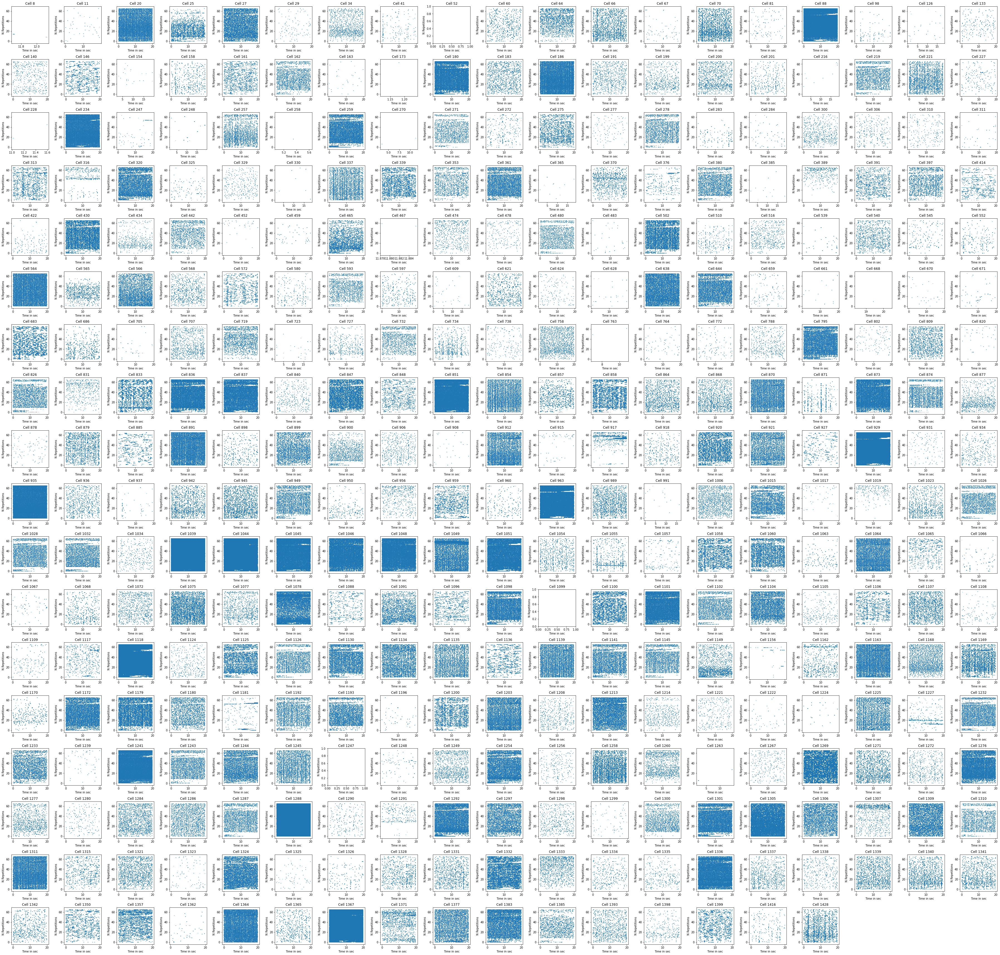

  0%|          | 0/339 [00:00<?, ?it/s]

--- Cell Done ---


In [3]:
"""
    Variable
    
    You will find here all variables used in this notebook cell. They should always refere to your 'params.py' file
    except if you want to manually change some variable only for this run (i.e. debugging). You may have to add those
    variable into the function you want to adapt as only the minimal amount of var are currently given to functions as inputs.
"""
#length of each sequence composed of half repeated sequence and half random sequence

nb_frames_by_sequence = params.nb_frames_by_sequence


"""
    Input
"""
save_fig = True

ploting = True

"""
    Processing
"""

raster_data = {}
print('Building rasters...')
for (cell_id, spike_times) in tqdm(checkerboard_spikes.items()):

    # Get rasters on repeated sequence
    raster_data[cell_id] = extract_from_sequence(spike_times, triggers, nb_repeats, stim_frequency = stimulus_frequency)


"""
    Plotting
"""

#Plot all the rasters. Takes a few seconds.
if ploting :
    size = int(math.sqrt(len(cells_id)))+1

    fig, axs = plt.subplots(nrows = size, ncols=size, figsize = (50,50))
    print('Ploting...')
    for i in tqdm(range(size**2)):
        ax = axs[i//size,i%size]
        if i < len(cells_id):
            ax.eventplot(raster_data[cells_id[i]]["spike_trains"])
            ax.set(title = "Cell {}".format(cells_id[i]),xlabel='Time in sec', ylabel='N Repetitions')
        else : ax.set_visible(False)


    plt.tight_layout()
    plt.show(block=False)
    plt.close('all')

"""
    Saving
"""

if save_fig:
    
    fig_directory = os.path.normpath(os.path.join(output_directory,r'Check_raster_figs_{}'.format(recording_number)))
    if not os.path.isdir(fig_directory): os.makedirs(fig_directory)
    
    for cell_nb in tqdm(cells_id):
        fig, axs = plt.subplots(nrows = 2,ncols = 1, sharex=True, gridspec_kw={'height_ratios': [3, 1]}, figsize=(10,10))

        plt.suptitle(f'Cell {cell_nb}')
        
        ax_rast = axs[0]
        ax_rast.eventplot(raster_data[cell_nb]["spike_trains"])
        ax_rast.set(title = "Raster plot", ylabel='N Repetitions')

        ax_psth = axs[1]
        width = (raster_data[cell_nb]["repeated_sequences_times"][0][0]/int(nb_frames_by_sequence/2))
        seq_lenght=raster_data[cell_nb]["repeated_sequences_times"][0][1]-raster_data[cell_nb]["repeated_sequences_times"][0][0]
        ax_psth.bar(np.linspace(0,seq_lenght,int(nb_frames_by_sequence/2))+width/2, raster_data[cell_nb]["psth"], width=1.3*width)
        ax_psth.set(xlabel='Time in sec', ylabel='Firing rate (spikes/s)')

        plt.subplots_adjust(wspace=0, hspace=0)
        fig_file = os.path.join(fig_directory,f'Cell_{cell_nb}.png')
        plt.savefig(fig_file, dpi=fig.dpi)
        plt.clf()
        plt.close()
    np.save(os.path.join(fig_directory,'Check_rasters_data'), raster_data)
print('--- Cell Done ---')


### Cell 4 : Sanity check one cell at a time

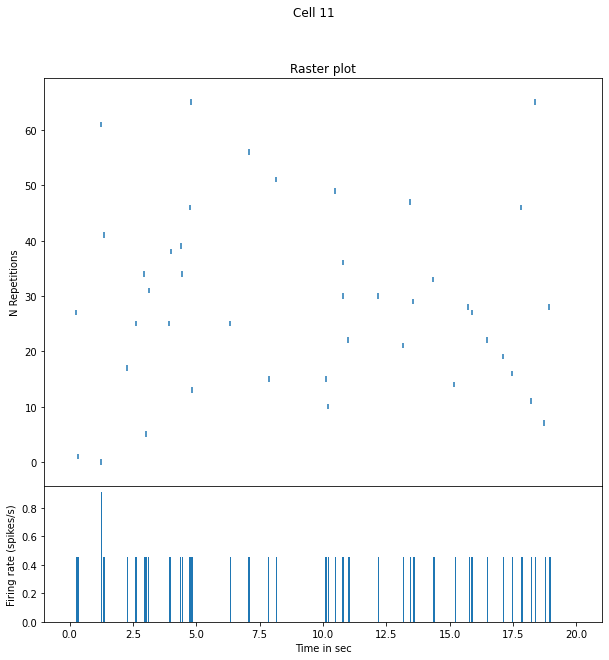

In [5]:
"""
    Input
"""

cell_nb = 11

"""
    Plotting
"""

#Plot all the rasters. Takes a few seconds.

fig, axs = plt.subplots(nrows = 2,ncols = 1, sharex=True, gridspec_kw={'height_ratios': [3, 1]}, figsize=(10,10))
ax_rast = axs[0]
ax_rast.eventplot(raster_data[cell_nb]["spike_trains"])
ax_rast.set(title = "Raster plot", ylabel='N Repetitions')

ax_psth = axs[1]
width = (raster_data[cell_nb]["repeated_sequences_times"][0][0]/int(nb_frames_by_sequence/2))
seq_lenght=raster_data[cell_nb]["repeated_sequences_times"][0][1]-raster_data[cell_nb]["repeated_sequences_times"][0][0]
ax_psth.bar(np.linspace(0,seq_lenght,int(nb_frames_by_sequence/2))+width/2, raster_data[cell_nb]["psth"], width=1.3*width)
ax_psth.set(xlabel='Time in sec', ylabel='Firing rate (spikes/s)')


plt.suptitle(f'Cell {cell_nb}')
plt.subplots_adjust(wspace=0, hspace=0)
plt.savefig('plot.svg', dpi=fig.dpi)
plt.show(block=False)
plt.close(fig)

### Cell 5 : Compute STA

Explaining to do

#### <center><i>REQUIRES CELL 1 RUN</center>

In [7]:
"""
    Variable
    
    You will find here all variables used in this notebook cell. They should always refere to your 'params.py' file
    except if you want to manually change some variable only for this run (i.e. debugging). You may have to add those
    variable into the function you want to adapt as only the minimal amount of var are currently given to functions as inputs.
"""
#length of each sequence composed of half repeated sequence and half random sequence

nb_frames_by_sequence   = params.nb_frames_by_sequence

sta_temporal_dimension  = params.sta_temporal_dimension

# Directory where 3D STAs are saved
output_directory        = params.output_directory


"""
    Processing
"""

sta_data = {}
print('Building STAs...')
for (cell_id, spike_times) in tqdm(checkerboard_spikes.items()):
    
    # Get spikes on random sequences
    sta_data[cell_id]        = extract_from_sequence(spike_times, triggers, nb_repeats, stimulus_frequency, sequence_portion=(0,0.5))
    # Compute sta of the cell
    sta_3D = compute_3D_sta(sta_data[cell_id], checkerboard, stimulus_frequency, cluster_id=cell_id) 
    sta_data[cell_id]['sta_3D'] = sta_3D
    
    
sta_data_file = os.path.normpath(os.path.join(output_directory, 'sta_data_3D.pkl'))
save_obj(sta_data,sta_data_file)
    

Building STAs...


  0%|          | 0/339 [00:00<?, ?it/s]

Cluster 52 has no spikes, no sta can be found...
Cluster 258 has no spikes, no sta can be found...


/media/samuele/Samuele_2/20230303_MultiSpots/Pipeline/utils.py:544: RuntimeWarning: invalid value encountered in true_divide
  sta /= np.max(np.abs(sta))


Cluster 1099 has no spikes, no sta can be found...
Cluster 1247 has no spikes, no sta can be found...


### If needed, check the single cell's 3D sta

dict_keys([8, 11, 20, 25, 27, 29, 34, 41, 52, 60, 64, 66, 67, 70, 81, 88, 98, 126, 133, 140, 146, 154, 158, 161, 162, 163, 173, 180, 183, 186, 191, 199, 200, 201, 216, 219, 221, 227, 228, 234, 247, 248, 257, 258, 259, 270, 271, 272, 275, 277, 278, 283, 284, 300, 306, 310, 311, 313, 316, 320, 325, 329, 330, 337, 339, 353, 361, 365, 370, 376, 380, 385, 389, 391, 397, 414, 422, 430, 434, 442, 452, 459, 465, 467, 474, 478, 480, 483, 502, 510, 516, 539, 540, 545, 552, 564, 565, 566, 568, 572, 580, 593, 597, 609, 621, 624, 628, 638, 644, 659, 661, 668, 670, 671, 683, 686, 705, 707, 719, 723, 727, 732, 734, 738, 758, 763, 764, 772, 788, 795, 802, 809, 820, 826, 831, 833, 836, 837, 840, 847, 848, 851, 854, 857, 858, 864, 868, 870, 871, 873, 874, 877, 878, 879, 885, 891, 898, 899, 900, 906, 908, 912, 915, 917, 918, 920, 921, 927, 929, 931, 934, 935, 936, 937, 942, 945, 949, 950, 956, 959, 960, 963, 989, 991, 1006, 1015, 1017, 1019, 1023, 1026, 1028, 1032, 1034, 1039, 1044, 1045, 1046, 1048, 104

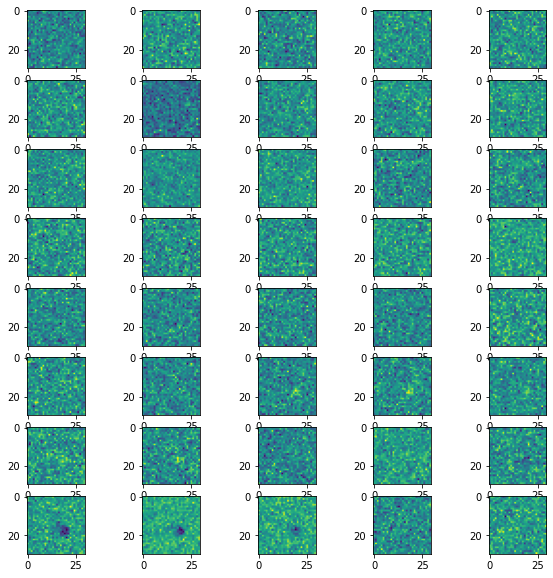

In [8]:
cell_id = 66
print(sta_data.keys())

fig = plt.figure(figsize=(10,10))
gs = GridSpec(8, 5, figure=fig)
for i in range(40):
    ax = fig.add_subplot(gs[i//5,i%5])
    ax.imshow(sta_data[cell_id]['sta_3D'][i])
plt.show(block=False)
plt.close(fig)


### Cell 6 : Fitting ellipses

#### <center><i>REQUIRES CELL 1 RUN AND CELL 4 OUTPUT </center>

  0%|          | 0/339 [00:00<?, ?it/s]

No ellipse fit on cell 52
No ellipse fit on cell 258
Error Could not fit ellipse 270


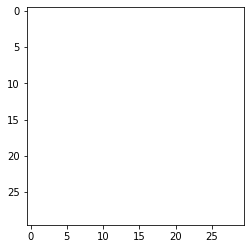

No ellipse fit on cell 1099
No ellipse fit on cell 1247
--Fitting Done--


In [3]:
"""
    Variable
    
    You will find here all variables used in this notebook cell. They should always refere to your 'params.py' file
    except if you want to manually change some variable only for this run (i.e. debugging). You may have to add those
    variable into the function you want to adapt as only the minimal amount of var are currently given to functions as inputs.
"""

output_directory = params.output_directory

"""
    Input
"""
sta_data_file = os.path.normpath(os.path.join(output_directory, 'sta_data_3D.pkl'))

"""
    Processing
"""

sta_data = load_obj(sta_data_file)

for cell_id in tqdm(sta_data):
    
    sta_3D = sta_data[cell_id]['sta_3D']
    
    if np.max(np.abs(sta_3D)) == 0:
        
        print(f'No ellipse fit on cell {cell_id}')
        sta_data[cell_id]["center_analyse"]   = {'Spatial':np.zeros(checkerboard[0].shape), 'Temporal':np.zeros(checkerboard.shape[0]), 'EllipseCoor':[0, 0, 0, 0.001, 0.001, 0], 'Cell_delay':np.nan}
        sta_data[cell_id]["surround_analyse"] = {'Spatial':np.zeros(checkerboard[0].shape), 'Temporal':np.zeros(checkerboard.shape[0]), 'EllipseCoor':[0, 0, 0, 0.001, 0.001, 0], 'Cell_delay':np.nan}
        sta_data[cell_id]["analyse_sta"]      = {'Spatial':np.zeros(checkerboard[0].shape), 'Temporal':np.zeros(checkerboard.shape[0]), 'EllipseCoor':[0, 0, 0, 0.001, 0.001, 0], 'Cell_delay':np.nan}

        continue
    
    sta_data[cell_id]["center_analyse"]   = analyse_sta_matias(sta_3D, cell_id)
#     sta_data[cell_id]["surround_analyse"] = analyse_sta_gab(sta_3D, cell_id)
#     sta_data[cell_id]["analyse_sta"]      = analyse_sta(sta_3D, cell_id)
    
fitted_file = os.path.normpath(os.path.join(output_directory,'sta_data_3D_fitted.pkl'))
save_obj(sta_data, fitted_file)
    
print('--Fitting Done--')

# Plotting STAs and their ellipses

In [4]:
fig_directory = os.path.normpath(os.path.join(output_directory,r'Stas_figs'))
if not os.path.isdir(fig_directory): os.makedirs(fig_directory)

sta_data=np.load(os.path.join(output_directory,'sta_data_3D_fitted.pkl'),allow_pickle=True)

for cell_id in tqdm(cells_id[0:]):
    fig, axs = plt.subplots(nrows = 1,ncols = 2, figsize=(15,7))

    plt.suptitle(f'Cell {cell_id}')
    sta=sta_data[cell_id]["center_analyse"]
    ax = axs[0]
    ax.imshow(sta['Spatial'])
    ax.set(title = "Spatial STA")

    ax = axs[1]
    try:
        ax = plot_sta(ax, sta['Spatial'],sta['EllipseCoor'])
    except:
        ax.imshow(sta_data[cell_id]["center_analyse"]['Spatial'])

#     plt.subplots_adjust(wspace=0, hspace=0)
    fig_file = os.path.join(fig_directory,f'Cell_{cell_id}.png')
    plt.savefig(fig_file, dpi=fig.dpi)
    plt.clf()
    plt.close()

  0%|          | 0/339 [00:00<?, ?it/s]

# --------- end of the notebook---------------------------------------

# -----------work in progress---------------

### Cell 7 : Compare fits - Spatial STA

matias : [-4.18357731e-01  4.12292292e+00  1.11875504e-15  4.32207463e-01
  1.03938894e+01  5.36633434e+00]
mixed : [2.80474318e-01 1.48562417e+01 1.45471593e+01 2.92867912e+00
 8.37751930e-01 8.05356359e-51]


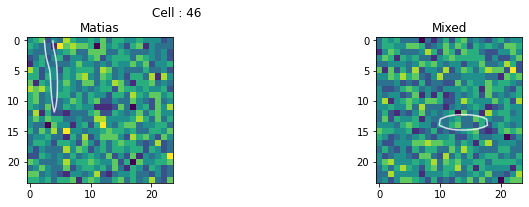

--- Ploting Done ---
matias : [ 0.99835717  9.44988989 17.80077402  0.1         4.83175492 34.28367434]
mixed : [ 0.80617168 13.09862588 12.91324857  0.1         4.78918163 39.4586059 ]


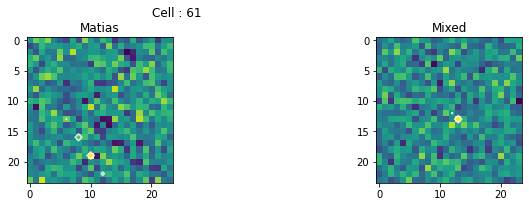

--- Ploting Done ---
matias : [-1.07979102 12.26195125 10.32518531  0.33855651  1.10711846 35.04831107]
mixed : [2.34416614e-09 1.10000000e+01 9.00000000e+00 3.76199694e-01
 1.67335309e-01 7.49754376e+00]


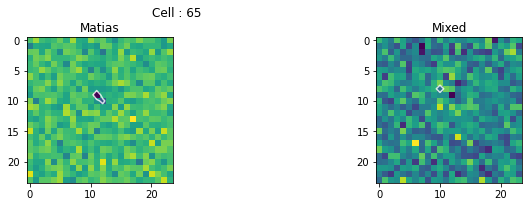

--- Ploting Done ---
matias : [ 1.19915416 13.50500063 10.43624567  0.82080984  0.67435548 19.96600719]
mixed : [ 2.         13.63491066 10.39244102  0.46264739  0.43468346 77.94142173]


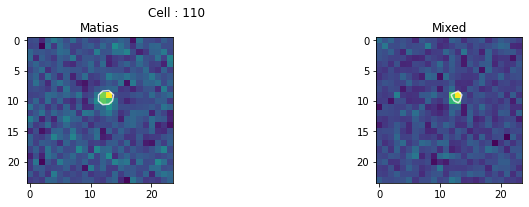

--- Ploting Done ---
matias : [-0.93786108 11.64290476 11.87775865  0.90857208  1.06574405 41.18220485]
mixed : [ 1.05222445 11.70787573 11.8858744   0.56452986  0.8850636  48.46272288]


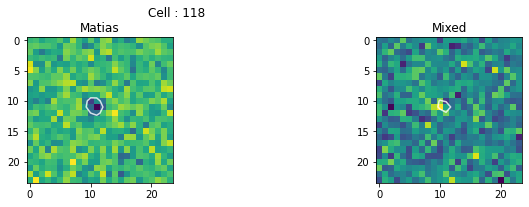

--- Ploting Done ---
matias : [-2.00000000e+00  1.19060890e+01  1.14918626e+01  5.92677128e-01
  4.21401618e-01  3.10976403e-26]
mixed : [1.44533458e+00 1.18644959e+01 1.15727206e+01 5.23729585e-01
 5.27558549e-01 4.15977249e-21]


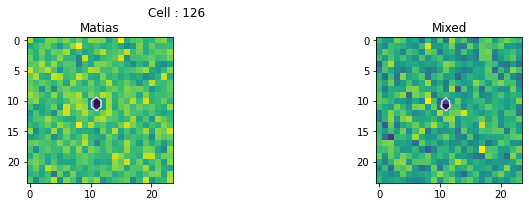

--- Ploting Done ---
matias : [-2.         13.32676595 11.1944969   0.58537809  0.32210664 55.38245711]
mixed : [ 2.         13.23089098 11.29843996  0.45776632  0.31502303 52.29957997]


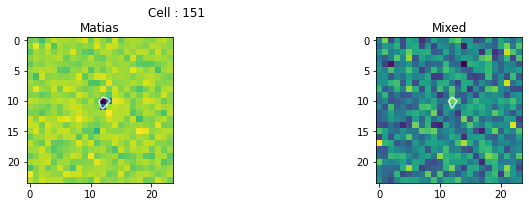

--- Ploting Done ---
matias : [-1.73508569 23.95615057 16.36601337  1.42489685  0.32609708  1.77485192]
mixed : [ 0.08718233 10.69183341 11.62258308 10.1779264   5.22306827 41.11813325]


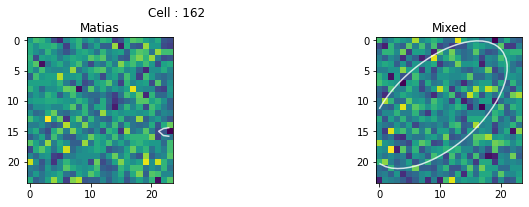

--- Ploting Done ---
matias : [-2.         13.62936097 13.47512977  0.51328967  0.47617397 68.70472656]
mixed : [ 1.85956763 13.68405419 13.42739172  0.4774621   0.425276   57.14335619]


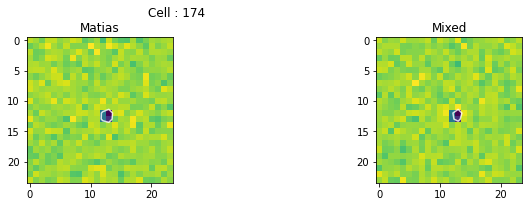

--- Ploting Done ---
matias : [ 1.99999999 10.3167705  12.48506295  0.96717906  0.39510149  9.86109958]
mixed : [ 1.99999999 10.48827999 12.34956084  0.43315039  0.72739789 10.07581555]


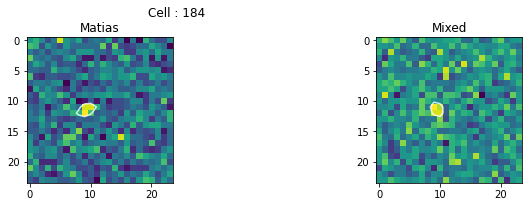

--- Ploting Done ---
matias : [5.59868064e-01 1.39999984e+01 6.40880678e-01 1.10089563e-01
 3.53122203e-01 1.70806671e-03]
mixed : [ 2.         14.26384005 11.64175647  0.35681668  0.61640402 40.29668207]


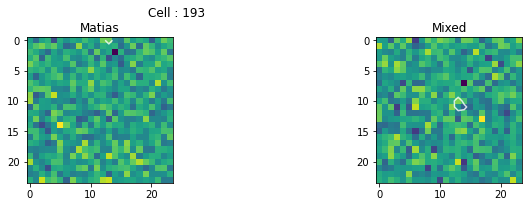

--- Ploting Done ---
matias : [-0.40908491 12.88138427  6.20175871  0.49594118  4.6440823  26.60769066]
mixed : [ 2.         14.65749406 10.38513415  0.33265123  0.63710045 43.0593156 ]


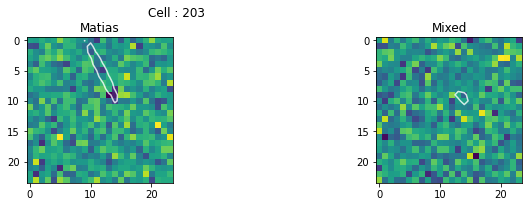

--- Ploting Done ---
matias : [ -1.12237871  15.69320645  12.93326339   0.57923296   0.77035251
 140.86763268]
mixed : [ 1.1970866  15.73379012 12.95629962  0.59947068  0.40731698 46.36895261]


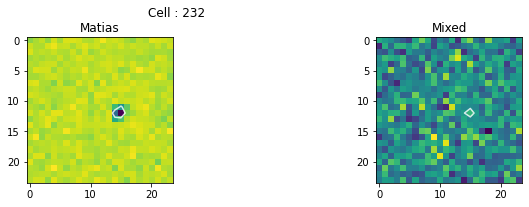

--- Ploting Done ---
matias : [-0.36869343 12.64840286 13.95937036  0.79917277  2.28109972 35.83206257]
mixed : [ 1.99999875 12.38259506 13.39983961  0.17880771  0.93001952 24.19886808]


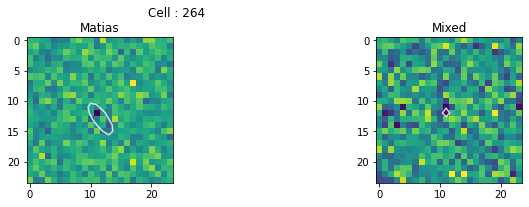

--- Ploting Done ---
matias : [-1.99999847 12.9377774  11.41605764  0.6681686   0.35336964  4.36384495]
mixed : [ 1.99840741 13.22564898 11.91778091  0.20264246  0.72372281 26.99002722]


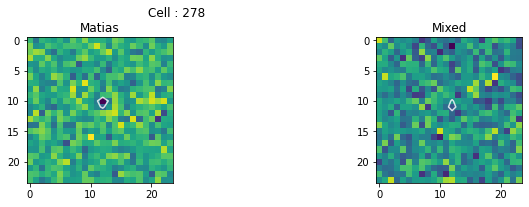

--- Ploting Done ---
matias : [ 0.29822765 11.95539353 10.54629618  0.98531142  0.10020738 29.02341018]
mixed : [ 2.         14.99176889 10.47557345  0.19832282  0.71775387 23.99864833]


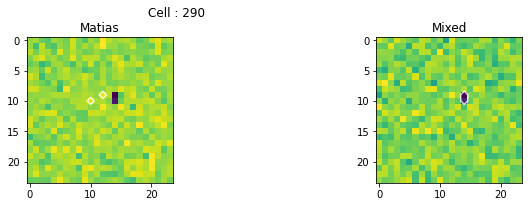

--- Ploting Done ---
matias : [-2.         14.57956761 15.1146484   0.5410053   0.34560053 77.39255777]
mixed : [  1.68881753  14.63491953  15.06711992   0.33397484   0.39290604
 142.82692413]


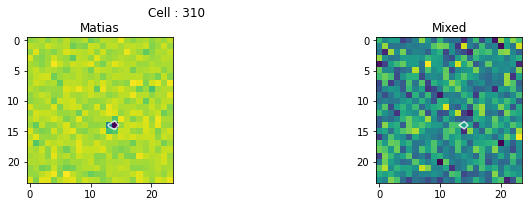

--- Ploting Done ---
matias : [ 1.99999999 12.62631756 11.18152263  0.31435462  0.49116241 62.09940479]
mixed : [6.20183312e-10 1.10000000e+01 1.00000000e+01 1.38483435e-01
 4.08178659e-01 1.36767373e-01]


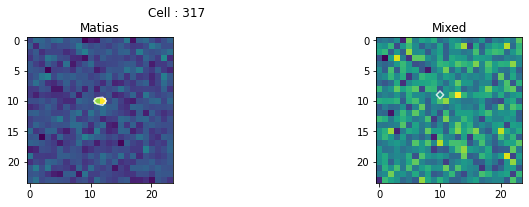

--- Ploting Done ---
matias : [-1.14782407e+00  1.07280795e+01  1.11030761e+01  8.09684687e-01
  9.57637379e-01  1.22983404e-25]
mixed : [ 1.99999988 10.4864254  10.83997945  0.42458393  0.58056263  8.7578822 ]


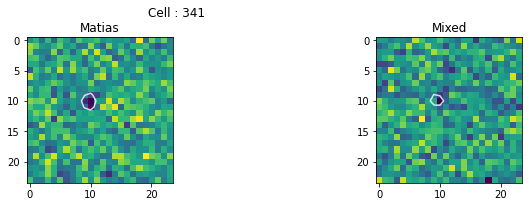

--- Ploting Done ---
matias : [-1.12864343  7.66850164  5.33706384  0.1         4.29083067 51.75815935]
mixed : [ 2.          5.43290788  1.27949874  0.73209801  0.28953471 53.21450049]


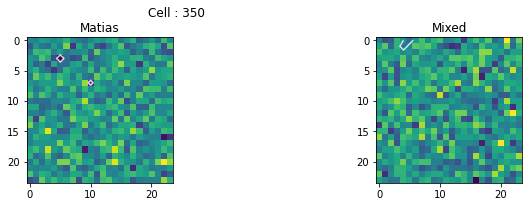

--- Ploting Done ---
matias : [ 1.2895424  12.62831951 14.83034288  0.53851588  0.75650948 86.19616702]
mixed : [ 1.43821383 12.50917915 14.86486298  0.61334058  0.4611528  14.26105978]


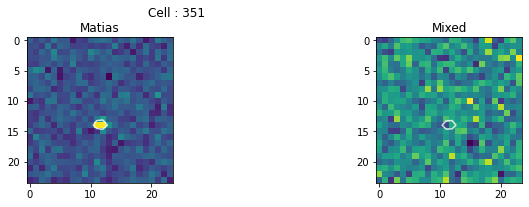

--- Ploting Done ---
matias : [-2.         14.54410714 13.62684984  0.65139098  0.39638954 63.29275559]
mixed : [ 1.84106856 14.59057238 13.64120881  0.68461951  0.33625165 45.86394405]


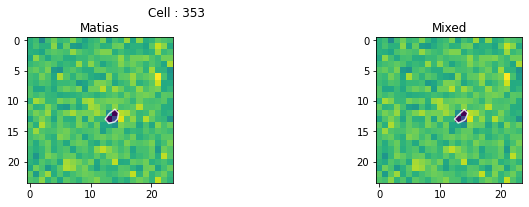

--- Ploting Done ---
matias : [6.38005325e-02 1.38391984e+01 5.50156900e+00 2.40000000e+01
 4.90277910e+00 1.33958890e-30]
mixed : [ 0.06524056 23.99975652 16.9022088  24.         21.85992174 39.06896275]


/tmp/ipykernel_37596/1800254095.py:6: UserWarning: No contour levels were found within the data range.
  ax.contour(np.abs(gaussian),levels = [level_factor*np.max(np.abs(gaussian))], colors='w',linestyles = 'solid', alpha = 0.8)


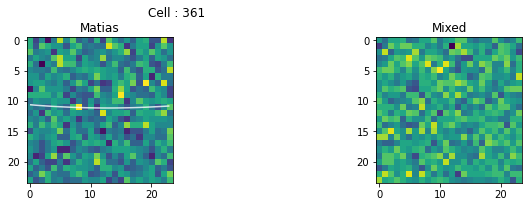

--- Ploting Done ---
matias : [ 1.32693554 12.57128729 11.15215097  0.49979924  0.63129058 86.55480151]
mixed : [ 1.99999996 12.59978896 11.22031367  0.32003321  0.41743227 90.58178276]


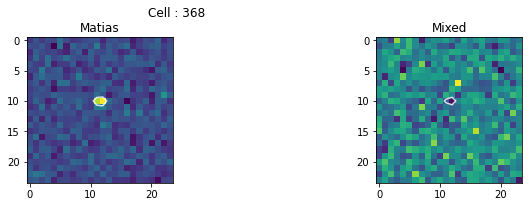

--- Ploting Done ---
matias : [ 1.18614108 14.31754092 13.29885991  0.97139167  0.65758577 60.25793316]
mixed : [-2.18292228e-12  1.30000000e+01  1.20000000e+01  2.96615344e-01
  1.41373636e-01  3.05738085e+01]


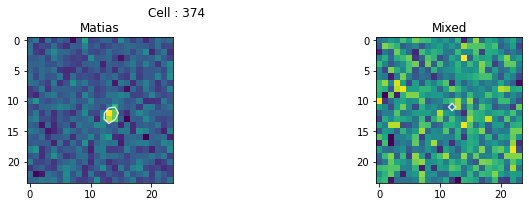

--- Ploting Done ---
matias : [1.17342739e+00 1.11903962e+01 1.15812281e+01 1.16468796e+00
 5.61119082e-01 7.62846388e-53]
mixed : [ 1.99999493 11.46353507 11.62894093  0.37813963  0.69833208 82.40599364]


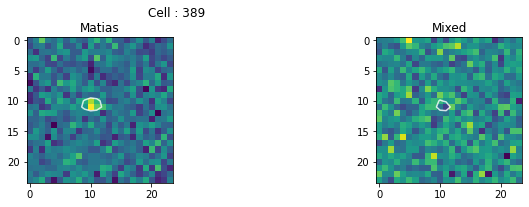

--- Ploting Done ---
matias : [ 1.91242373 13.84294428 11.65490829  0.55344808  0.31808497  1.39901896]
mixed : [ 1.77327998 14.01801793 11.68004419  0.33469682  0.23140984 58.2358042 ]


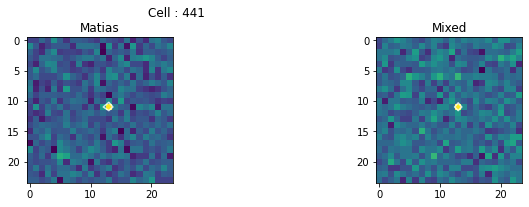

--- Ploting Done ---
matias : [ 1.22722401 14.56647268 12.97922817  0.65972485  1.05672173 36.87086871]
mixed : [ 1.2580888  14.43421432 12.96361855  0.53479357  0.66642279 47.01777123]


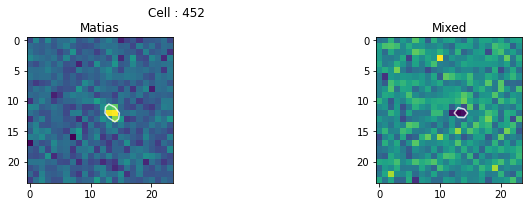

--- Ploting Done ---
matias : [-1.07713857 14.01188118 12.14440839  0.4934537   0.96639195 22.94597535]
mixed : [ 1.9999998  14.23101337 12.42289955  0.5532154   0.32236204 54.95332532]


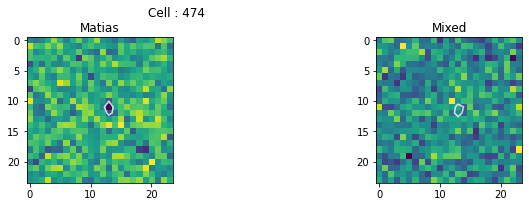

--- Ploting Done ---
matias : [ 2.         14.4671089  13.76283344  0.5550483   0.39715675 77.06760898]
mixed : [ 2.         14.59511903 13.73024875  0.58682028  0.33525402 38.89974254]


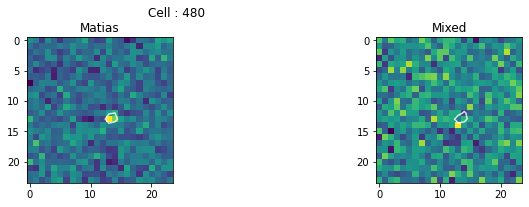

--- Ploting Done ---
matias : [-2.         13.7244383  12.47057887  0.38228138  0.52859076 47.9771033 ]
mixed : [ 1.62026572 14.3332614  12.58120799  0.72508544  0.30769051 75.06216896]


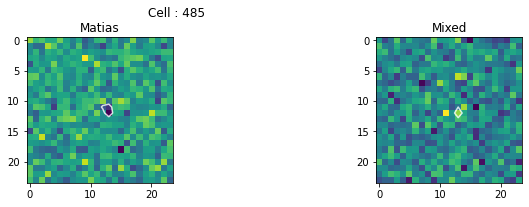

--- Ploting Done ---
matias : [ 1.13192365 13.20123702 10.78312566  0.67637733  0.54468037 11.38629719]
mixed : [4.60691034e-02 1.31986149e+01 1.06735991e+01 5.24641338e+00
 5.78041437e+00 2.11442100e-50]


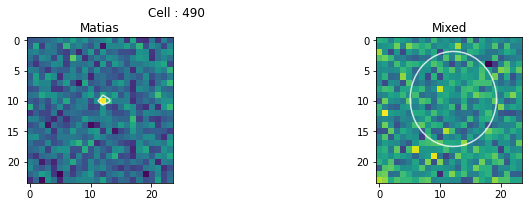

--- Ploting Done ---
matias : [ 1.30951113 11.53292539 10.67712106  0.55871482  0.80363592 81.19111312]
mixed : [ 2.         11.51526156 10.63883636  0.41240199  0.52175972 67.62548939]


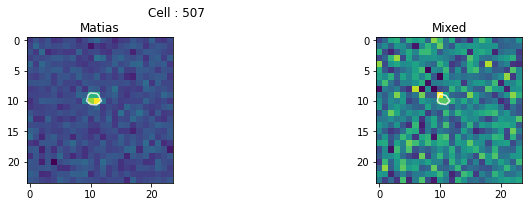

--- Ploting Done ---
matias : [ 1.99999886 11.2158459  14.42396238  0.35871305  0.57009108 80.4851616 ]
mixed : [ 2.         11.28981707 14.35425524  0.32790063  0.38891443 36.4960546 ]


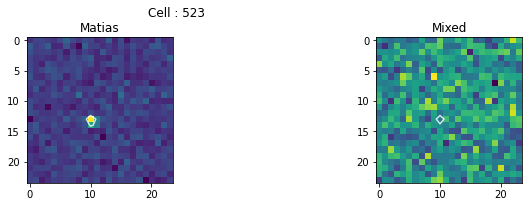

--- Ploting Done ---
matias : [-1.20895045 18.80359966 14.55881498  6.14222906  0.11135845  8.23626026]
mixed : [8.50651365e-02 5.33758319e+00 1.92451657e+01 4.83805469e+00
 3.99261295e+00 5.11196229e-77]


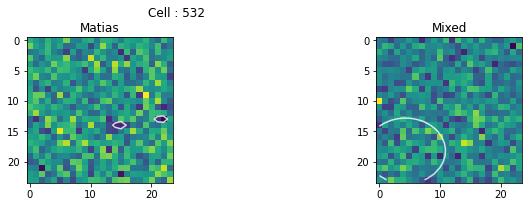

--- Ploting Done ---
matias : [ 1.67954797 14.51181173 15.84534655  0.59191407  0.46539035 50.27108152]
mixed : [ 1.99999188 14.48963125 15.81462119  0.26811466  0.47687982 59.75152032]


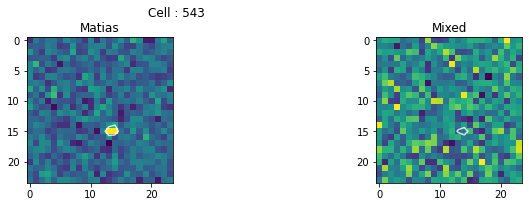

--- Ploting Done ---
matias : [-1.99999684 12.02333652 12.62890568  0.26995632  0.59438214 50.99283196]
mixed : [ 1.61343316 12.16889937 12.69409507  0.44393684  0.29053025 21.41980197]


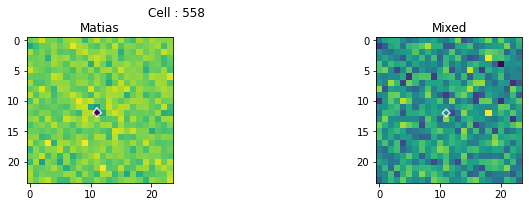

--- Ploting Done ---
matias : [ 1.14040948 12.05832552 12.42762341  0.70510582  0.96440081 23.70864679]
mixed : [ 1.99999999 12.30408268 12.72107923  0.30935466  0.68831891 30.87166581]


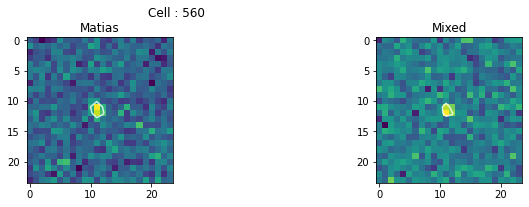

--- Ploting Done ---
matias : [-1.11386486e-01  4.00178379e+00  1.27900477e+01  8.93119975e+00
  2.73700715e+00  7.13028987e-35]
mixed : [3.33807773e-02 3.14393879e-07 8.22835679e-01 2.32683835e+01
 2.40000000e+01 1.54214805e-11]


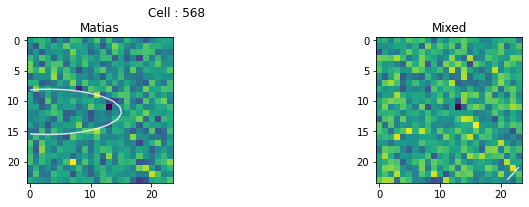

--- Ploting Done ---
matias : [-1.9348078  11.6690322  14.58388184  0.272056    0.7428323   9.17624293]
mixed : [ 1.68985083 11.72156583 14.46834003  0.20815877  0.62065661 20.50131667]


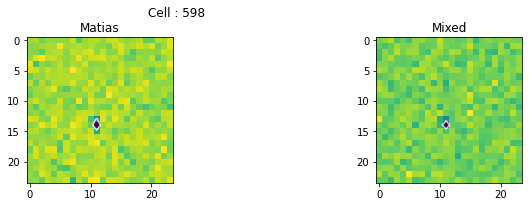

--- Ploting Done ---
matias : [ 1.99996508 10.41595087 10.5228234   0.86603354  0.41561222 10.0590697 ]
mixed : [ 2.         10.5300912  10.55394359  0.58390889  0.47706961 43.99457329]


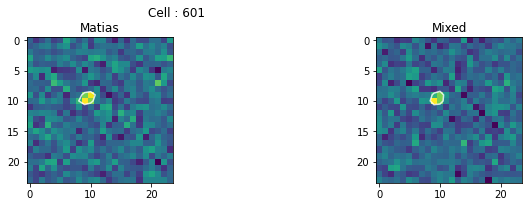

--- Ploting Done ---
matias : [ 1.35397763 10.79393997 10.35193322  0.51370076  0.69655091 44.08368601]
mixed : [-2.08836347e-10  1.00000000e+01  9.00000000e+00  4.49821910e-01
  1.50867372e-01  8.96589590e+00]


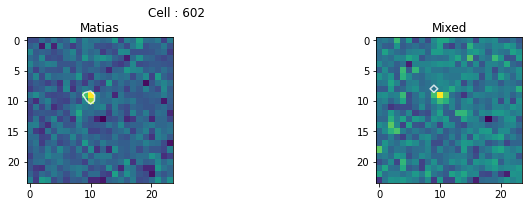

--- Ploting Done ---
matias : [ 1.22022364 13.81182884  9.91802438  1.07710008  0.10000881 33.09578786]
mixed : [-3.96831105e-11  1.30000000e+01  1.00000000e+01  1.00103596e-01
  1.00035059e-01  9.40490717e+00]


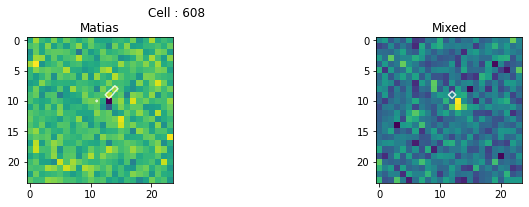

--- Ploting Done ---
matias : [1.08767202e+00 1.40860271e+01 1.21862505e+01 8.31719253e-01
 1.01694649e+00 1.37867645e-31]
mixed : [1.20997924e+00 1.40831294e+01 1.19561283e+01 5.72303941e-01
 1.05715584e+00 5.79920324e-36]


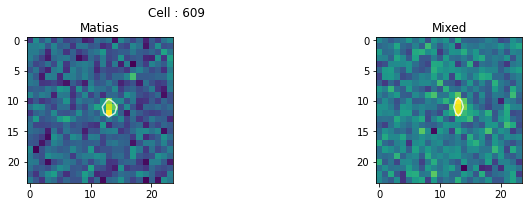

--- Ploting Done ---
matias : [ 1.50380447 14.54097681 10.35187936  0.70596949  0.54525738 65.90021374]
mixed : [ 2.         14.55843521 10.35906728  0.4990229   0.40464629 60.03306436]


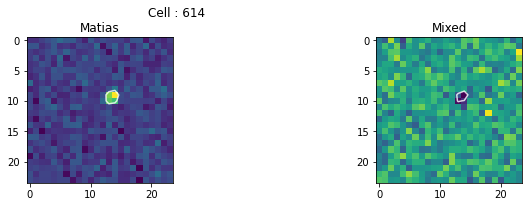

--- Ploting Done ---
matias : [ 1.2652266  14.68678305 12.05255842  0.71637587  1.02692253 37.36498092]
mixed : [ 1.23446817 14.60350338 11.97225924  0.54821034  0.75868594 18.02110017]


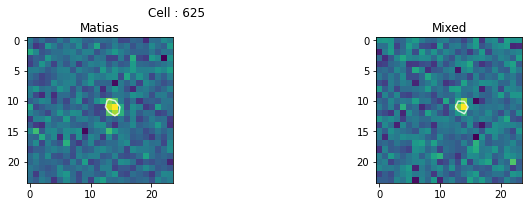

--- Ploting Done ---
matias : [ 1.99999996 13.37192295 11.9283704   0.32144342  0.5639023   3.19860625]
mixed : [1.99999119e+00 1.33258641e+01 1.17853306e+01 3.40502372e-01
 3.13080296e-01 6.62735057e-66]


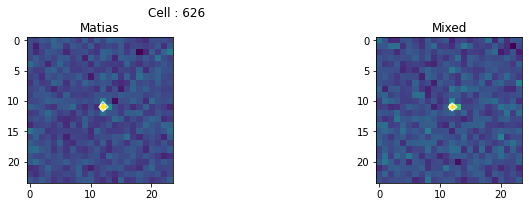

--- Ploting Done ---
matias : [ 1.3576523  13.1290621  12.53259731  0.96718123  0.56027917  5.79934819]
mixed : [ 2.         13.27337557 12.47912315  0.38786714  0.60515272 74.93210166]


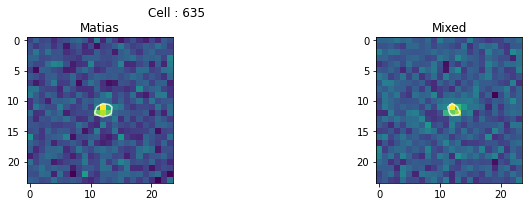

--- Ploting Done ---
matias : [ 1.04258157 13.00399299 11.8828944   0.51763436  0.73874269 67.28093794]
mixed : [ 1.04743218 13.05843975 12.12223696  0.4712597   0.44680082 37.7808086 ]


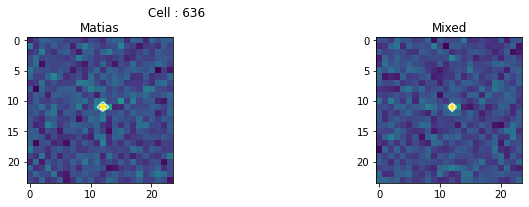

--- Ploting Done ---
matias : [ 0.23261727 24.          3.92910984 14.30557714  0.63908259  4.28432703]
mixed : [ 0.06092917 10.82183523  6.24017334  9.12764341 14.66126006 54.69930888]


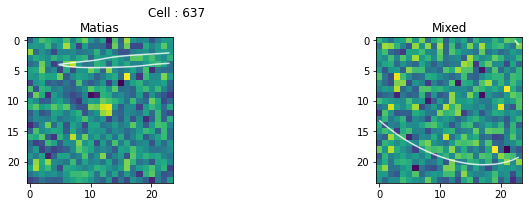

--- Ploting Done ---
matias : [ 1.10999708 12.79243761 14.13003901  0.6090985   0.65567981 44.39397387]
mixed : [ 1.99994102 12.84242766 14.3312294   0.30397612  0.44523567 82.0981452 ]


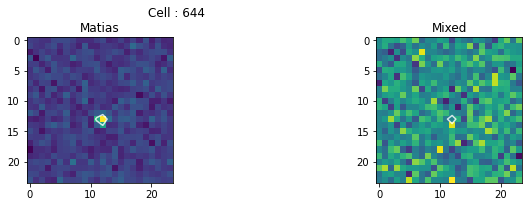

--- Ploting Done ---
matias : [-1.99999998 14.44212837  9.88728103  0.48910473  0.37588949 81.29942426]
mixed : [-2.28489655e-10  1.30000000e+01  9.00000000e+00  1.03687651e-01
  1.01127083e-01  1.00000000e-10]


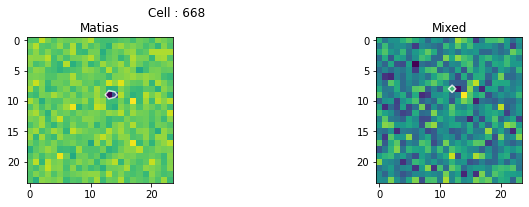

--- Ploting Done ---
matias : [ 1.15385318 14.152334   10.22559069  0.78868653  0.60982556 52.16552162]
mixed : [ 1.15403712 14.14093281 10.18972612  0.55448528  0.43881782 44.90333738]


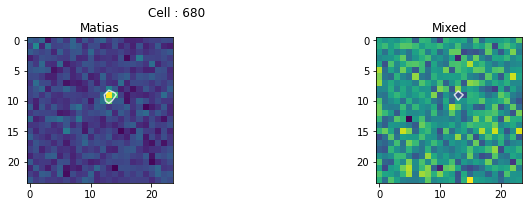

--- Ploting Done ---
matias : [-0.98240787 15.17477151  3.48924225  1.6899478   0.20750789  9.20156056]
mixed : [9.56093618e-02 2.40000000e+01 2.23881589e+01 1.79529591e+01
 1.44334571e+00 1.43333134e-55]


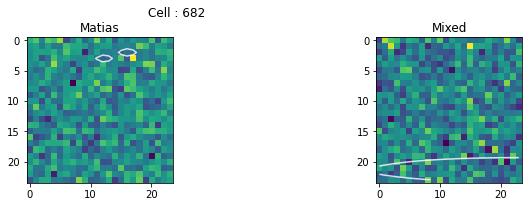

--- Ploting Done ---
matias : [-1.41324840e+00  1.09808523e+01  1.35409989e+01  6.84756706e-01
  5.64127078e-01  6.38984322e-36]
mixed : [ 1.74998798 11.0325985  13.50598745  0.45590907  0.50085614 49.38778953]


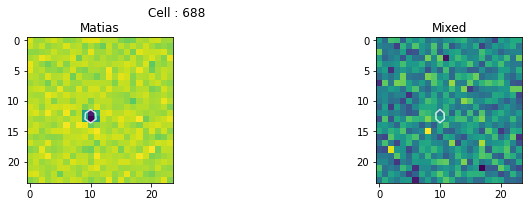

--- Ploting Done ---
matias : [-1.05228513 10.93986505 13.85013964  0.59235322  0.87059466 26.36264257]
mixed : [ 1.80391522 10.77015674 13.68227803  0.57065364  0.34342739 11.99217231]


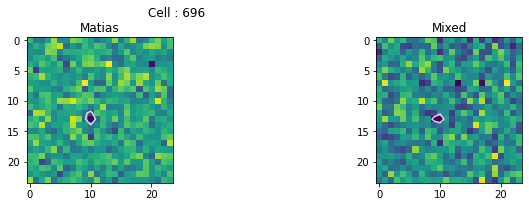

--- Ploting Done ---
matias : [-2.65548564e-11  1.00000000e+01  1.00000000e+01  1.25933485e-01
  1.00344598e-01  1.00000000e-10]
mixed : [ 1.90083972 11.51933104 11.41831358  0.41902935  0.58785161 49.83251753]


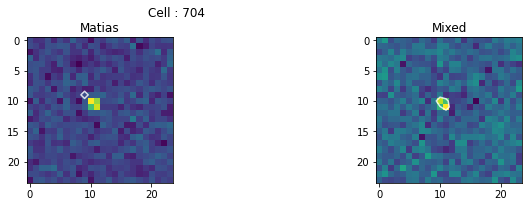

--- Ploting Done ---
matias : [ 1.99999947  3.4629177  17.95827557  0.11412576  2.05971296 19.29502001]
mixed : [ 1.55036355 12.29573637 11.97400843  0.31704891  0.57160512  0.94688673]


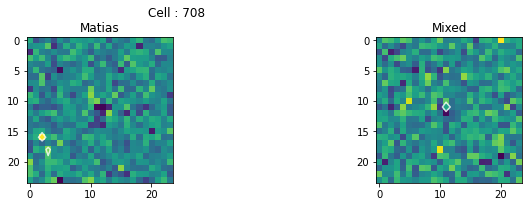

--- Ploting Done ---
matias : [ 2.         11.91187503 11.42102113  0.69259952  0.35330466  8.89226302]
mixed : [ 2.         12.0862091  11.33402994  0.50270566  0.2770647  37.42020416]


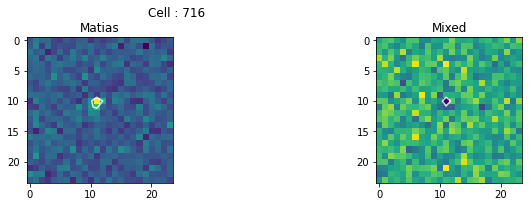

--- Ploting Done ---
matias : [ 1.19282516 11.17125366 11.35607859  0.60625279  0.69742825 70.16820526]
mixed : [-8.02560342e-11  1.00000000e+01  1.00000000e+01  1.01569086e-01
  1.00471162e-01  6.84922068e+01]


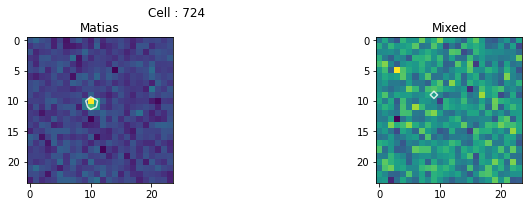

--- Ploting Done ---
matias : [-1.82424269e-08  9.99998147e+00  9.32649287e+00  5.13034856e-01
  1.00352303e-01  3.98871634e-08]
mixed : [ 1.25506461 11.09029989 11.1925763   0.5656622   0.29874243  2.79562548]


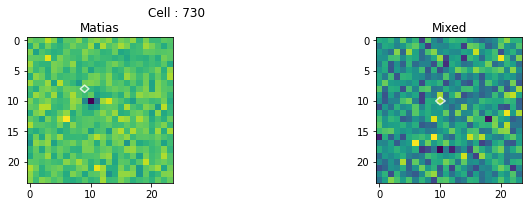

--- Ploting Done ---
matias : [ 2.          9.49330257 18.45923444  0.57265065  0.42750484 46.74040263]
mixed : [8.40068963e-02 1.82752347e+01 1.72012370e-10 1.93758796e+01
 8.51021406e+00 5.25478139e+01]


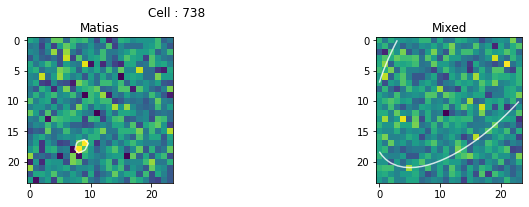

--- Ploting Done ---
matias : [ 1.18355228 12.26085049 12.7389311   0.73647917  0.42519058 22.18235697]
mixed : [1.16963758e-08 1.16434192e+01 1.20000015e+01 1.21292537e-01
 3.37909544e-01 8.75393608e-09]


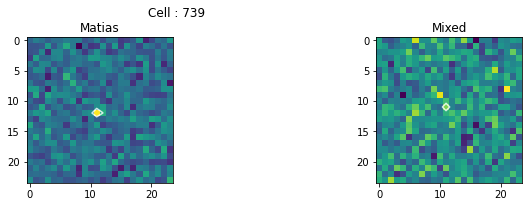

--- Ploting Done ---
matias : [-1.99999991 15.44222863 12.2358789   0.41236172  0.71692795  3.5255377 ]
mixed : [1.82167115e+000 1.58331779e+001 1.26464414e+001 5.56729075e-001
 3.32194716e-001 7.35066433e-107]


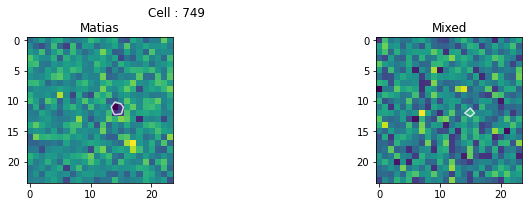

--- Ploting Done ---
matias : [7.90936760e-01 1.49846019e+01 1.08919556e+01 1.08015900e+00
 1.51825748e+00 1.22959549e-33]
mixed : [1.28102133e+00 1.45252981e+01 1.10734714e+01 6.56027821e-01
 5.36565226e-01 1.01478173e-44]


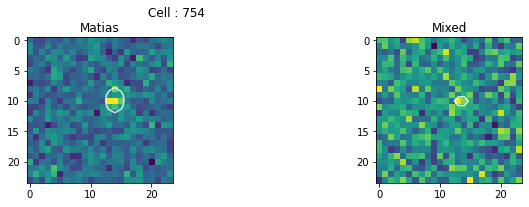

--- Ploting Done ---
matias : [ 1.79924807  0.28736212 13.45220922  0.4336266   0.8975442  39.522101  ]
mixed : [ 1.56655094 22.63161817 13.26179073  0.10288943  0.8747761  27.20352059]


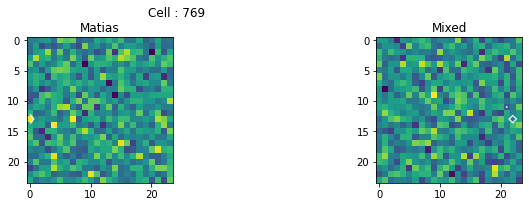

--- Ploting Done ---
matias : [-1.11244402 12.81174677 10.25866942  0.69137387  0.93031814 49.71498722]
mixed : [ 1.18523307 12.82622519 10.2781821   0.53520088  0.68569719 32.0372906 ]


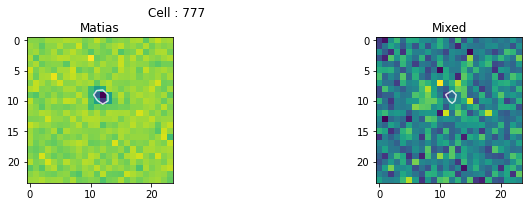

--- Ploting Done ---
matias : [-1.99297069 14.36314768 12.65942319  0.40622465  0.42026104  0.0373082 ]
mixed : [ 0.32480672 15.35923856 13.21505143  0.70216298  2.9875459  44.49876378]


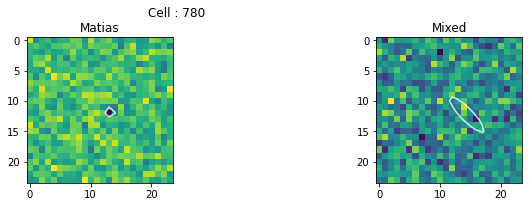

--- Ploting Done ---
matias : [2.00000000e+00 1.09176188e+01 1.15941742e+01 5.65836323e-01
 3.44662413e-01 2.88927873e-63]
mixed : [1.96743613e+000 1.09947348e+001 1.16449752e+001 4.18547693e-001
 3.05114634e-001 3.17522242e-196]


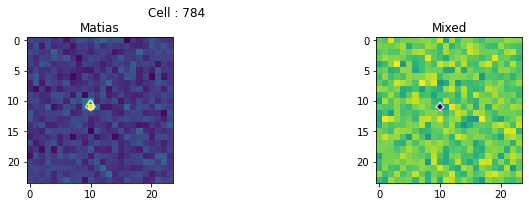

--- Ploting Done ---
matias : [ 2.         10.4497696  11.57063256  0.44068626  0.69409458 84.09854879]
mixed : [ 2.         10.65282682 11.59614166  0.47426337  0.44635792 67.59666354]


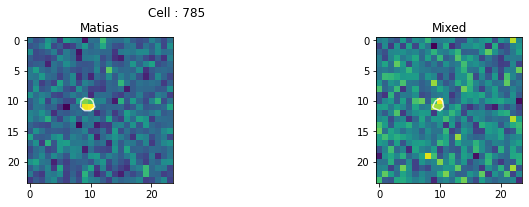

--- Ploting Done ---
matias : [-1.22228395 12.72526095 13.35549234  0.26482326  1.28396841 18.54526589]
mixed : [ 0.62317052 13.45002388 13.55632857  3.10877647  0.33392172 43.70365891]


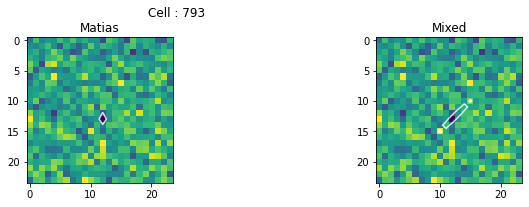

--- Ploting Done ---
matias : [ 1.8771652  20.78685771  7.38856807  0.13711997  2.45791355 40.63042689]
mixed : [5.56797218e-02 8.34568725e-09 2.39999918e+01 2.00399149e+01
 2.40000000e+01 1.73174898e+01]


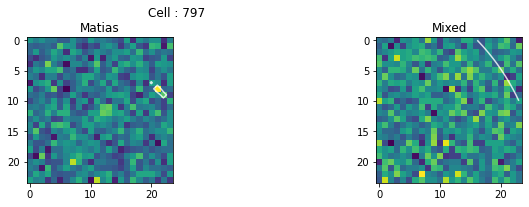

--- Ploting Done ---
matias : [-1.29768861e+00  1.44380831e+01  1.11201934e+01  6.48246991e-01
  7.40096685e-01  5.11614776e-18]
mixed : [ 1.32721668 14.40223245 11.08986917  0.56244552  0.52676829 23.1776799 ]


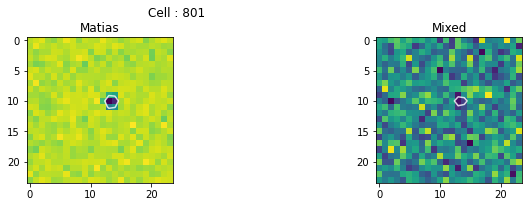

--- Ploting Done ---
matias : [-1.09795633e+00  1.04233879e+01  1.00767008e+01  8.57411107e-01
  7.25095398e-01  5.01436488e-41]
mixed : [ 1.31257765 10.41278637 10.07927511  0.59632374  0.54457661 27.5282804 ]


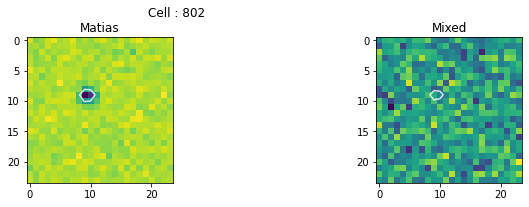

--- Ploting Done ---
matias : [-2.         11.55997446 12.84563     0.6288287   0.39203636 73.47367934]
mixed : [ 1.13729994 11.77237455 13.01124085  0.31822247  0.89410418 54.48197041]


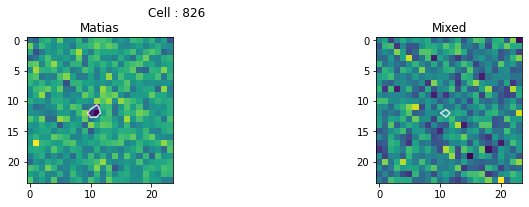

--- Ploting Done ---
matias : [-1.42082328 11.59740238 12.63524247  0.71841169  0.6254712   9.57817643]
mixed : [ 1.82301637 11.62764076 12.63251097  0.53778514  0.47224293 27.17007362]


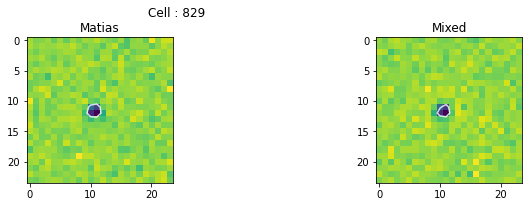

--- Ploting Done ---
matias : [-1.2690311  14.08379928 14.2338638   0.1         2.15181392 36.19455949]
mixed : [ 1.99999998 13.25035121 13.78061448  0.18486044  0.77799774 65.09373037]


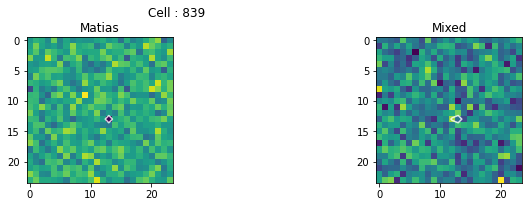

--- Ploting Done ---
matias : [1.17179181e+00 1.33775813e+01 1.39752400e+01 7.00884734e-01
 4.84801545e-01 1.17104997e-52]
mixed : [ 1.99996866 13.25554877 13.7803454   0.28446175  0.38929841 49.98705642]


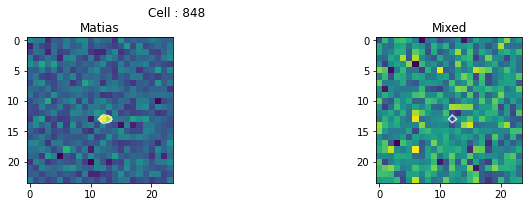

--- Ploting Done ---
matias : [-0.65185431 11.0513599  23.99974084  0.1        23.99663894 18.09603375]
mixed : [ 1.13836538 20.89182338  1.76796658  0.10016829  0.57939199 30.77668169]


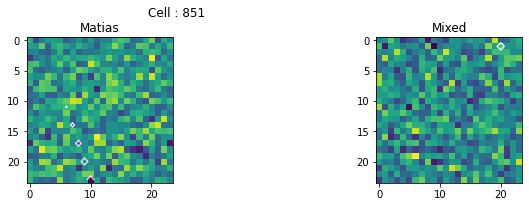

--- Ploting Done ---
matias : [-1.17613668 14.12955238 13.3023072   0.79174553  0.64008688 16.10159802]
mixed : [-6.24921869e-12  1.30000000e+01  1.20000000e+01  1.58270010e-01
  1.20395293e-01  2.90265429e+01]


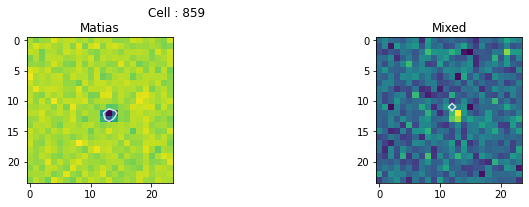

--- Ploting Done ---
matias : [ 1.08737028 11.6117648  12.34564147  1.0199054   0.90273573  0.92891113]
mixed : [ 1.67647939 11.68135784 12.39638739  0.46681779  0.67507063 27.54449481]


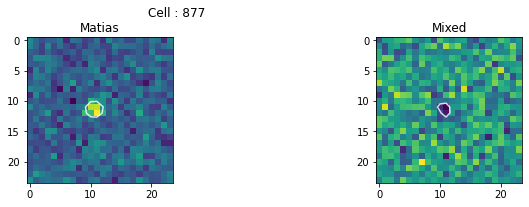

--- Ploting Done ---
matias : [-1.99999958 13.81079349 10.43314652  0.3574294   0.53854613 37.9907254 ]
mixed : [ 1.39449586 14.00351027 10.61026566  0.20269458  0.49572105  6.77023672]


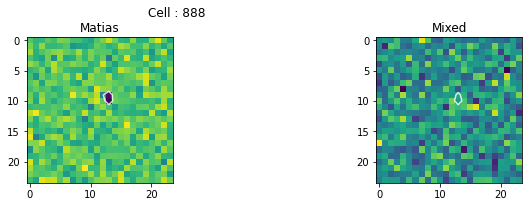

--- Ploting Done ---
matias : [0.96212415 9.27569338 7.63182176 5.98853824 0.10713214 7.0136497 ]
mixed : [ 1.99920668  0.41974851 18.19551753  0.10007422  0.88909316 33.63457463]


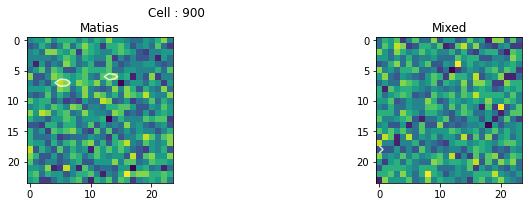

--- Ploting Done ---
matias : [1.31830280e+00 1.44713583e+01 1.47715469e+01 6.43355118e-01
 8.67650742e-01 2.60323982e-21]
mixed : [1.95514818e+00 1.45018836e+01 1.47222408e+01 4.64102084e-01
 6.29409855e-01 1.82622011e-42]


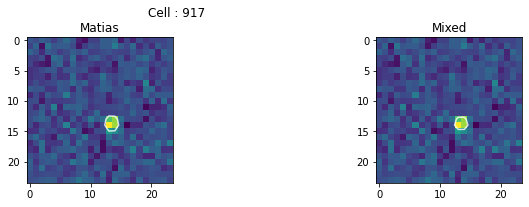

--- Ploting Done ---
matias : [-1.16434128e+00  1.29677264e+01  1.26570467e+01  7.42878929e-01
  6.69196817e-01  1.35525334e-37]
mixed : [ 1.2511368  12.9387818  12.65696669  0.53748143  0.52078471  5.00160513]


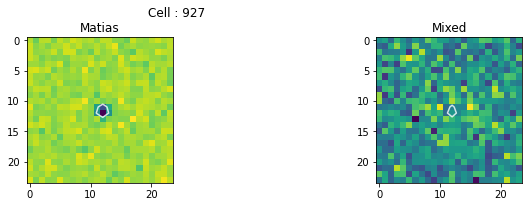

--- Ploting Done ---
matias : [ 2.         15.57570471  9.54576149  0.3349454   0.64275111 18.49012943]
mixed : [ 1.99999615 15.31613952  9.78372851  0.31385497  0.46204472 55.33611657]


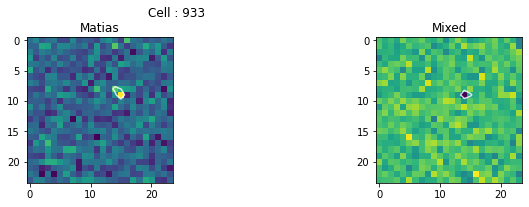

--- Ploting Done ---
matias : [ 0.44185363  2.32288246 19.6190327   1.22154643  1.90478526  1.36790662]
mixed : [ 0.61790365 20.07304323  2.18345916  3.03996895  0.58510959 10.07441138]


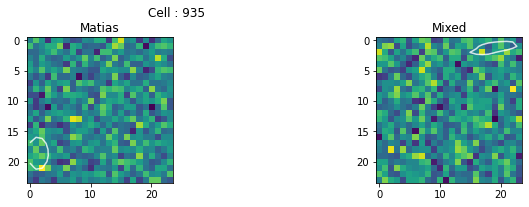

--- Ploting Done ---
matias : [-1.21566135 14.90091133 13.33727612  0.60793147  0.8175245  29.05404525]
mixed : [1.13571744e+00 1.49659064e+01 1.33047493e+01 4.91230087e-01
 6.36427639e-01 3.68231103e-09]


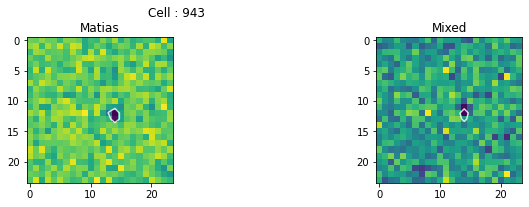

--- Ploting Done ---
matias : [ 1.99924796 12.92998059 11.58148364  1.23993835  0.12239249 18.40383928]
mixed : [ 1.52766013 12.24651358 12.29949639  0.24373207  0.62191056 67.00654748]


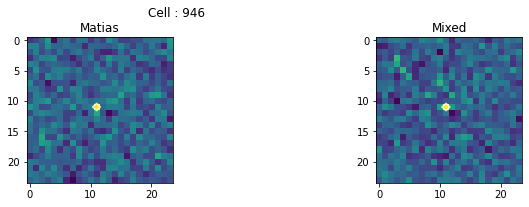

--- Ploting Done ---
matias : [1.20945752e+00 1.13167757e+01 1.45442138e+01 7.84732901e-01
 1.01951638e+00 1.73820053e-15]
mixed : [ 1.5607268  11.41795349 14.37074756  0.58223194  0.61144921 17.00625626]


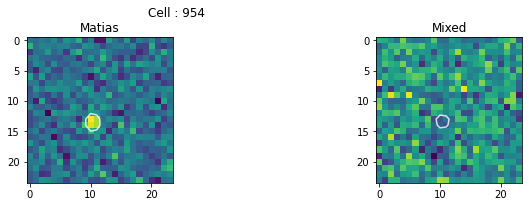

--- Ploting Done ---
matias : [-2.         11.58639462 14.18835563  0.38940444  0.53728402 28.75154192]
mixed : [-2.94660421e-13  1.00000000e+01  1.30000000e+01  1.00717547e-01
  2.94735861e-01  9.73381155e+00]


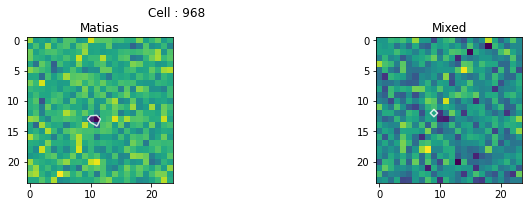

--- Ploting Done ---
matias : [-2.         11.70882152 12.3757307   0.39935101  0.46558558 66.22540013]
mixed : [ 1.99999414 11.83552944 12.36093573  0.32649922  0.41638109 88.95239434]


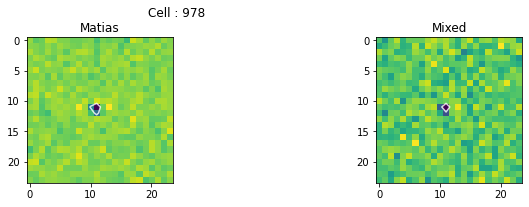

--- Ploting Done ---
matias : [ 0.13971632 15.501418   10.71137891 24.          0.27846581 10.91684758]
mixed : [ 1.99950618 13.25297152 12.25871371  0.43426225  0.30730416 45.57768597]


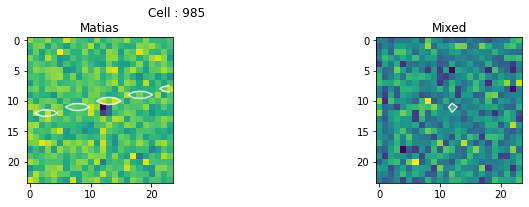

--- Ploting Done ---
matias : [ 1.99841485  4.91132216 21.16544144  0.10171153  1.44707256 55.54320855]
mixed : [4.47668705e-02 1.56766406e+01 2.96297644e+00 8.79537058e+00
 2.40000000e+01 1.66193667e+02]


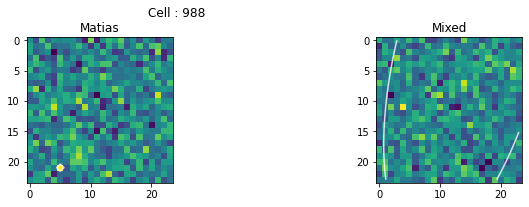

--- Ploting Done ---
matias : [ 1.36269068 13.73419025 12.12656603  0.37409151  0.62446387 19.11772444]
mixed : [ 1.99999771 13.78168269 12.24566202  0.27801517  0.37717995 40.79974476]


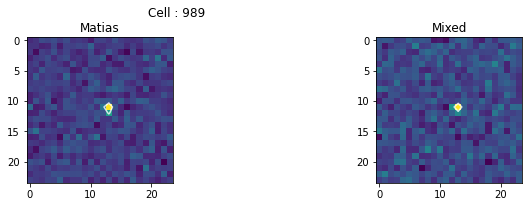

--- Ploting Done ---
matias : [-1.32795789 11.8044604  11.52328327  0.82356947  0.66768566 39.24116008]
mixed : [ 1.55037634 11.81361715 11.50396472  0.63177851  0.46714675 39.08286545]


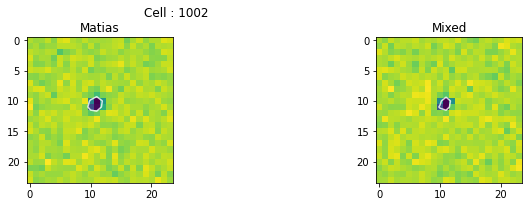

--- Ploting Done ---
matias : [ 1.06805832 14.08021632 11.87495899  0.66562377  0.78902311 39.53572308]
mixed : [ 1.0716832  14.15068013 11.87779412  0.5320352   0.52047046  9.88315161]


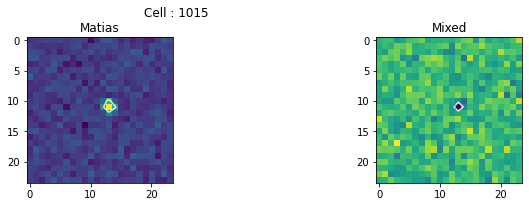

--- Ploting Done ---
matias : [-2.         12.56093576 12.56167768  0.61695258  0.47314637 19.0839661 ]
mixed : [ 1.79034081 12.7001712  12.57954226  0.56324585  0.47519014 44.23568889]


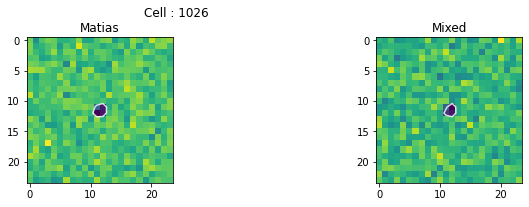

--- Ploting Done ---
matias : [2.00000000e+00 1.33094423e+01 1.17117090e+01 5.85749561e-01
 2.78401079e-01 1.39215534e-21]
mixed : [ 2.         13.2677765  12.52842511  0.41489143  0.50398078 19.86079535]


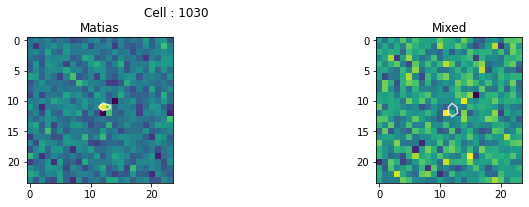

--- Ploting Done ---
matias : [ 0.66319045 13.72470403 10.72388036  1.62798154  0.17847379 48.20134085]
mixed : [-3.50157058e-11  1.40000000e+01  1.00000000e+01  1.04502934e-01
  1.01106016e-01  1.28611520e+01]


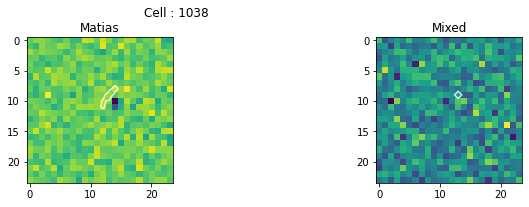

--- Ploting Done ---
matias : [-0.23485904 19.00003022 18.00003626  0.10095189  0.19953719 47.91446841]
mixed : [ 0.81658673 17.33302574 11.62891503  0.1         6.30441931 51.97949913]


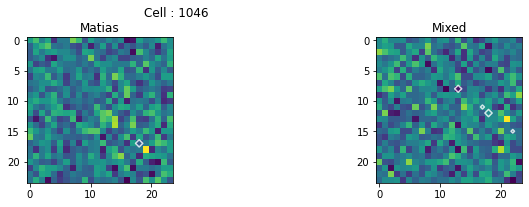

--- Ploting Done ---
matias : [ 1.99999905 15.23164605 11.55638491  0.55434857  0.40018755  2.74372817]
mixed : [ 1.68703946 15.21880082 11.74629319  0.29207489  0.46542939 13.66201664]


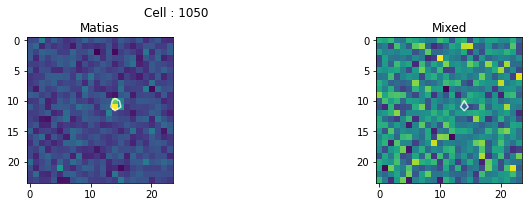

--- Ploting Done ---
matias : [-2.         15.49393002 12.30889714  0.3642001   1.36885172  2.83543022]
mixed : [ 2.         15.50752205 12.05608168  0.40134355  0.74008296  4.49015832]


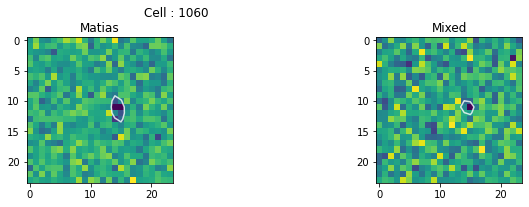

--- Ploting Done ---
matias : [ 1.42696906 14.63504046 10.7577653   0.45253804  0.58886251 17.14765942]
mixed : [ 1.99998055 14.76764227 10.75013521  0.39804724  0.28942369 47.1549634 ]


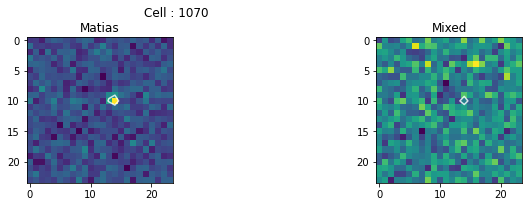

--- Ploting Done ---
matias : [2.00000000e+00 1.45805686e+01 1.10003956e+01 3.61228544e-01
 6.01155707e-01 5.59394167e-31]
mixed : [ 1.99999994 14.68025934 10.68887617  0.35040785  0.37891674 47.35753929]


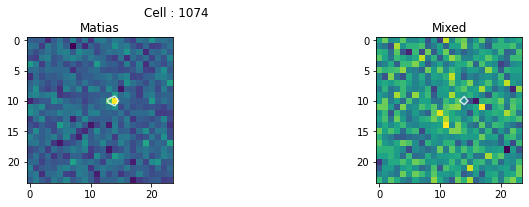

--- Ploting Done ---
matias : [ 1.29727195 14.59967211 10.26205295  0.55236661  0.74144192 65.80507603]
mixed : [ 1.78135107 14.63296334 10.00010679  0.14850874  0.38809505 77.14308904]


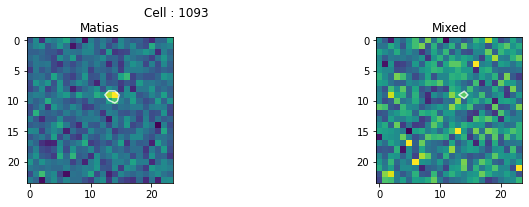

--- Ploting Done ---
matias : [0, 0, 0, 0.001, 0.001, 0]
mixed : [-1.47958541e-10  1.30000000e+01  9.00000000e+00  1.02905535e-01
  4.21681389e-01  1.00000000e-10]


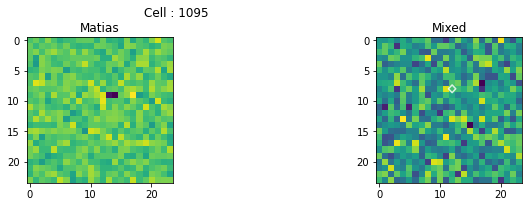

--- Ploting Done ---
matias : [ 1.53422308 14.06710956 13.59458323  0.59828069  0.4299126   1.3687334 ]
mixed : [1.99999660e+00 1.41988413e+01 1.36649285e+01 3.07267861e-01
 3.40602070e-01 8.41436760e-79]


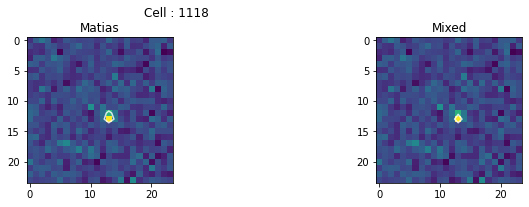

--- Ploting Done ---
matias : [2.08958043e-01 1.30000000e+01 1.20000000e+01 1.09098421e-01
 1.00230486e-01 1.00000000e-10]
mixed : [-4.43111127e-11  1.30000000e+01  1.20000000e+01  4.37245722e-01
  1.35539378e-01  9.05888852e+00]


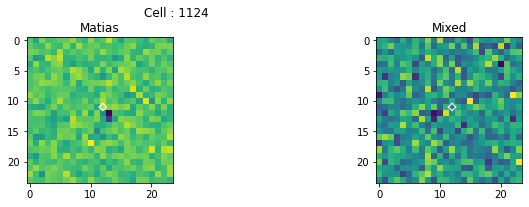

--- Ploting Done ---
matias : [ 1.02133846 12.94562367 12.0287847   0.74270806  0.60819922 69.33052319]
mixed : [ 1.46109826 13.25479606 11.9252586   0.29899288  0.53603442  2.62301902]


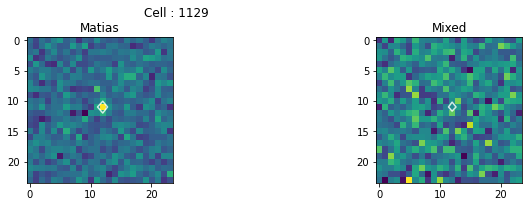

--- Ploting Done ---
matias : [-1.99999604 15.66788583 14.45317947  0.41070191  0.52431882  0.05539315]
mixed : [ 1.99999995 15.73086057 14.17525761  0.27265194  0.53499098 31.32569467]


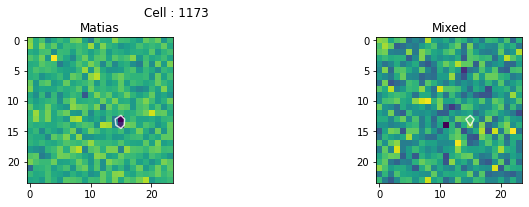

--- Ploting Done ---
matias : [-2.         10.37193578 14.51973278  0.91175012  0.42786549  2.75280443]
mixed : [ 1.58553344 10.46509664 14.63815021  0.64994433  0.44915486 18.54897353]


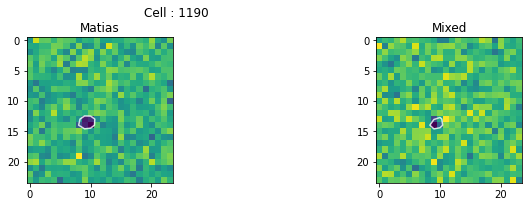

--- Ploting Done ---
matias : [-2.         11.59932804 14.47782475  0.44448392  0.56183872 47.9641567 ]
mixed : [ 1.41228925 11.765249   14.58799009  0.36975949  0.60217808 45.09888456]


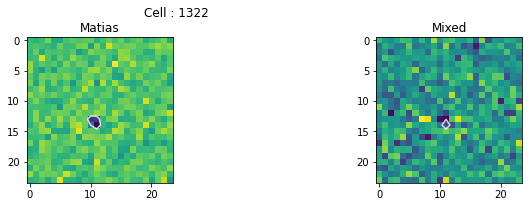

--- Ploting Done ---
matias : [ 0.61573963 16.9037636  10.57858555  3.65917489  0.26010003  1.54258688]
mixed : [2.04112347e-07 1.37856456e+01 1.20000030e+01 1.00110004e-01
 3.59247265e-01 1.00000000e-10]


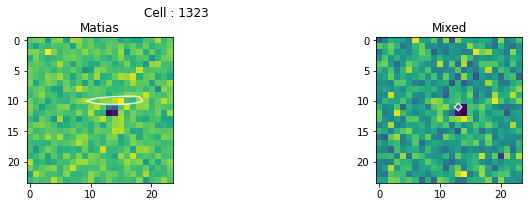

--- Ploting Done ---
matias : [-0.63832064 12.51387583 12.79238176  1.26562157  0.68657318 24.13271596]
mixed : [ 1.99997373 12.94405833 12.67017997  0.47821651  0.26389934 36.0218678 ]


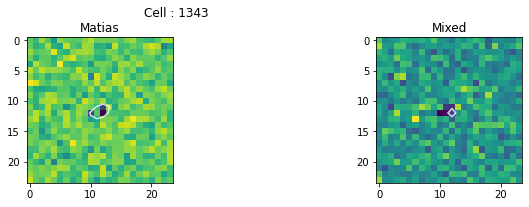

--- Ploting Done ---
matias : [ 1.3308004  13.69676415 10.54496674  0.28255603  1.13883832 15.03148738]
mixed : [ 1.02174612 13.99925182 11.08756341  0.20680475  0.44320959  9.21952413]


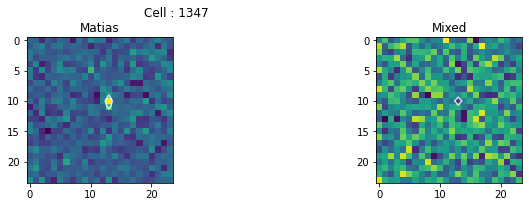

--- Ploting Done ---
matias : [-1.02930034 10.19930445 14.10908622  0.62108026  0.82867118 36.84897965]
mixed : [ 1.04213716 10.08739361 14.13465565  0.47449895  0.5639194  45.87167356]


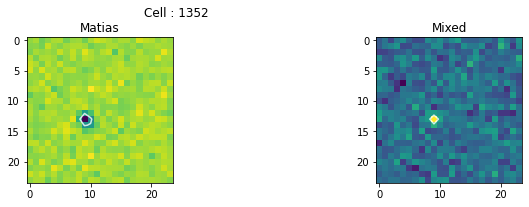

--- Ploting Done ---
matias : [ 0.17729724 14.         11.99999999  0.2881003   0.18531029 43.62592411]
mixed : [ 1.92268184 15.00030301 13.35814926  0.15797347  0.40280184 20.22387935]


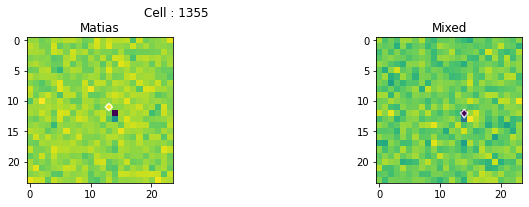

--- Ploting Done ---
matias : [ 1.99999999 12.61438989 14.50246543  0.39667711  0.53665819 46.24850406]
mixed : [ 1.99999999 12.65188042 14.52661256  0.34344103  0.49928102 38.55442141]


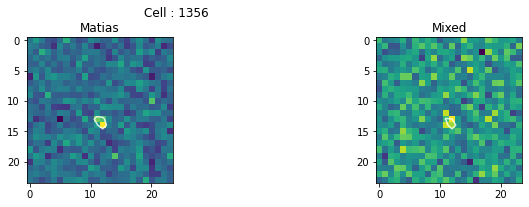

--- Ploting Done ---
matias : [ 1.21685854 12.96062934 10.3579909   0.69694163  0.64481748 36.49006667]
mixed : [-1.48226877e-12  1.20000000e+01  9.00000000e+00  1.34267130e-01
  1.01592040e-01  4.64935268e+01]


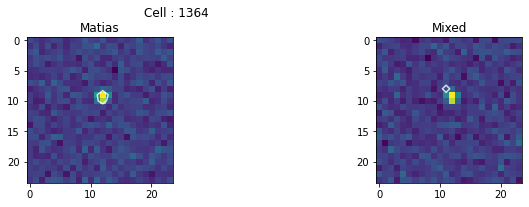

--- Ploting Done ---
matias : [ 2.         11.53959681 12.58343642  0.58704078  0.43529936 22.62535203]
mixed : [ 1.99999999 11.49398075 12.68901303  0.5664733   0.38910242 63.66237471]


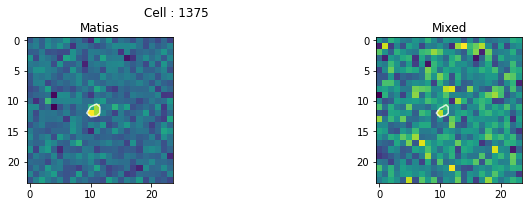

--- Ploting Done ---
matias : [-1.99999428 16.03080484  6.71580519  0.23032011  0.85366936 68.31110511]
mixed : [ 0.6782555  11.81925001 12.8464509   1.34147729  1.07979441 30.91003179]


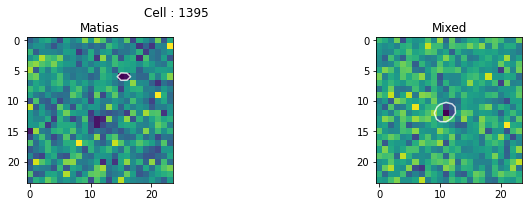

--- Ploting Done ---
matias : [ 2.         11.83072466 12.50015593  0.61565637  0.4240513   3.1413901 ]
mixed : [ 2.         11.80035351 12.51831147  0.40440707  0.4440651  12.32155328]


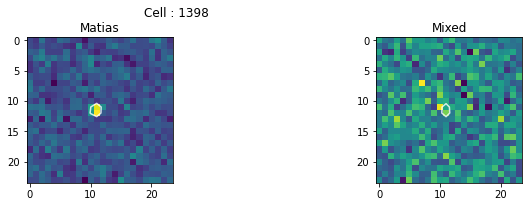

--- Ploting Done ---
matias : [1.23158916e+00 1.76825412e+01 1.07324694e-07 5.72948763e+00
 1.50804118e-01 3.60928699e+01]
mixed : [4.89731540e-10 1.00001942e+01 9.00000000e+00 1.22018786e-01
 3.05998503e-01 1.00000000e-10]


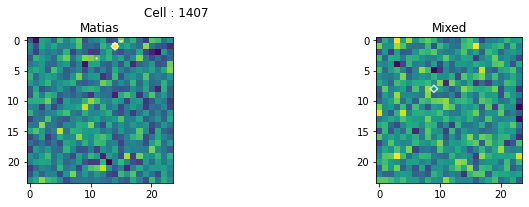

--- Ploting Done ---
matias : [ 1.09475922 11.29125039 13.73482777  0.96397943  0.46300275 27.79616289]
mixed : [ 1.83372062 11.09640476 13.64281766  0.51233516  0.30526476 16.23717732]


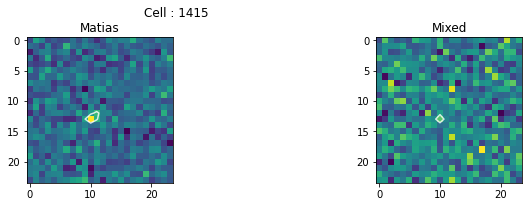

--- Ploting Done ---
matias : [ 2.         11.57031223 14.60195786  0.3737625   0.61509631 83.14757801]
mixed : [ 1.99213251 11.64255277 14.838816    0.50937531  0.32992584 78.76238607]


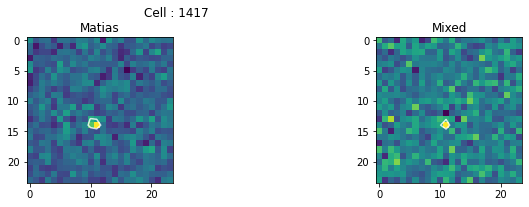

--- Ploting Done ---
matias : [ 1.23234186 12.11671805 10.36672813  0.65808265  0.84542195 62.12692103]
mixed : [-1.79813181e+00  2.26889600e+01  2.24877152e+01  1.01303718e-01
  1.06809637e-01  1.00000000e-10]


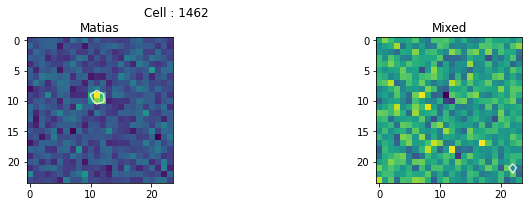

--- Ploting Done ---
matias : [-1.99999898 12.48888721 13.94692329  0.29474531  0.71177891 47.91187487]
mixed : [ 1.98925516 12.50351694 13.99959834  0.20023899  0.42865952 85.14970373]


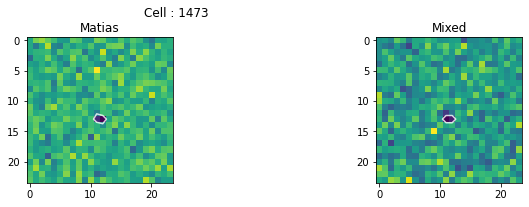

--- Ploting Done ---
matias : [1.56881269e+00 1.49223891e+01 1.15400512e+01 6.02382742e-01
 4.76519748e-01 4.92251881e-48]
mixed : [ 1.39967114 14.93180165 11.61610191  0.41112478  0.47679758 18.02935783]


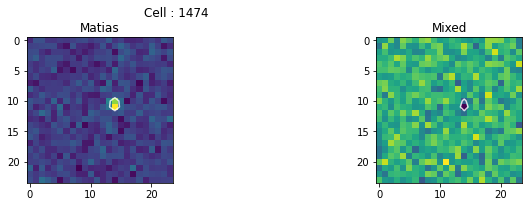

--- Ploting Done ---
matias : [ 0.39044061 13.60119096 11.91168035  0.2578823   3.157209    1.24285429]
mixed : [ 1.43377953 15.22117248 12.07166081  0.22904062  0.63230169 18.09579964]


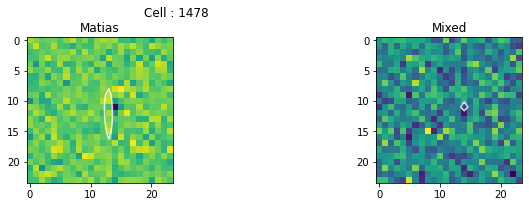

--- Ploting Done ---
matias : [1.05764026e+00 1.35728300e+01 1.20602389e+01 1.03338265e+00
 9.30590220e-01 3.29746294e-45]
mixed : [ 1.17195244 13.49010507 12.16413108  0.65486293  0.78687892 40.52540701]


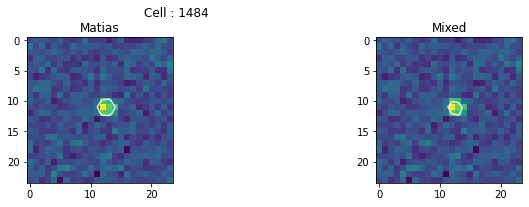

--- Ploting Done ---
matias : [-1.99839151e+00  1.31354997e+01  1.26778687e+01  5.74600278e-01
  2.80245892e-01  2.91616976e-46]
mixed : [1.65013579e+00 1.33068336e+01 1.30012328e+01 3.06565249e-01
 2.11594735e-01 8.52605967e-03]


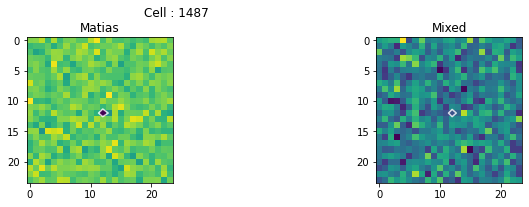

--- Ploting Done ---
matias : [2.54060287e-11 1.40000000e+01 1.30000000e+01 1.50945982e-01
 1.25361346e-01 9.70141355e+00]
mixed : [ 1.02604221 15.11571665 13.99997165  0.53198078  0.43084566 24.66783671]


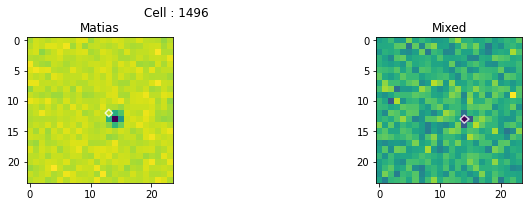

--- Ploting Done ---
matias : [4.66501250e-01 2.00001558e+00 5.78676112e+00 1.00640003e-01
 1.16438928e+00 5.11710833e-06]
mixed : [ 1.77805207 10.99939886  2.37319817  0.17157027  0.44755781 19.55387059]


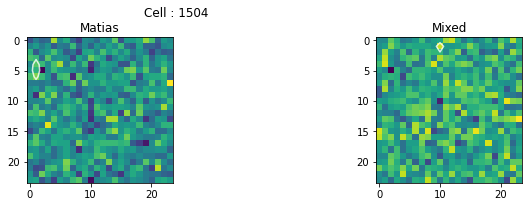

--- Ploting Done ---
matias : [ 1.09657036 12.89376806 13.7270006   0.56330547  0.75104174 57.86201067]
mixed : [1.99976657e+000 1.30047146e+001 1.35935347e+001 5.25072265e-001
 3.42781616e-001 1.30275049e-129]


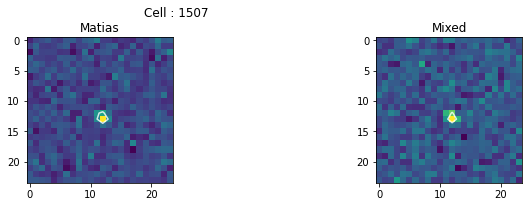

--- Ploting Done ---
matias : [-2.00000000e+00  1.38578414e+01  1.14972989e+01  7.33554210e-01
  4.26598646e-01  1.30917559e-12]
mixed : [1.26601207e+00 1.36667680e+01 1.12206575e+01 8.03958445e-01
 5.11309034e-01 6.49243063e-14]


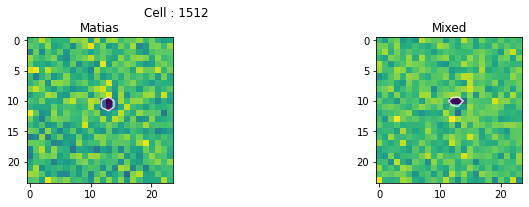

--- Ploting Done ---
matias : [-0.91989761 15.53255681 10.95743111  2.81906648  0.14752788 41.92389231]
mixed : [ 1.99999583 13.25386863 15.54301694  0.28871788  0.53678487 37.4609083 ]


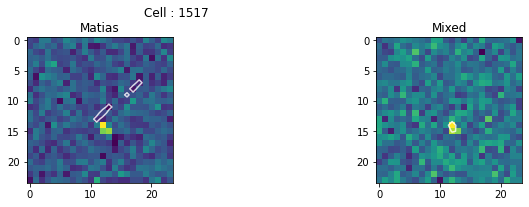

--- Ploting Done ---
matias : [-2.         14.50589199 11.4423341   0.40352458  1.06259378  4.37990607]
mixed : [ 1.16509463 14.24097113 11.83161729  0.5706677   0.71163935 32.94264272]


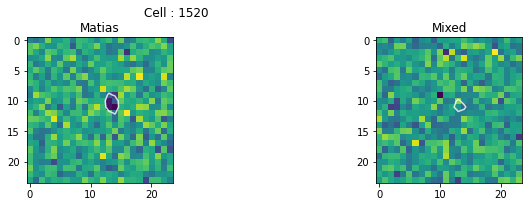

--- Ploting Done ---
matias : [-2.         14.57314621 14.42156751  0.51984568  0.4640817  17.9370158 ]
mixed : [ 2.         14.60785711 14.36045446  0.45318509  0.3976683  35.56945834]


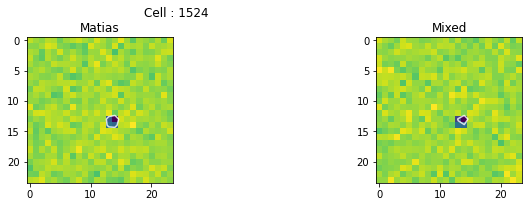

--- Ploting Done ---
matias : [-1.47615728 14.23456352 13.4128925   0.50655703  0.55544181 34.19413505]
mixed : [ 1.44576202 14.12730239 13.53515544  0.4706147   0.69268688 31.90497846]


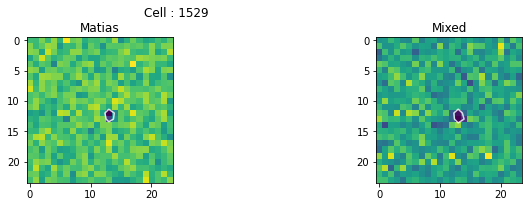

--- Ploting Done ---
matias : [ 2.         14.45797281 10.83382511  0.67048548  0.37920596 83.2660007 ]
mixed : [ 1.472141   14.42946609 10.82334799  0.52801347  0.44196515 26.19667059]


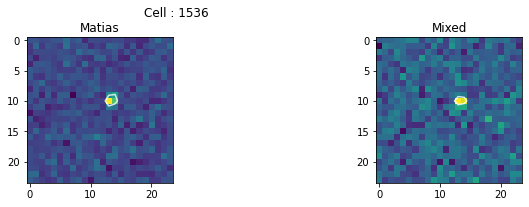

--- Ploting Done ---
matias : [ 1.03925927 14.87834287 14.02946615  0.41320615  0.80222898 33.76476721]
mixed : [ 1.99932121 15.21955602 14.26606227  0.40312177  0.29024805 51.00786655]


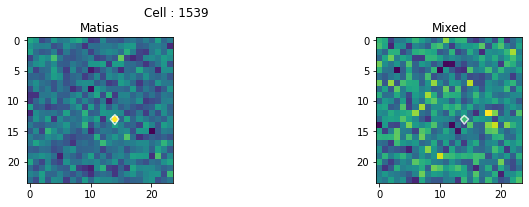

--- Ploting Done ---
matias : [2.41184186e-01 1.60000000e+01 1.00000000e-10 2.81220020e+00
 1.34863069e-01 1.00000000e-10]
mixed : [4.89183611e-09 1.40000000e+01 1.30000000e+01 3.19809645e-01
 1.24401022e-01 1.00000000e-10]


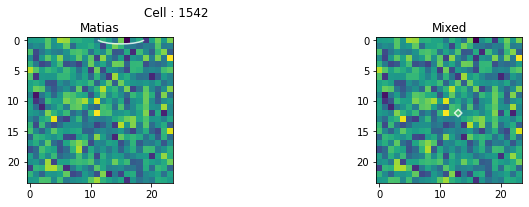

--- Ploting Done ---
matias : [-1.10471019 14.79763408 15.1330678   0.73143529  0.82949439 11.6302863 ]
mixed : [ 1.09833045 14.82026693 15.13755321  0.51742415  0.60011478 13.5396799 ]


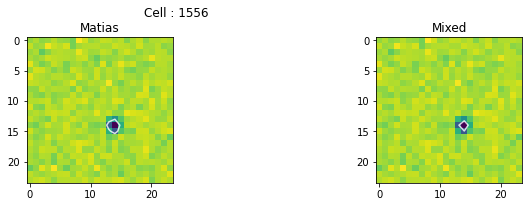

--- Ploting Done ---
matias : [ 0.1930703  11.9999988   9.99999825  0.10000098  0.30985319 18.20656813]
mixed : [8.68537297e-11 1.20000000e+01 1.00000000e+01 1.08182058e-01
 1.00020628e-01 1.00000000e-10]


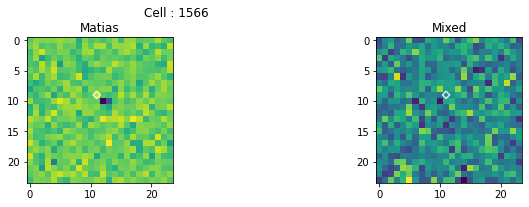

--- Ploting Done ---
matias : [ 0.15149918 14.0504519   8.58797782  0.15607569  1.63255331  0.32051383]
mixed : [ 1.1473153  15.2334087  10.97877403  1.01411154  0.52466957 14.63658198]


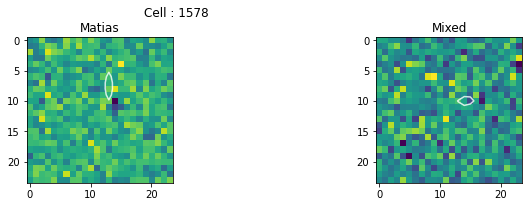

--- Ploting Done ---
matias : [-1.26433675 12.71491205 14.87262534  0.58985546  1.1914999  47.36297586]
mixed : [ 1.27682523 12.44498091 14.68508294  0.47295421  1.04935112 45.85759957]


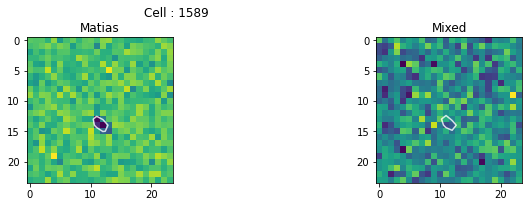

--- Ploting Done ---
matias : [-2.         12.56923327 12.67530258  0.37877985  0.46482784 37.53364602]
mixed : [ 1.87823569 12.6144759  12.79607054  0.27320746  0.53772846 27.75564687]


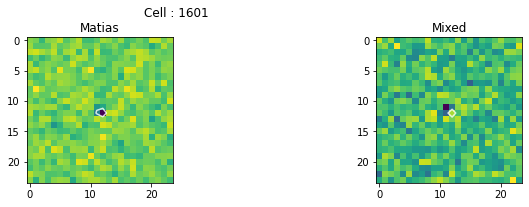

--- Ploting Done ---
matias : [-1.21012013 13.05441246 11.61070627  0.77443613  0.63674682  1.36796641]
mixed : [ 1.31227305 13.0552429  11.61817725  0.57668453  0.52045774  3.69545405]


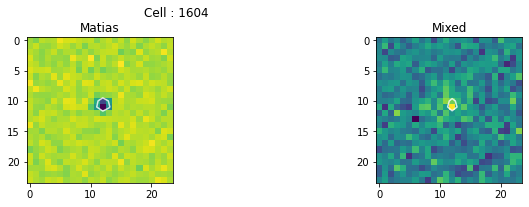

--- Ploting Done ---
matias : [-2.         11.64207398 10.33118395  0.34528642  0.58922651 86.86373121]
mixed : [ 1.99999998 11.59605444 10.18194388  0.33327393  0.40304898 79.90819147]


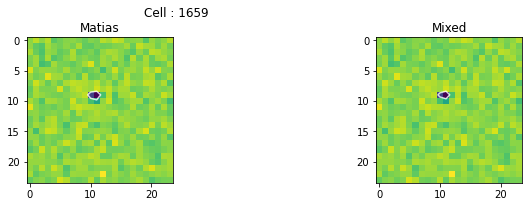

--- Ploting Done ---
matias : [1.99999999e+00 1.21188609e+01 1.05252145e+01 9.20035627e-01
 3.89788139e-01 5.89403023e-43]
mixed : [ 1.24113792 12.30017912 10.51077598  0.7830075   0.61736023 18.08068755]


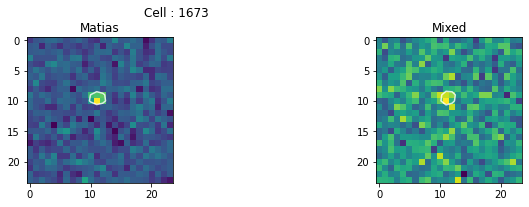

--- Ploting Done ---
matias : [-1.65685946 11.38497802 13.66402574  0.503189    0.70914065 63.30548375]
mixed : [ 1.99401379 11.09891484 13.59664197  0.36643797  0.678522   86.0706368 ]


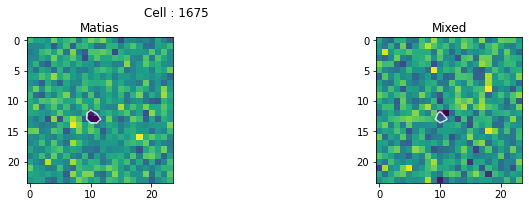

--- Ploting Done ---
matias : [1.40021702e+00 1.44528004e+01 1.49591567e+01 5.61538501e-01
 6.82599932e-01 1.57015638e-15]
mixed : [2.00000000e+00 1.44374825e+01 1.46875535e+01 4.77302715e-01
 4.40308467e-01 5.08177918e-44]


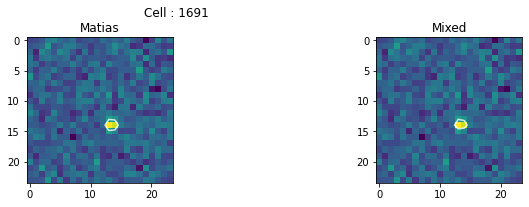

--- Ploting Done ---
matias : [-1.113122   11.61646288 14.8521098   0.66438421  0.81690086 79.08454818]
mixed : [ 1.26020391 11.63896433 14.86692346  0.47500928  0.56472125 73.60229988]


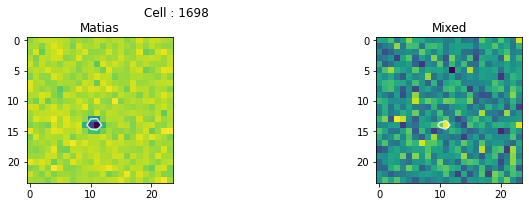

--- Ploting Done ---
matias : [-2.         13.77494174 10.71125013  0.82740625  0.23482097 31.27830757]
mixed : [5.61014841e-10 1.20000000e+01 1.00000000e+01 1.01208760e-01
 4.28980488e-01 1.00000000e-10]


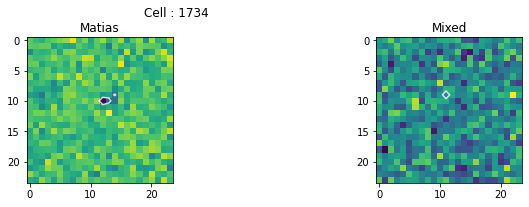

--- Ploting Done ---
matias : [ 0.21091168 12.52973424  9.28106959  4.57957162  0.2770321  53.9932776 ]
mixed : [-1.48456354e-09  1.20000000e+01  1.00000000e+01  1.02971551e-01
  4.41758241e-01  1.00000000e-10]


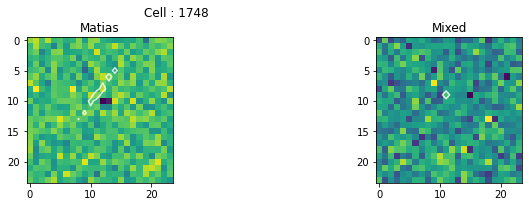

--- Ploting Done ---
matias : [-2.         13.44279158 12.90332551  0.39391247  0.80298454  8.60769832]
mixed : [-2.96913867e-10  1.30000000e+01  1.10000000e+01  4.49069455e-01
  1.68421816e-01  3.01501427e+01]


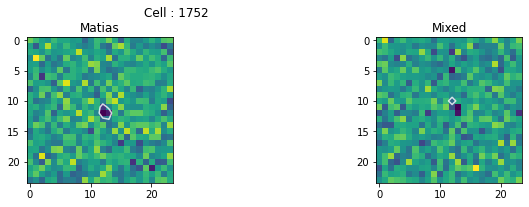

--- Ploting Done ---
matias : [  0.74883121  15.94856486  14.31159823   0.88289812   1.4374623
 125.46158555]
mixed : [7.09489793e-01 1.40769413e+00 9.25215672e+00 4.14964166e-01
 1.83251256e+00 4.02047310e-24]


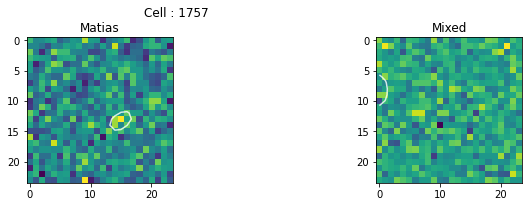

--- Ploting Done ---
matias : [1.24603665e+00 1.52511058e+01 1.26204118e+01 6.43103524e-01
 6.79643744e-01 6.27082683e-21]
mixed : [ 2.         15.20415842 12.5203791   0.46170107  0.38768007 39.74617884]


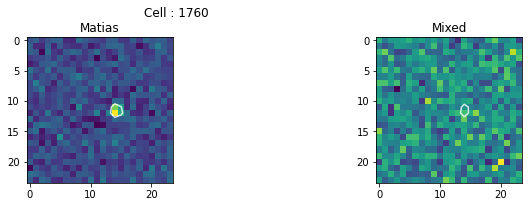

--- Ploting Done ---
matias : [1.17412511e-01 1.10000000e+01 1.10000000e+01 1.02069252e-01
 1.00784143e-01 1.37686642e-10]
mixed : [ 1.06706324 12.17265727 11.95054552  0.49970055  0.43809216 17.37280102]


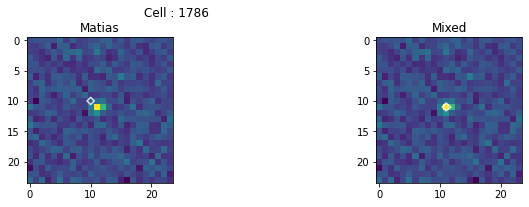

--- Ploting Done ---
matias : [1.78412456e-01 1.30000000e+01 1.40000006e+01 1.15115635e-01
 2.73773309e-01 7.20370384e-10]
mixed : [ 1.9999968  14.34284098 14.98768146  0.25183612  0.48734663 38.05205442]


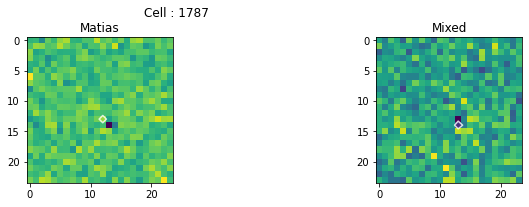

--- Ploting Done ---
matias : [-9.90339412e-01  1.31411892e+01  1.19373954e+01  1.01639950e+00
  8.22133397e-01  2.61343011e-24]
mixed : [-3.30598283e-15  1.20000000e+01  1.10000000e+01  1.00021527e-01
  1.01759821e-01  7.98871228e+00]


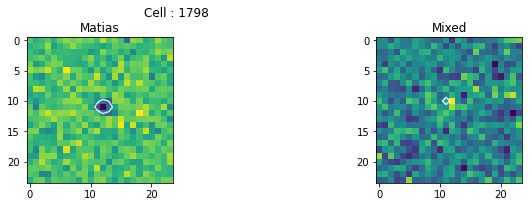

--- Ploting Done ---
matias : [ 2.         14.52447924 14.67002039  0.52665802  0.45442956 22.83922013]
mixed : [ 2.         14.56965494 14.70881081  0.52090349  0.42313322 27.71252206]


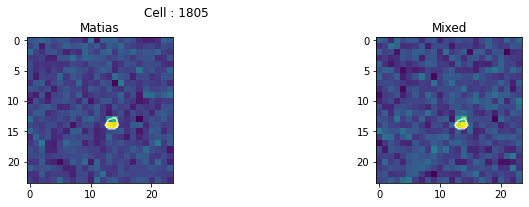

--- Ploting Done ---
matias : [-1.28617932e-09  1.00000000e+01  9.00000000e+00  1.00596954e-01
  1.03551791e-01  1.50643250e-04]
mixed : [1.26473652e+00 1.13233917e+01 9.98997196e+00 4.70789291e-01
 4.17238410e-01 3.75475185e-22]


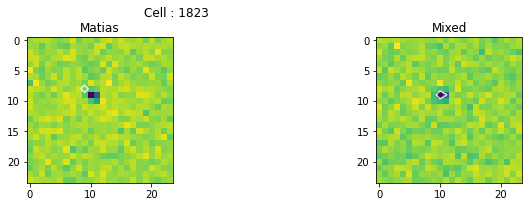

--- Ploting Done ---
matias : [ 1.24779345 15.00287152 14.37354583  0.74598163  0.52240283 35.59370285]
mixed : [ 1.99999655 14.73142246 14.42239569  0.57467522  0.36676888  8.82321169]


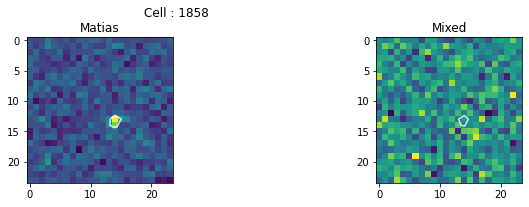

--- Ploting Done ---
matias : [-1.15447745 10.9033046  11.37107897  0.84267674  0.76601121 38.17071736]
mixed : [ 1.3727717  10.87784692 11.46067128  0.66672376  0.56446645 36.36071435]


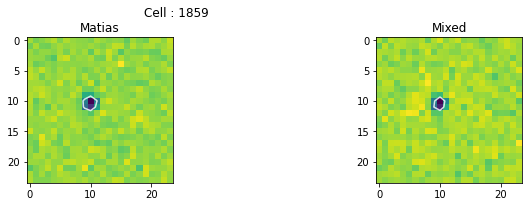

--- Ploting Done ---
matias : [ 1.13610288 15.84874337 11.2139996   0.93764866  0.6299141  49.89683393]
mixed : [ 1.28828464 15.65616493 11.3883056   0.73438773  0.40394173 49.23194642]


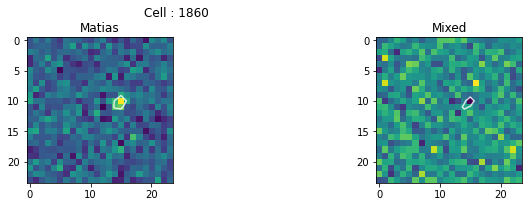

--- Ploting Done ---
matias : [-1.03360658 13.93750887 10.09883556  0.52572731  0.57712993 78.51039574]
mixed : [  1.0297268   13.89945413  10.03995038   0.38121407   0.4470222
 112.49453444]


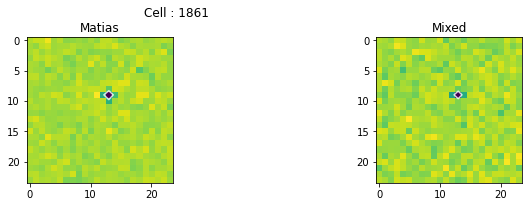

--- Ploting Done ---
matias : [ 1.99999979  2.12287967 17.31575029  1.09364244  0.23116274 41.04975627]
mixed : [ 0.63000917 19.82913721  8.77706213  0.28868528  3.13000743 37.20696335]


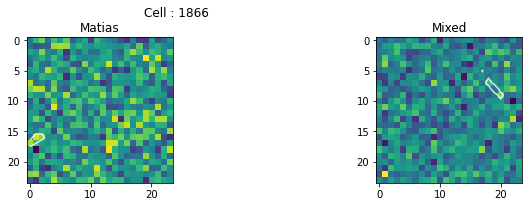

--- Ploting Done ---
matias : [ 1.00110154 11.98837012 10.9861961   0.49201403  0.73812063 39.51830829]
mixed : [ 1.72803428 11.94994292 10.70060846  0.37378033  0.29003783  6.30780911]


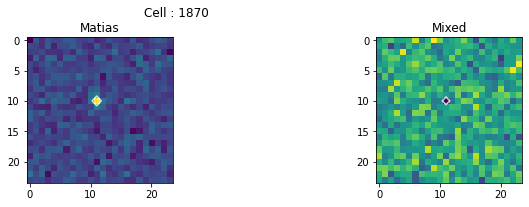

--- Ploting Done ---
matias : [ 1.16154745 14.78172476 10.74323788  0.90240592  0.73038531 52.41911402]
mixed : [ 1.72637718 14.54806696 10.77066882  0.6308134   0.4614031  54.22250395]


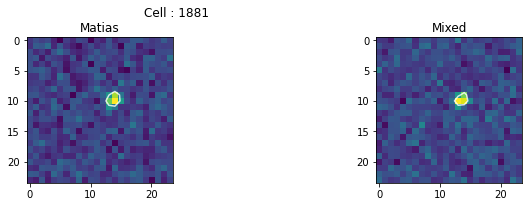

--- Ploting Done ---
matias : [-1.32682018 13.71673174 14.17412202  0.48439503  0.73136904  4.97637485]
mixed : [ 1.81098379 13.64625749 14.00671878  0.32539625  0.51620112  0.39208264]


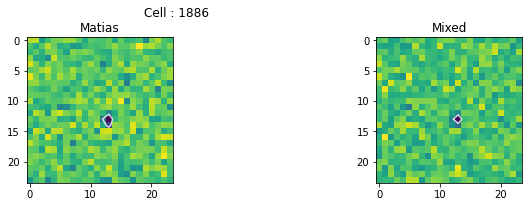

--- Ploting Done ---
matias : [-1.99999529 17.76842943  7.27065086  0.28794155  0.64890424 32.55281969]
mixed : [ 2.         16.94715613  3.20118266  0.11619939  1.34473328 56.12755065]


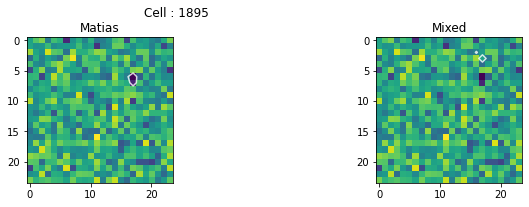

--- Ploting Done ---
matias : [-1.84688060e+00  1.29879399e+01  1.23643833e+01  4.67353274e-01
  3.29511497e-01  6.75678743e-44]
mixed : [ 1.99997775 12.83688856 12.28134426  0.25887224  0.35829939 29.62351046]


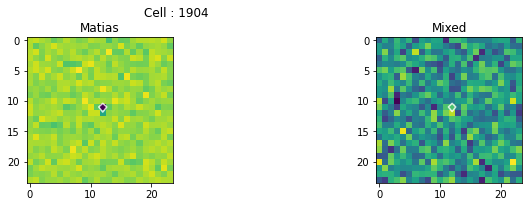

--- Ploting Done ---
matias : [1.28988696e+00 1.25048402e+01 1.32371190e+01 7.05056896e-01
 6.38348944e-01 8.64032436e-16]
mixed : [ 0.0243632  10.99999756 11.9999972   0.10736749  0.28251102 14.81441144]


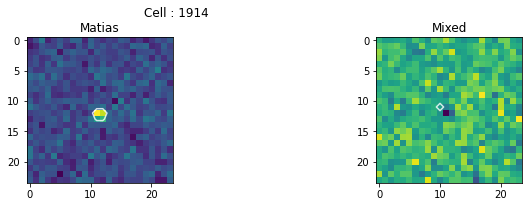

--- Ploting Done ---
matias : [ 1.74247723 13.51009527 13.40470536  0.63066586  0.53345033 11.96717353]
mixed : [ 2.         13.50489027 13.40788139  0.54587408  0.47322583 51.20404472]


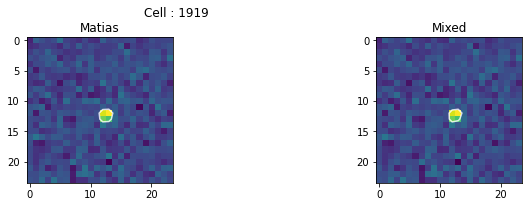

--- Ploting Done ---
matias : [ 1.16870962 12.54661157 10.21002171  0.92365765  0.41589325 35.06015697]
mixed : [ 2.         12.38391687 10.26913531  0.60147516  0.35452102 38.86452615]


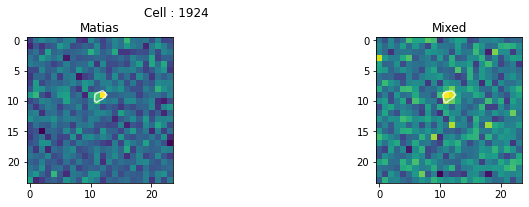

--- Ploting Done ---
matias : [ 1.28699949 14.46638505 15.09529742  0.77277247  0.62371189 48.48127959]
mixed : [ 1.65063228 14.45265216 15.14812164  0.60699469  0.42855859 38.84357063]


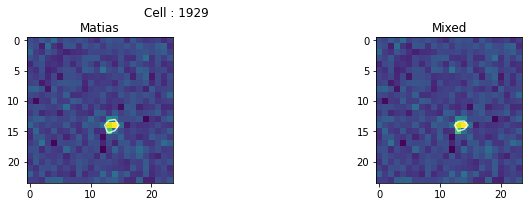

--- Ploting Done ---
matias : [ 1.1607161  10.6807005  13.79621989  0.45669888  0.71097135 48.76418419]
mixed : [ 1.39612726 10.71455101 14.01002153  0.34967819  0.40304483  2.887174  ]


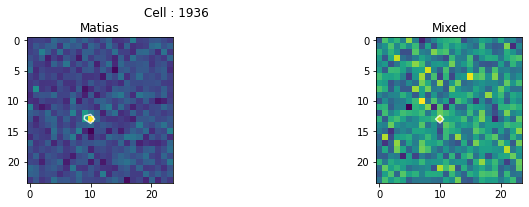

--- Ploting Done ---
matias : [ 1.10180448  9.42392368 13.83560199  1.05539433  0.84602547  5.98709363]
mixed : [1.30993799e+00 9.30929692e+00 1.37258700e+01 5.98641027e-01
 5.72433588e-01 1.15162002e-29]


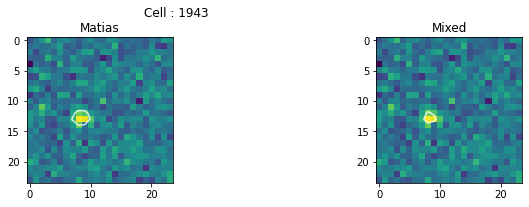

--- Ploting Done ---
matias : [-1.99999581e+00  1.55218962e+01  1.15972432e+01  3.97877172e-01
  9.83261844e-01  6.27654217e-27]
mixed : [1.18820384e+00 1.56035277e+01 1.18083471e+01 5.66941010e-01
 7.38968029e-01 1.81272754e-69]


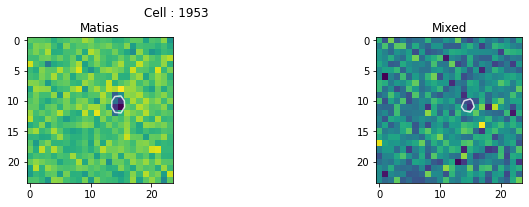

--- Ploting Done ---
matias : [ 1.09731836 12.47981581 13.56789826  1.27199188  0.75315377 30.23943795]
mixed : [ 2.         13.07304074 13.45918932  0.65413027  0.38475503 20.17771996]


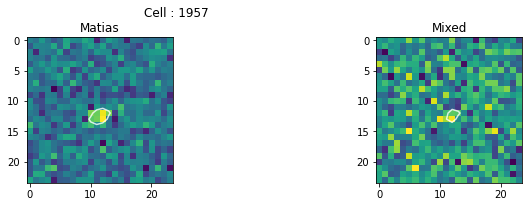

--- Ploting Done ---
matias : [1.07124209e+00 1.56025977e+01 1.11622824e+01 1.37044710e+00
 9.94109792e-01 3.84977482e-55]
mixed : [ 1.19613681 15.88538437 11.27292614  0.76193324  1.05804835 92.65041654]


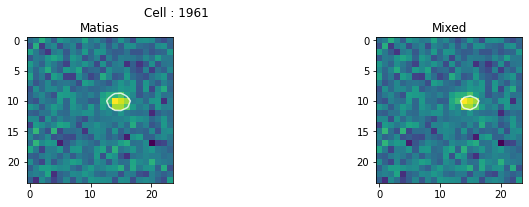

--- Ploting Done ---
matias : [-1.03092799 12.93705568 10.83387845  0.54726665  0.80585034 84.67117236]
mixed : [ 1.51046451 12.83848998 10.60547445  0.4391004   0.79125555 80.50546659]


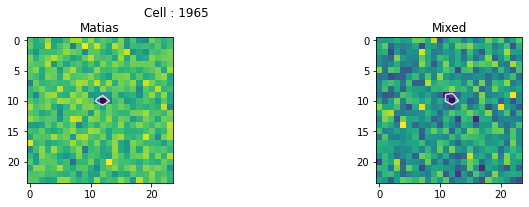

--- Ploting Done ---
matias : [1.09523744e+00 1.22680879e+01 1.30483514e+01 6.48035033e-01
 5.27400597e-01 4.96413401e-17]
mixed : [1.61752878e+00 1.22585186e+01 1.27663329e+01 4.75022343e-01
 2.86386001e-01 1.27881768e-48]


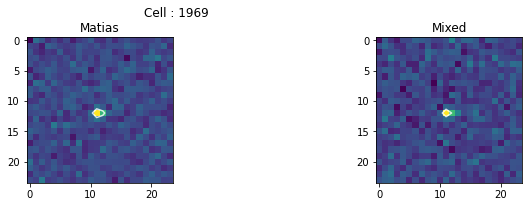

--- Ploting Done ---
matias : [ 2.         12.75816924 13.387775    0.5607929   0.33607514  7.3826404 ]
mixed : [ 1.99785338 12.80851014 13.24262055  0.25936279  0.34515039 37.76957309]


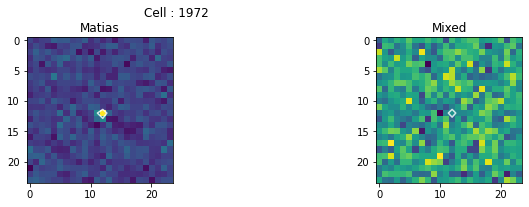

--- Ploting Done ---
matias : [-1.19747626 11.33861302 11.81594     0.73844262  0.5887719  17.93417489]
mixed : [-8.40556584e-12  1.00000000e+01  1.10000000e+01  1.02576324e-01
  1.01132873e-01  1.00000000e-10]


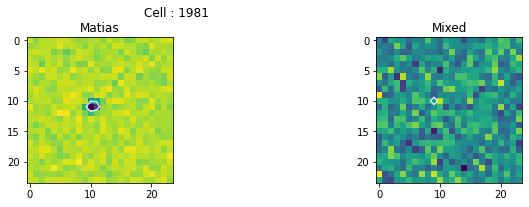

--- Ploting Done ---
matias : [ 1.99999379 12.64295411 13.23509922  0.34743406  0.54588974 54.60666942]
mixed : [ 2.         12.56932262 13.05366863  0.35678165  0.39214054 44.67970543]


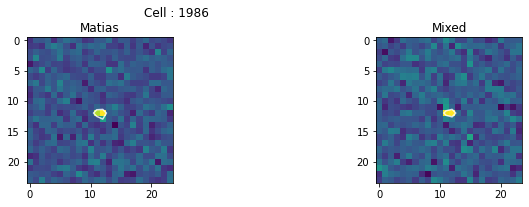

--- Ploting Done ---
matias : [1.25656163e+00 1.15368162e+01 1.25273670e+01 9.27711556e-01
 6.91409876e-01 6.60895403e-47]
mixed : [ 1.45295922 11.4745972  12.59122244  0.57830044  0.75582759 44.82937506]


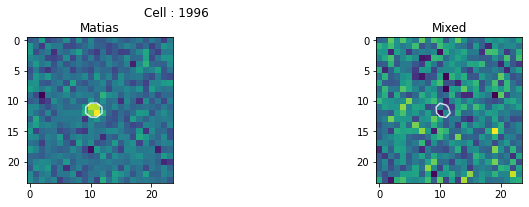

--- Ploting Done ---
matias : [ 1.39830611 11.60946871 12.30426348  0.60074455  0.80634354 48.72412457]
mixed : [ 1.77015309 11.6437623  12.3560192   0.46689913  0.57461778 55.99168891]


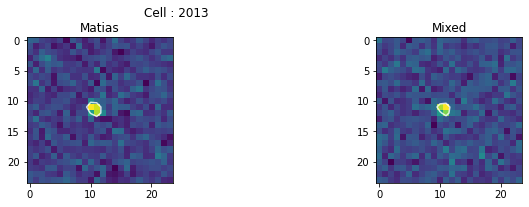

--- Ploting Done ---
matias : [ 0.14423156 11.9729547  14.94418255  0.10122111  0.39203596 18.41115584]
mixed : [ 1.99998791 13.19372027 15.22987548  0.33370204  0.25368922 50.15341357]


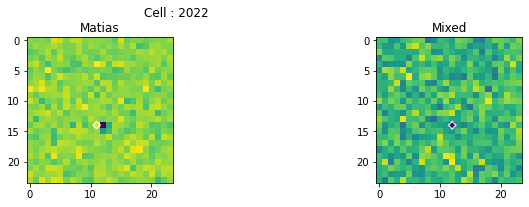

--- Ploting Done ---
matias : [3.90122357e-01 2.64086051e+00 1.98181308e+01 4.86251250e-01
 4.89062016e+00 1.01029894e-49]
mixed : [3.65368040e-10 1.20000000e+01 9.00000000e+00 1.00182308e-01
 3.17567847e-01 1.00000000e-10]


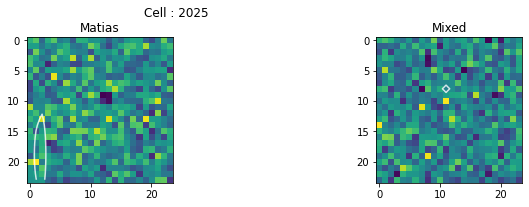

--- Ploting Done ---
matias : [ 1.15257754 12.20465572 10.99034354  0.97920151  0.71541639 30.48933195]
mixed : [ 1.24302504 12.28238185 11.15527706  0.79359857  0.55164735 31.62992904]


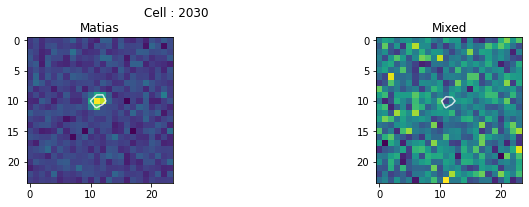

--- Ploting Done ---
matias : [ 1.33823767 15.37911697 13.65023889  0.91918428  0.10158516 20.14756446]
mixed : [1.49684108e+00 1.47530130e+01 1.51213621e+01 2.86034394e-01
 4.86845126e-01 8.03932296e-34]


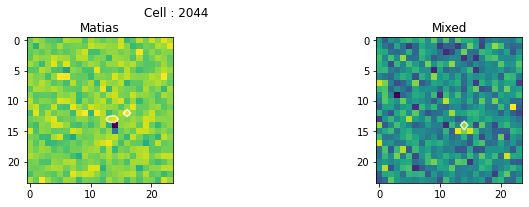

--- Ploting Done ---
matias : [-1.02213232e+00  1.10776358e+01  1.09510147e+01  6.06259995e-01
  5.26172199e-01  1.65249968e-29]
mixed : [1.01959545e+00 1.10929080e+01 1.09683262e+01 5.20523206e-01
 3.91402707e-01 4.71253687e-12]


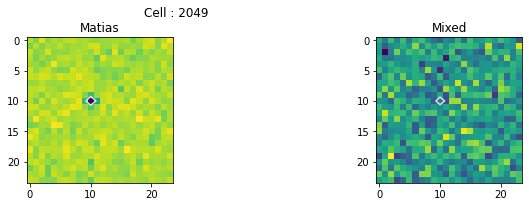

--- Ploting Done ---
matias : [-1.02844834 12.33548209 14.64258038  0.11486363  7.09749262 38.72463475]
mixed : [2.98290457e-02 1.10712650e+01 8.49877202e+00 7.59506839e+00
 2.40000000e+01 1.16644458e-19]


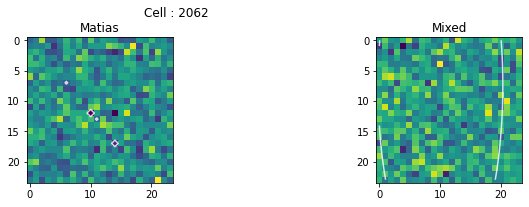

--- Ploting Done ---
matias : [-2.         14.11258187 12.59127957  0.36093936  0.54934451 69.08927401]
mixed : [ 2.         14.14172188 12.63399689  0.31682596  0.44783423 42.74839158]


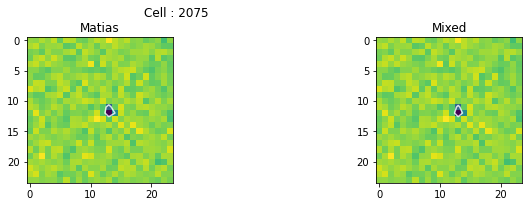

--- Ploting Done ---
matias : [-1.74958957 14.62963472 13.38010466  0.58464176  0.42277937 82.44604289]
mixed : [ 2.         14.74583486 13.63971834  0.2983189   0.3745456  33.728562  ]


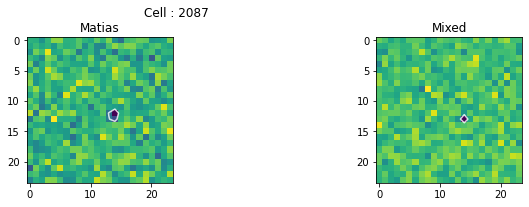

--- Ploting Done ---
matias : [-1.55193426e+00  1.52738474e+01  1.21098162e+01  2.99604837e-01
  6.22268967e-01  7.82682595e-29]
mixed : [1.33620705e+00 1.51938217e+01 1.21182351e+01 2.68967862e-01
 4.81198859e-01 3.18087712e-06]


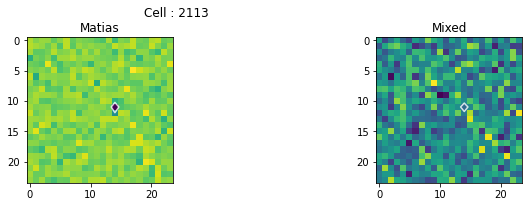

--- Ploting Done ---
matias : [-0.67415837 15.99945604 12.0005544   0.34416239  0.10002858 19.70006735]
mixed : [ 1.99999996 15.65387475 12.66346853  0.66500499  0.37347648 44.60546803]


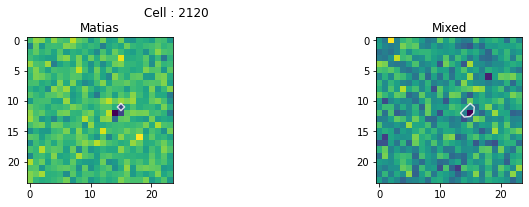

--- Ploting Done ---
matias : [-2.         15.58099713 12.31424901  0.44584214  0.42445634 52.74324469]
mixed : [ 1.99999999 15.58706873 12.27145507  0.35683901  0.48502841 84.23867295]


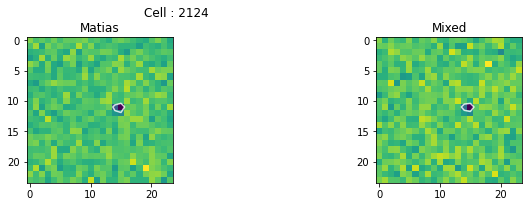

--- Ploting Done ---
matias : [ 1.44726909 12.61134942 11.83421207  0.47826677  0.678953    6.78179817]
mixed : [ 1.56434655 12.6307928  11.86938018  0.47441096  0.41433597 71.91805898]


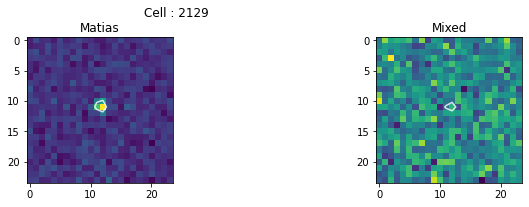

--- Ploting Done ---
matias : [-2.29577991e-11  1.10000000e+01  1.00000000e+01  1.28757526e-01
  4.28796489e-01  2.06366556e-01]
mixed : [1.21232228e+00 1.23081282e+01 1.10427877e+01 5.05613684e-01
 3.56459498e-01 2.22558851e-11]


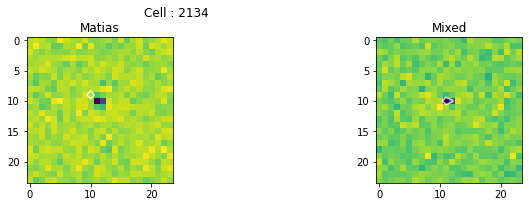

--- Ploting Done ---
matias : [-1.22774222 12.32007115 13.74991767  0.66615261  0.56792307 34.35998044]
mixed : [3.17707373e-11 1.10000000e+01 1.30000000e+01 1.01840150e-01
 4.76569763e-01 1.00000000e-10]


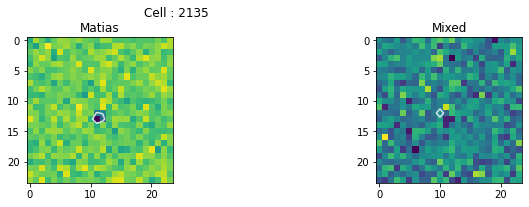

--- Ploting Done ---
matias : [-1.18141554 11.48143607 12.97379958  0.69126954  0.77945627 56.79414346]
mixed : [ 1.9999966  11.26468511 12.77158508  0.29366502  0.40874709 53.0947834 ]


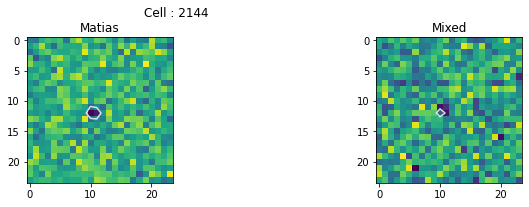

--- Ploting Done ---
matias : [ 1.72598062 11.38062191 12.51364689  0.76600498  0.54115083  5.50390178]
mixed : [ 2.         11.48611476 12.45946769  0.59006504  0.51781958 24.25877413]


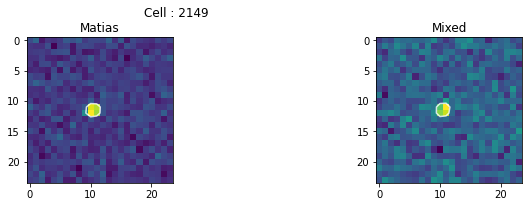

--- Ploting Done ---
matias : [9.81608601e-01 1.37667698e+01 1.20657507e+01 1.01321768e+00
 8.23651461e-01 1.47233382e-31]
mixed : [1.27005544e+00 1.37256647e+01 1.22316643e+01 8.99447456e-01
 5.22254118e-01 2.08715457e-51]


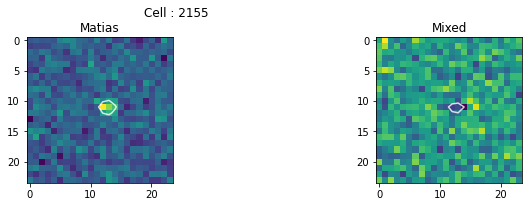

--- Ploting Done ---
matias : [ 0.15019868 10.99999871 11.99999805  0.10025265  0.3186045  17.79573583]
mixed : [ 1.53981917 11.91858803 13.25320812  0.26686097  0.28859285  0.33192825]


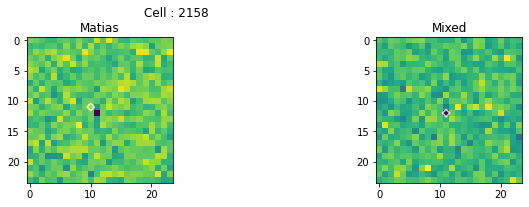

--- Ploting Done ---
matias : [1.13619239e+00 9.90578570e+00 1.08427256e+01 1.07550731e+00
 9.07312759e-01 3.22128638e-23]
mixed : [ 1.16289219  9.84837175 10.75397903  0.91754266  0.59050856 22.72580286]


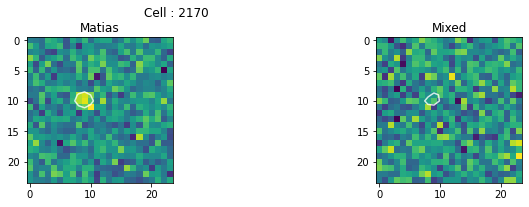

--- Ploting Done ---
matias : [ 2.         11.69488343 14.44016266  0.52263651  0.4114279   9.90525663]
mixed : [ 2.         11.649569   14.38817432  0.44396785  0.43731997 56.14725858]


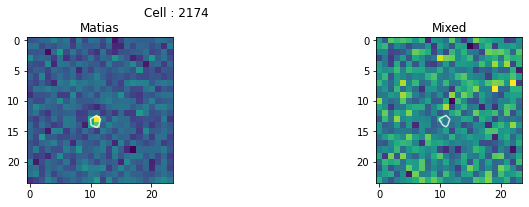

--- Ploting Done ---
matias : [ 1.11427225 11.67268967 13.83840088  0.67302539  0.75269933 80.92161455]
mixed : [ 1.24064542 11.66408547 13.81749317  0.45878686  0.62057268 86.30525885]


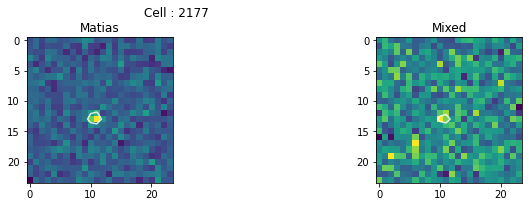

--- Ploting Done ---
matias : [-1.11564274 10.37936543 11.0127084   0.75730968  0.85600628 44.14678465]
mixed : [ 1.01190267 10.06061962 11.03214998  0.54807669  0.81246082 47.141461  ]


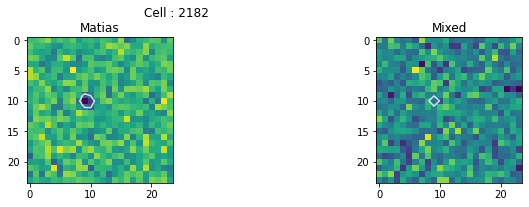

--- Ploting Done ---
matias : [-0.35108057 11.90039533 11.00417035  0.37478528  3.7572929  40.63561997]
mixed : [ 1.83024169 11.59297011 11.00059028  0.19792302  0.37233119 86.24937808]


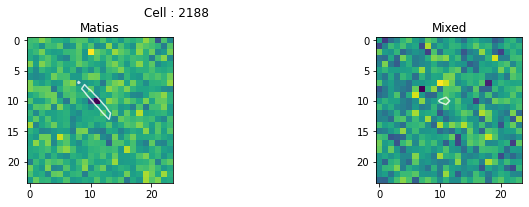

--- Ploting Done ---
matias : [-2.         11.50196185 13.80859228  0.41981163  0.55897051 14.22772685]
mixed : [ 1.99988931 11.59112135 13.63745733  0.33652085  0.56800565 79.67079318]


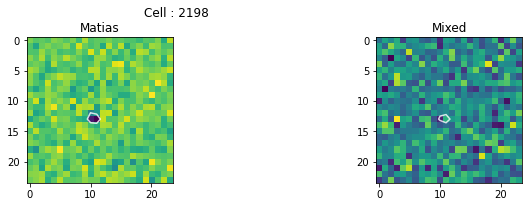

--- Ploting Done ---
matias : [  1.14725497  13.78341972  13.19792754   0.39593356   0.65062133
 102.65341793]
mixed : [ 1.55832304 14.05337737 13.29002848  0.28681924  0.49044201 70.88738052]


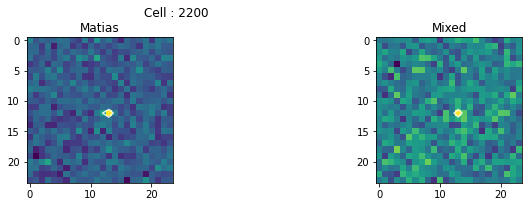

--- Ploting Done ---
matias : [ 1.16509415 13.97713829 10.60960974  0.67153189  0.78784049 38.73581136]
mixed : [1.18656620e+00 1.39006531e+01 1.06945405e+01 5.78756486e-01
 5.13494924e-01 1.23303713e-40]


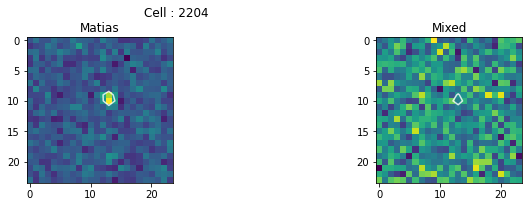

--- Ploting Done ---
matias : [-1.99992417 13.87956736 10.55254799  0.37464438  0.50334287 77.27409652]
mixed : [2.00000000e+00 1.38566034e+01 1.05348104e+01 3.87891584e-01
 4.17234173e-01 5.23673664e-45]


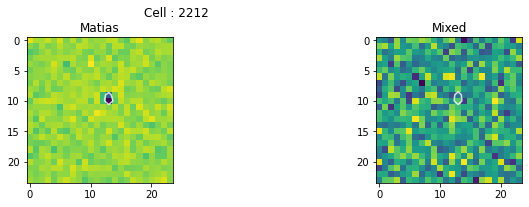

--- Ploting Done ---
matias : [1.03738942e+00 1.38781566e+01 1.10377982e+01 6.11912972e-01
 7.74672290e-01 9.46391116e-28]
mixed : [1.05922204e+00 1.38435665e+01 1.10080932e+01 4.65320514e-01
 5.65684177e-01 5.53729270e-13]


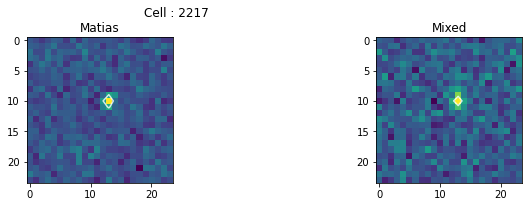

--- Ploting Done ---
matias : [-2.00000000e+00  1.43934584e+01  1.16055552e+01  4.19566213e-01
  5.44271866e-01  4.70302773e-17]
mixed : [ 1.92770702 14.30262516 11.6749087   0.3802188   0.47577781 27.96326255]


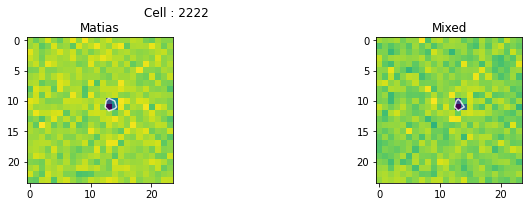

--- Ploting Done ---
matias : [-2.         12.81789638 10.4705746   0.62485197  0.40652409  7.42837938]
mixed : [-7.85421288e-12  1.20000000e+01  9.00000000e+00  4.62679843e-01
  1.02518705e-01  9.29955522e+00]


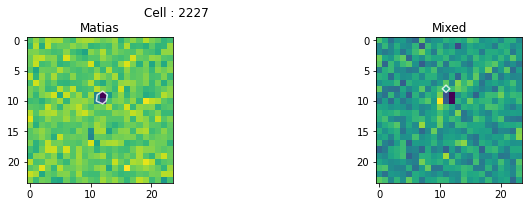

--- Ploting Done ---
matias : [ 0.24485561 15.54800913  9.57497091  6.9225987   0.1        20.55086508]
mixed : [ 2.         14.99266012 11.50382509  0.31661248  0.51344472 33.91158037]


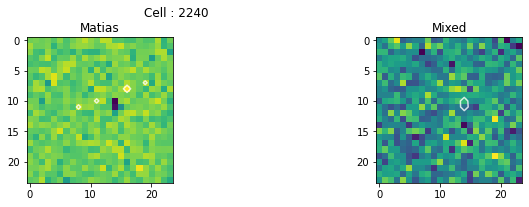

--- Ploting Done ---
matias : [ 1.99044307 10.53006116 12.22203034  0.27621291  0.50432187 56.89349454]
mixed : [ 0.06247837  7.63110666 14.67419282 23.99933782  8.92496312 18.23915334]


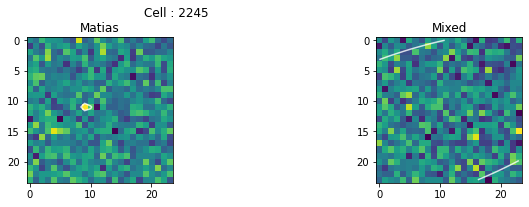

--- Ploting Done ---
matias : [1.38982694e+00 1.26856879e+01 9.52708651e+00 1.03889880e+00
 6.87492259e-01 2.01600070e-08]
mixed : [ 1.99999856 12.4198928   9.47686307  0.37126919  0.73974395 76.13662614]


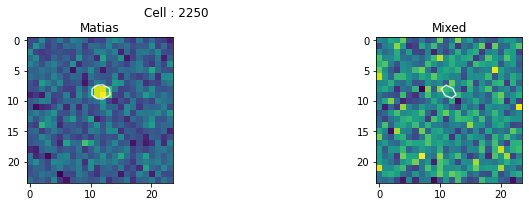

--- Ploting Done ---
matias : [-1.14969888 12.94690405 10.71915124  0.5151594   0.9552924  43.25411673]
mixed : [ 2.         12.75254287 10.48389411  0.36990169  0.55330856 54.91280114]


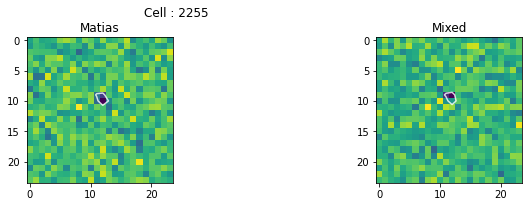

--- Ploting Done ---
matias : [ 1.99999813 15.51696902 12.62353341  0.36629458  0.51963661 53.06557265]
mixed : [ 1.99997483 15.57289969 12.84280636  0.31864761  0.50165978 26.92735164]


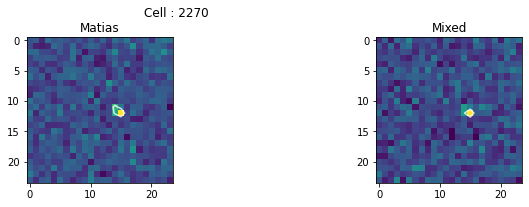

--- Ploting Done ---
matias : [-1.23337830e+00  1.44065892e+01  1.19719555e+01  6.41599359e-01
  6.41000051e-01  1.04444120e-39]
mixed : [6.83761857e-12 1.30000000e+01 1.10000000e+01 1.00000016e-01
 1.06683328e-01 2.96845280e+01]


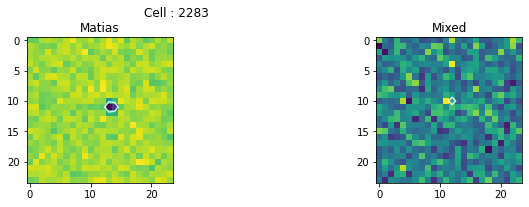

--- Ploting Done ---
matias : [2.00000000e+00 1.24362643e+01 1.10384064e+01 3.70844154e-01
 6.32793669e-01 3.66310833e-61]
mixed : [ 1.99999911 12.39932994 11.01539776  0.3365599   0.42335046 10.21495833]


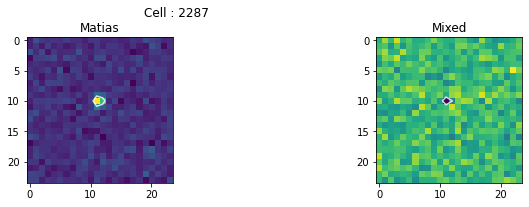

--- Ploting Done ---
matias : [ 0.08571349 13.0030335  12.96930937  0.13953027  3.69016538  0.82407072]
mixed : [ 1.99999827 13.78327139 11.58169798  0.35551496  0.41359742  1.23095436]


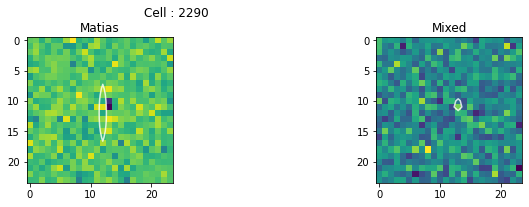

--- Ploting Done ---
matias : [ 1.1005388  11.66105861 10.87914329  0.91983199  0.62339631 26.46400876]
mixed : [ 1.1594252  11.73399464 10.95507585  0.58379414  0.47407359 50.4159734 ]


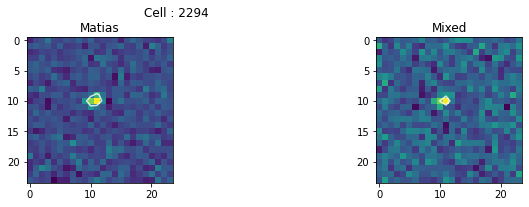

--- Ploting Done ---
matias : [ 1.99999987 10.81478795 10.64848666  0.62188091  0.33624696 28.63009113]
mixed : [ 1.99999854 11.29231825 10.57844306  0.40320502  0.73991561 89.89617416]


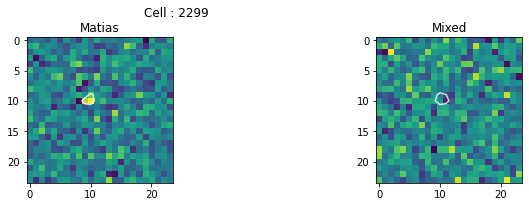

--- Ploting Done ---
matias : [-1.55932809 11.94999723 12.4496166   0.72087917  0.50921308  6.13580598]
mixed : [ 2.         11.75125942 12.53242421  0.37933705  0.45408417 15.63165426]


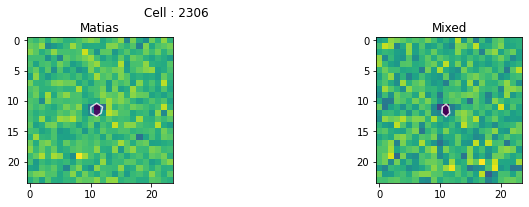

--- Ploting Done ---
matias : [ 1.20048195 10.84234195 11.69894078  0.73080445  0.54219988 46.09933687]
mixed : [1.99999993e+00 1.11635400e+01 1.15604320e+01 3.31874966e-01
 4.10235985e-01 2.39611417e-48]


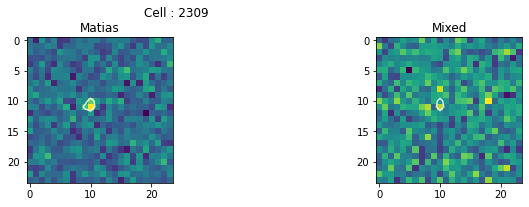

--- Ploting Done ---
matias : [ 1.23057347 12.8201396  12.64732913  0.62173287  0.72900541 20.1774827 ]
mixed : [1.41173201e+00 1.28729482e+01 1.25821992e+01 4.87434040e-01
 5.43841094e-01 4.64712089e-20]


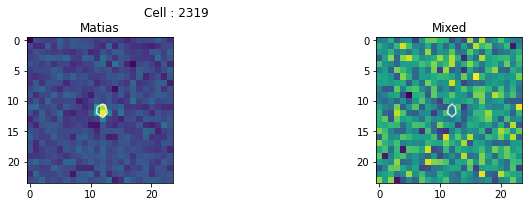

--- Ploting Done ---
matias : [ 2.         13.19268001 12.43546957  0.38160244  0.60851825 90.512513  ]
mixed : [ 2.         13.29149542 12.3571697   0.35830923  0.39320583 27.40191196]


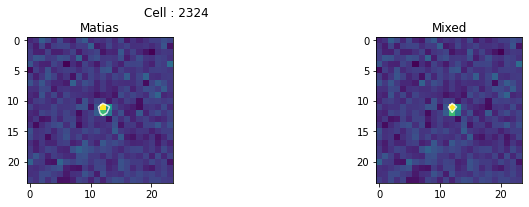

--- Ploting Done ---
matias : [-1.99999999e+00  1.14891001e+01  1.23662300e+01  4.47554325e-01
  8.50930214e-01  2.38959715e-10]
mixed : [ 1.70584642 11.57795181 12.14986248  0.64749401  0.35696039 66.65643117]


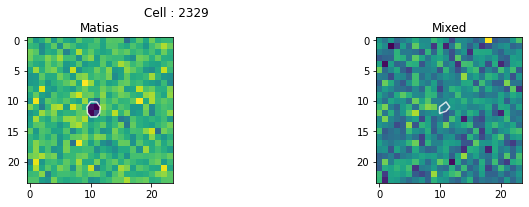

--- Ploting Done ---
matias : [-1.9999999  12.36725885 11.64539994  0.39401622  0.53481179  6.87412741]
mixed : [1.99999988e+00 1.22767881e+01 1.16415077e+01 3.48334296e-01
 4.11980221e-01 2.71687243e-35]


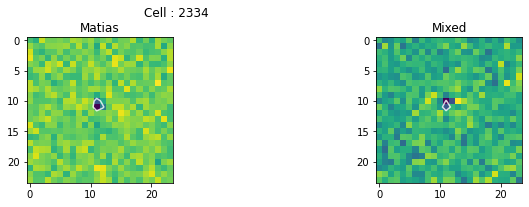

--- Ploting Done ---
matias : [ 1.21773206 12.13865199 11.65395675  0.52433204  0.65329379  4.42114876]
mixed : [1.98195834e+000 1.16699251e+001 1.17065768e+001 3.15720647e-001
 5.81421631e-001 3.73109241e-124]


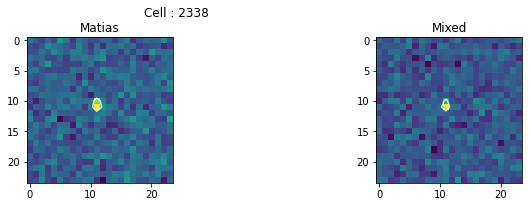

--- Ploting Done ---
matias : [0.23098129 9.99408087 8.18012643 0.10891955 0.19058004 0.12078125]
mixed : [ 1.99158186  0.37983206  0.50164884  0.10003843  0.70850092 53.73221812]


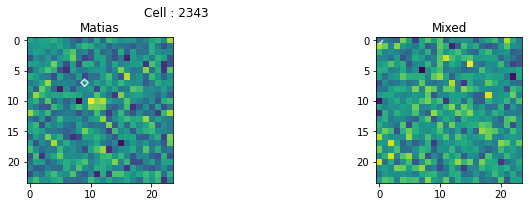

--- Ploting Done ---
matias : [-1.10191609 12.90494933 12.90670305  0.10025974  0.33786112 36.63204912]
mixed : [ 1.99998653 12.21340936 12.72433723  0.16279897  0.81461912 64.04750331]


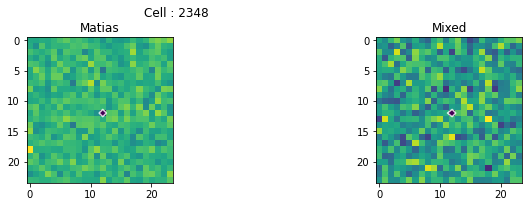

--- Ploting Done ---
matias : [ 1.99632262  3.15154124  5.61249842  0.84671614  0.15140979 20.36573607]
mixed : [-1.04493778e-12  2.10000000e+01  4.00000000e+00  4.32902239e-01
  1.00000290e-01  6.56542459e+00]


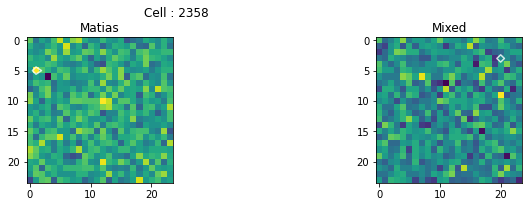

--- Ploting Done ---
matias : [-2.         14.47127899 13.17172107  0.41005666  0.52689607  0.98410731]
mixed : [ 2.         14.49308701 13.22385912  0.4729932   0.37080915 16.19913902]


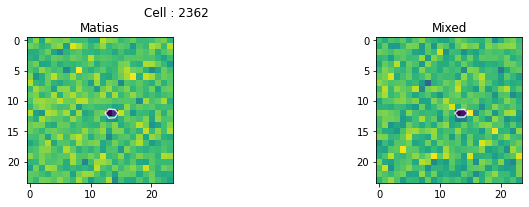

--- Ploting Done ---
matias : [-2.         13.49284906 12.06682332  0.41179709  0.731438   18.17590467]
mixed : [ 2.         13.28453668 11.69888294  0.34514866  0.62255194 34.12685245]


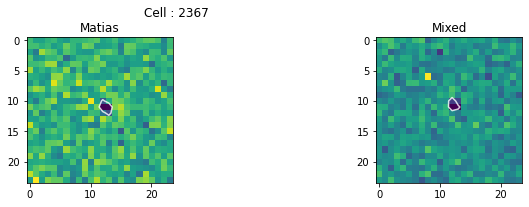

--- Ploting Done ---
matias : [-2.00000000e+00  1.47055424e+01  1.55202824e+01  4.65668046e-01
  4.94816322e-01  3.54089462e-20]
mixed : [1.99999999e+00 1.47836438e+01 1.55165757e+01 3.91025853e-01
 4.70612927e-01 9.36572968e-32]


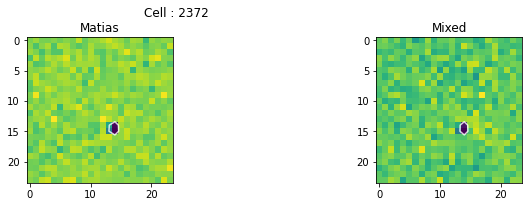

--- Ploting Done ---
matias : [ 1.1830463  14.5161779  15.61939369  0.9127655   0.54449882 46.45425386]
mixed : [ 1.99999964 14.497759   15.59051644  0.57947298  0.3516445  23.54631208]


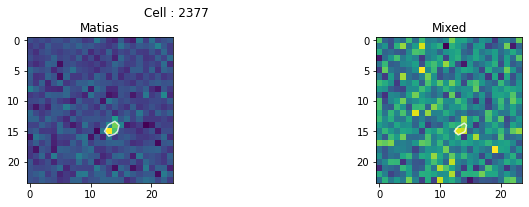

--- Ploting Done ---
matias : [ 1.99999922 15.42619143 10.94586914  0.57102057  0.31085825 58.7577932 ]
mixed : [1.64469728e-09 1.40000000e+01 1.00000000e+01 1.13138171e-01
 4.28813910e-01 1.00000000e-10]


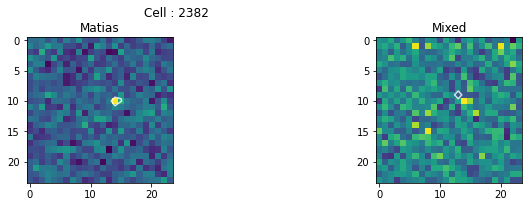

--- Ploting Done ---
matias : [ 1.18038381 11.15244498 12.23885443  0.99974399  0.66020351 26.64412562]
mixed : [-4.83726525e-13  1.00000000e+01  1.10000000e+01  1.26414341e-01
  1.02644096e-01  5.12986460e+00]


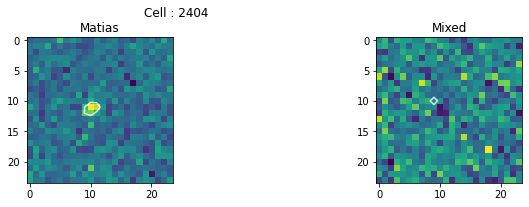

--- Ploting Done ---
matias : [-1.99966009 11.38979386 12.82961698  0.20720461  1.02883189 14.98577172]
mixed : [1.65123228e+00 1.10761110e+01 1.16769150e+01 5.83235284e-01
 3.26795191e-01 9.77008376e-42]


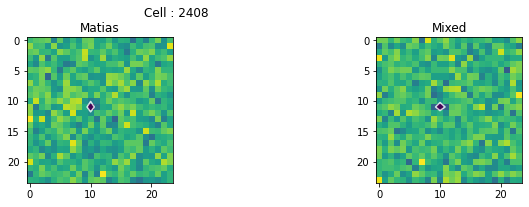

--- Ploting Done ---
matias : [ 1.16565886 13.68144034 10.6512634   0.1         2.57782023 35.59841496]
mixed : [ 1.20700837 13.53109451 10.28403705  0.1         1.40802999 33.84472174]


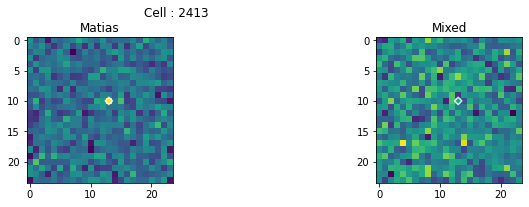

--- Ploting Done ---
matias : [ 2.         13.53292231 11.24851063  0.41638612  0.72033054  5.23772891]
mixed : [ 2.         13.56506052 11.30962341  0.51256346  0.3945071  75.81095739]


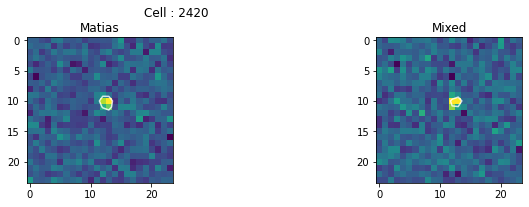

--- Ploting Done ---
matias : [-1.02441791 16.0618503  13.86622584  0.69767698  0.44028794 44.75438276]
mixed : [1.14666433e+00 1.61347889e+01 1.39789809e+01 2.58769424e-01
 4.24626287e-01 1.10790290e-22]


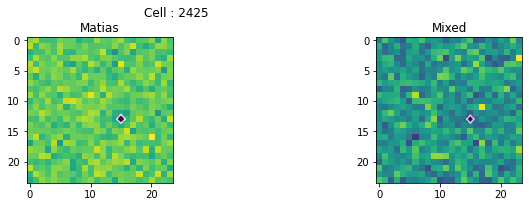

--- Ploting Done ---
matias : [ 1.11298553 20.38199096  1.49378694  0.10000778  4.54114463 49.91573596]
mixed : [ 1.93428674  0.95490643 15.14833353  0.1000063   1.45869619 30.79492399]


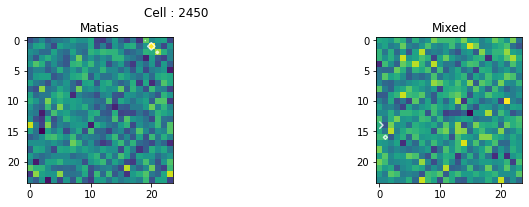

--- Ploting Done ---
matias : [-1.99999979e+00  1.46667959e+01  1.09390306e+01  2.84668425e-01
  6.49419647e-01  3.79661520e-45]
mixed : [1.20010185e+00 1.48153505e+01 1.09453095e+01 3.11982547e-01
 4.54743477e-01 2.99753819e-13]


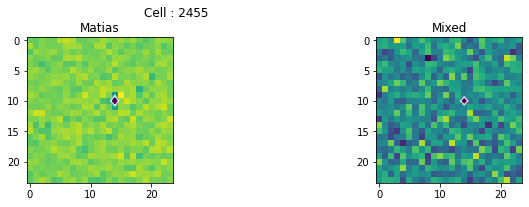

--- Ploting Done ---
matias : [ 2.         11.71544783 13.57566885  0.55617336  0.43235953 19.21848748]
mixed : [ 1.99999447 12.153396   13.70483973  0.21040435  0.74642539 24.10615558]


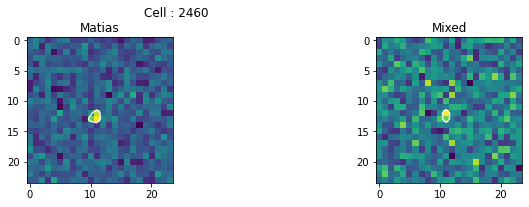

--- Ploting Done ---
matias : [-1.20652833 11.85743861 13.66796441  0.70186289  0.61806665 13.60905792]
mixed : [1.99999799e+00 1.17876960e+01 1.36304790e+01 4.90679519e-01
 3.36609790e-01 1.39605739e-81]


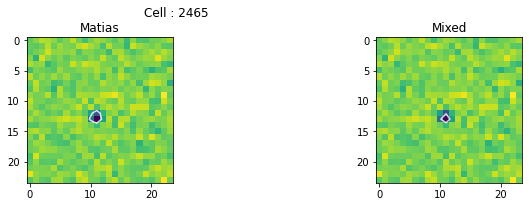

--- Ploting Done ---
matias : [-1.73616246 11.31117422 13.65792769  0.65690863  0.32087196  9.55317785]
mixed : [ 2.         11.38727896 13.76722158  0.38398311  0.30494557 28.48518252]


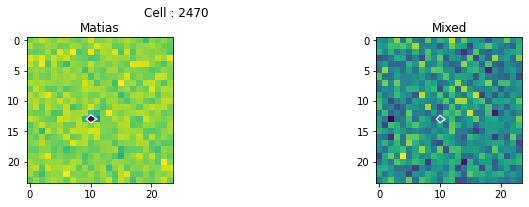

--- Ploting Done ---
matias : [ 1.03904084 13.87587354 14.04403648  0.52523958  0.59253088 71.29146059]
mixed : [  1.00790415  13.96058365  13.98442206   0.32049755   0.4274939
 130.01937503]


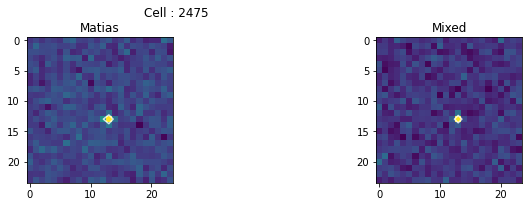

--- Ploting Done ---
matias : [-1.99999994 14.56409396 12.80634832  0.35841075  0.6065657  11.68649793]
mixed : [ 1.57937612 14.56381436 12.81531011  0.36772631  0.52558122 46.79459322]


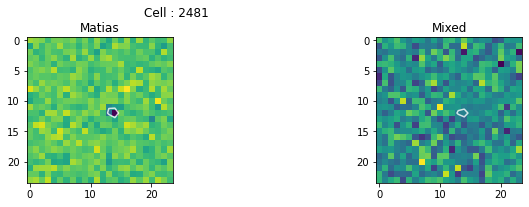

--- Ploting Done ---
matias : [ 0.71323742 14.70659666 12.99317398  1.68659917  0.96928679 63.04854983]
mixed : [-1.25476455e-10  1.30000000e+01  1.20000000e+01  3.25721884e-01
  2.02874276e-01  3.03292320e+01]


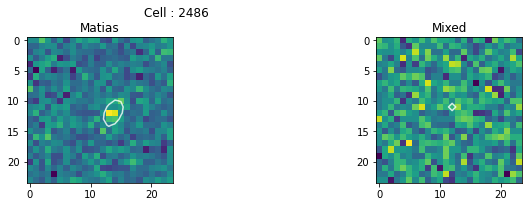

--- Ploting Done ---
matias : [ 1.30400351 12.40879128 11.71795105  0.71277967  0.90702993 22.63095243]
mixed : [ 2.         12.49187487 11.90582399  0.4162036   0.57084658 17.71879871]


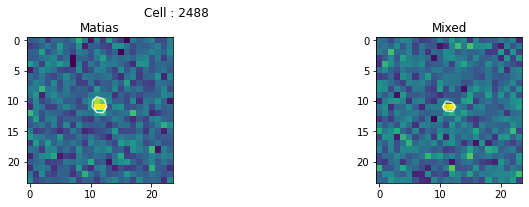

--- Ploting Done ---
matias : [-1.97625849e-11  1.40000000e+01  1.30000000e+01  1.10699840e-01
  2.20644120e-01  1.00000000e-10]
mixed : [-5.53971417e-10  1.40000000e+01  1.30000000e+01  1.01714669e-01
  3.54925426e-01  1.00000000e-10]


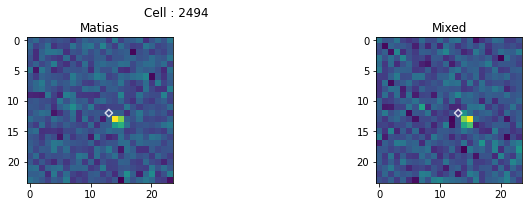

--- Ploting Done ---
matias : [-1.07102186 12.80574608 13.03414003  0.60128272  0.50596638 53.06883295]
mixed : [ 1.55434239 12.69451822 12.97711557  0.32338113  0.40517622  8.25317135]


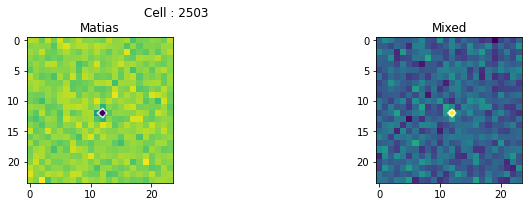

--- Ploting Done ---
matias : [ 1.99994483 12.75956635 13.39392563  0.74775871  0.33558075  4.33950304]
mixed : [ 1.18191797 12.81281746 13.08277423  0.34178324  0.53428435 43.67231271]


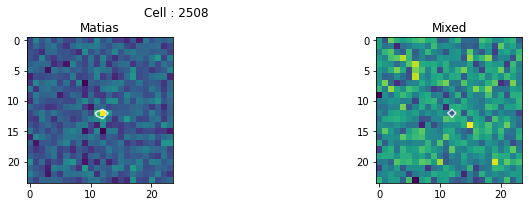

--- Ploting Done ---
matias : [1.10019875e-07 8.38780482e+00 1.44911205e+01 4.31165088e-01
 1.05870040e-01 1.23411908e+01]
mixed : [ 2.         12.35973012 14.62469614  0.43680798  0.52973916 32.88997296]


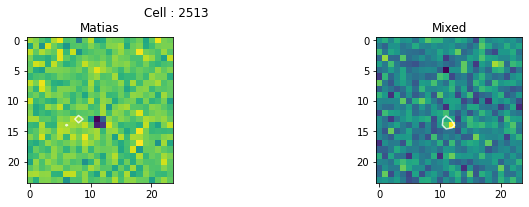

--- Ploting Done ---
matias : [ 1.99588044 18.66348194  9.70225583  0.13506785  1.4677276  28.65051995]
mixed : [-2.85701031e-12  1.40000000e+01  1.30000000e+01  4.63667201e-01
  1.00369895e-01  1.84685730e-01]


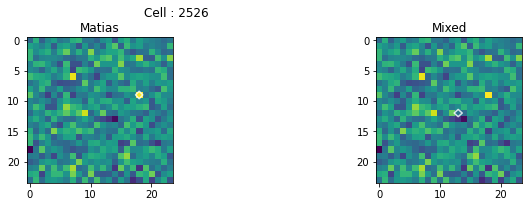

--- Ploting Done ---
matias : [-1.00549662e+00  1.49814548e+01  1.39849308e+01  5.53509415e-01
  6.27801816e-01  1.21804265e-16]
mixed : [ 1.00926267 15.03569794 13.95936696  0.39851238  0.43100875 54.02317319]


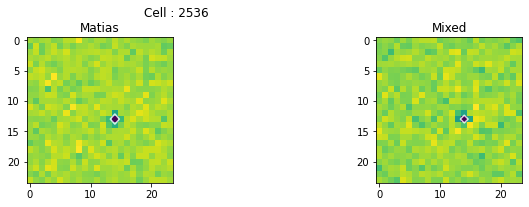

--- Ploting Done ---
matias : [-1.99999996 13.34238513 10.37200172  0.39592338  0.4537628  80.53548054]
mixed : [-4.97423851e-11  1.20000000e+01  9.00000000e+00  1.71631365e-01
  1.31785307e-01  2.90119665e+01]


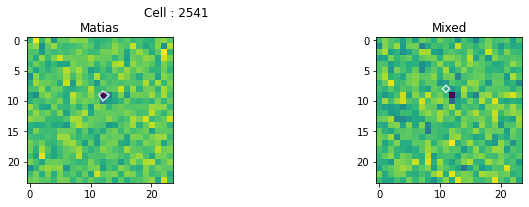

--- Ploting Done ---
matias : [-0.80360151 16.8580725  19.6057678   0.1        12.89008317 12.25946286]
mixed : [5.84139664e-02 1.64961271e-11 5.89051377e+00 5.18502870e+00
 2.24302204e+01 6.90483333e+01]


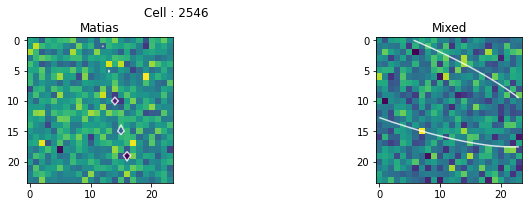

--- Ploting Done ---
matias : [-1.99999994 15.57985014  9.88619588  0.35257773  0.546631    8.37719905]
mixed : [1.72351133e+00 1.56758873e+01 9.98493953e+00 3.10868492e-01
 4.31949365e-01 6.30568677e-42]


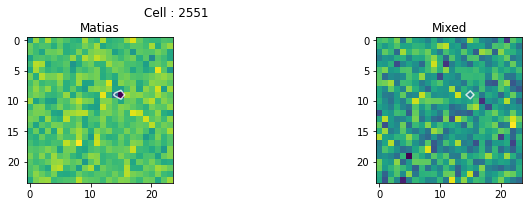

--- Ploting Done ---
matias : [ 0.18985573 13.97252827 12.07451767  7.44306374  2.45092804 41.10334362]
mixed : [ 1.99999999 12.20900929 12.3802403   0.758559    0.23515734 29.26752526]


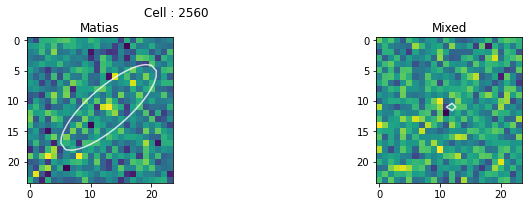

--- Ploting Done ---
matias : [ 1.72997687 20.46158831 22.31078783  0.10000003  1.4549252  32.3727293 ]
mixed : [7.47268937e-01 1.28993850e+01 1.27652051e+01 8.51276848e-01
 9.62291941e-01 3.78272538e-36]


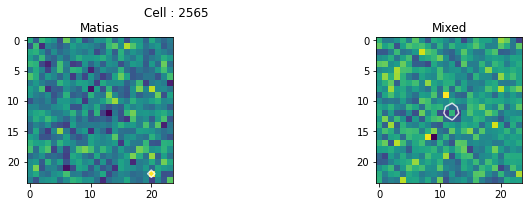

--- Ploting Done ---
matias : [-1.21422383e+00  1.45980682e+01  1.54330826e+01  5.97137790e-01
  1.03293143e+00  5.47972062e-18]
mixed : [ 1.99999973 14.43243831 15.6458932   0.49695234  0.32372267 54.87219585]


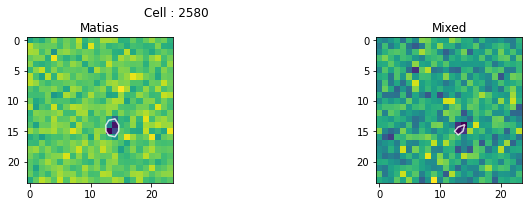

--- Ploting Done ---
matias : [-1.97497981  4.61813268 18.94753745  0.41696333  0.24267366 25.760527  ]
mixed : [ 0.05464209 13.04580646  9.49873252 24.          7.4435318  17.69635674]


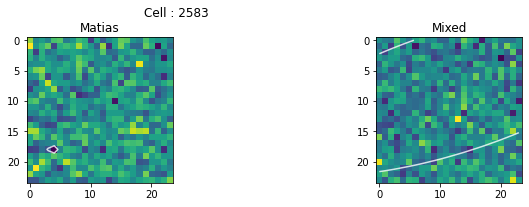

--- Ploting Done ---
matias : [1.19441147e+00 1.39308549e+01 1.53185759e+01 5.65326736e-01
 8.03768647e-01 2.21453993e-16]
mixed : [1.30404785e+00 1.39810111e+01 1.54911985e+01 4.29739502e-01
 6.57900975e-01 2.88238606e-20]


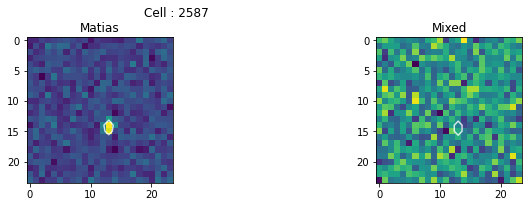

--- Ploting Done ---
matias : [0, 0, 0, 0.001, 0.001, 0]
mixed : [ 1.99999933 15.73052925 12.50539447  0.24225128  0.50444904 39.16210413]


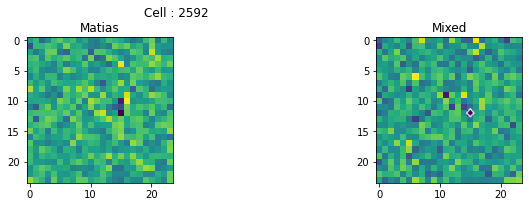

--- Ploting Done ---
matias : [ 1.11532905 15.53835604 13.0511668   0.63905343  1.28854304 30.02441675]
mixed : [ 1.60537784 15.80047049 13.2922158   0.31803876  0.93441033 31.36808038]


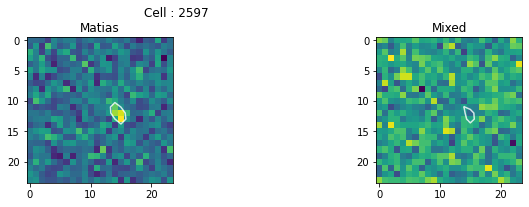

--- Ploting Done ---
matias : [ 1.15312243 15.29689166 12.93366643  0.60734111  0.8296486   0.89693416]
mixed : [1.10246808e+00 1.52236718e+01 1.29663892e+01 5.13289616e-01
 5.39230854e-01 1.15642087e-10]


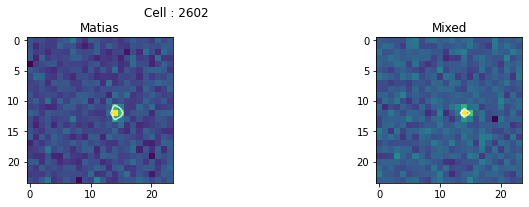

--- Ploting Done ---
matias : [1.27954968e+00 1.25989842e+01 1.13408881e+01 8.40011230e-01
 7.36886395e-01 5.97579907e-26]
mixed : [-1.89624601e-11  1.10000000e+01  1.00000000e+01  1.00045897e-01
  3.88449933e-01  9.77472848e+00]


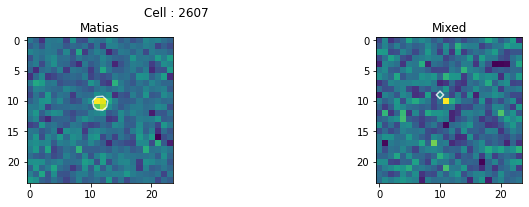

--- Ploting Done ---
matias : [-0.35105072 17.98292311 17.73680901  3.55603945  0.64546849 11.30880425]
mixed : [ 0.05328021 15.1051749  12.01729024 13.06609439  8.48342499 11.3607282 ]


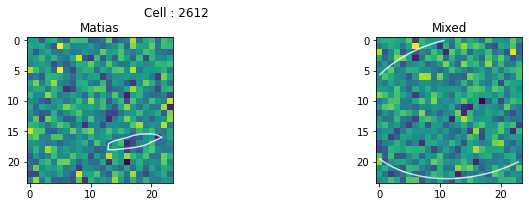

--- Ploting Done ---
matias : [ 1.99999998 15.73333029 13.71274432  0.45713128  0.32608393 26.64543335]
mixed : [ 1.2566893  15.84539568 13.87514299  0.57081987  0.2892205  39.10102238]


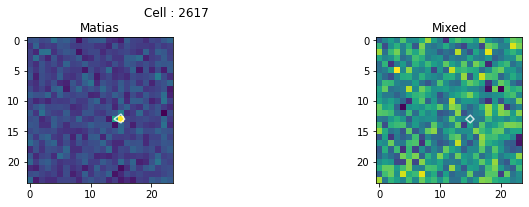

--- Ploting Done ---
matias : [-0.95001474 14.93227976 22.3063753   0.1         9.0020076  18.19049355]
mixed : [-1.31157131e-10  1.30000000e+01  1.40000000e+01  4.56484550e-01
  1.22404635e-01  8.62378702e+00]


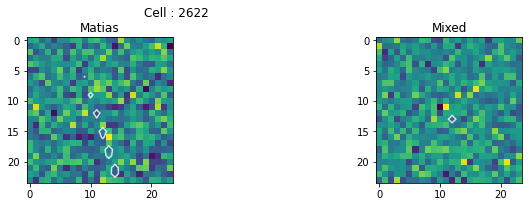

--- Ploting Done ---
matias : [-1.31402507 13.72999027 11.09157658  0.384458    0.53618938  7.51918952]
mixed : [ 1.99961789 14.20046429 11.24702523  0.35907815  0.26735197 51.68573707]


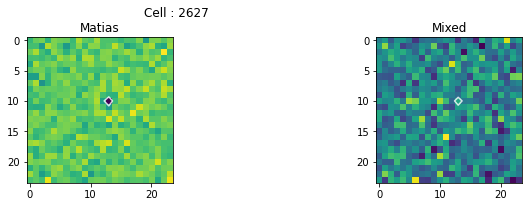

--- Ploting Done ---
matias : [  1.42251564  14.75454551  14.50928435   0.64374571   0.83528702
 111.11957717]
mixed : [ 1.39671781 14.78855037 14.4479271   0.61821934  0.52766141 60.30564372]


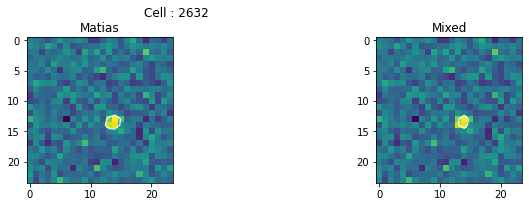

--- Ploting Done ---
matias : [-0.19697045 16.32128959 20.23010789  0.3792755  16.54560472 33.81109789]
mixed : [3.51867988e-10 1.00000000e+00 2.00000000e+01 4.19974207e-01
 1.09309905e-01 1.00000000e-10]


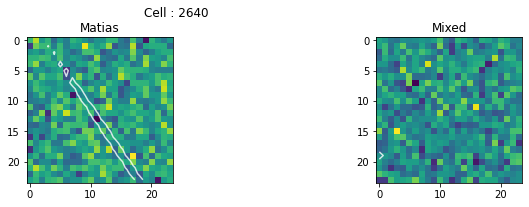

--- Ploting Done ---
matias : [-1.99999995 12.33309568 13.78633361  0.32016912  0.48053924 56.66331335]
mixed : [1.99967430e+00 1.23770725e+01 1.37911742e+01 3.78381175e-01
 3.33350327e-01 2.16541017e-23]


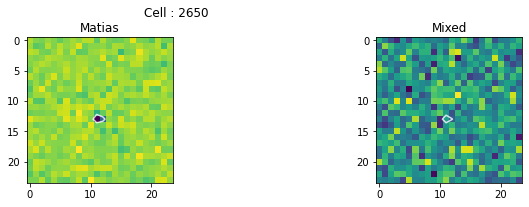

--- Ploting Done ---
matias : [ 1.23191866 13.84839853 13.70183728  0.67223841  0.52355102 30.08546156]
mixed : [ 1.99999974 13.64369273 13.75559159  0.32071256  0.37249233 72.73676603]


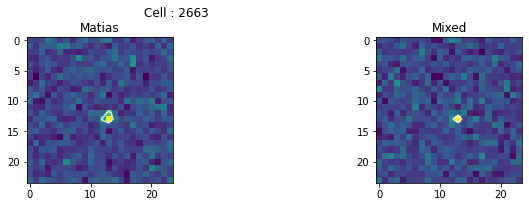

--- Ploting Done ---
matias : [ -1.99996609  13.72488889  13.31542873   0.70932997   0.23075137
 122.5779454 ]
mixed : [2.00000000e+00 1.42921533e+01 1.35877794e+01 6.45647005e-01
 4.24724550e-01 2.90930368e-46]


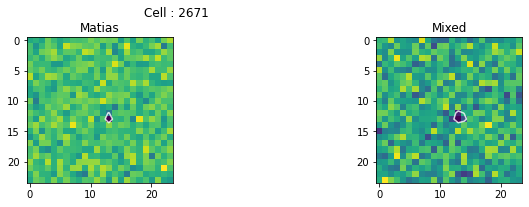

--- Ploting Done ---
matias : [-2.         13.58902828 13.54722654  0.56677457  0.47457163 54.90506505]
mixed : [ 2.         13.64720365 13.54176988  0.55486748  0.37163236 48.8146003 ]


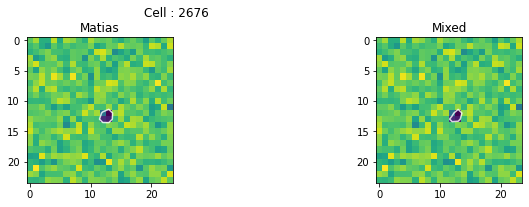

--- Ploting Done ---
matias : [-2.         14.50217871 12.92181133  0.5629987   0.41725703 81.46426873]
mixed : [ 2.         14.42493779 12.83009317  0.34113618  0.52707122 60.15201488]


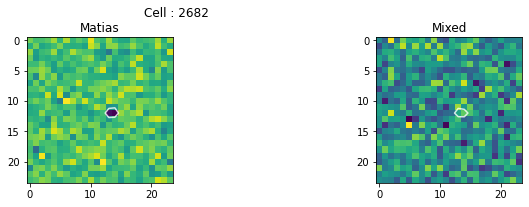

--- Ploting Done ---
matias : [-1.99996783 12.42491156 11.21907317  0.34772516  0.62368619 11.97292266]
mixed : [ 1.99054457 13.24390986 10.47606118  0.51722764  0.27429073 53.4659943 ]


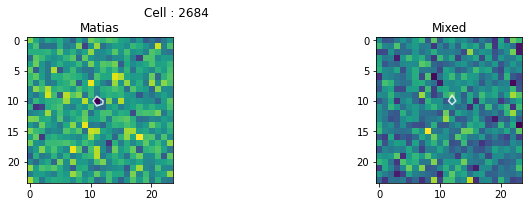

--- Ploting Done ---
matias : [ -1.19543035  15.90788582  11.56666204   0.73670503   0.86885855
 133.1915565 ]
mixed : [ 1.36428298 15.94502356 11.50401594  0.67028763  0.55306974 47.0264095 ]


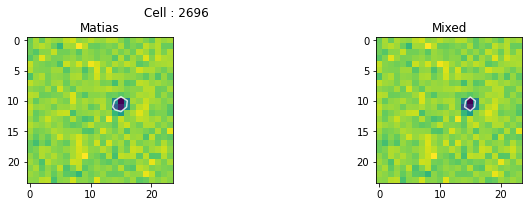

--- Ploting Done ---
matias : [-1.36362993 15.22270241 11.72809878  0.45373197  0.59823514 38.43820577]
mixed : [ 1.9736294  15.33745082 11.85196088  0.31185616  0.49505407 11.32648339]


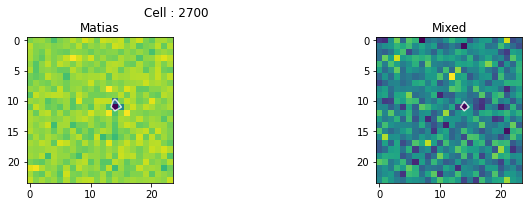

--- Ploting Done ---
matias : [ 1.99941496 12.703929   10.62987366  0.31627754  0.75548346 88.36346092]
mixed : [ 1.50119189 13.00971414 10.74071323  0.28779922  0.43437862 89.45692803]


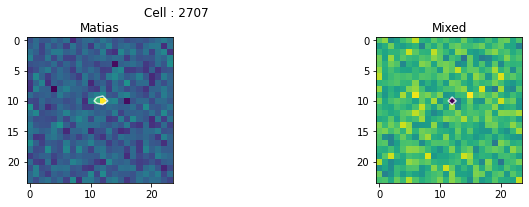

--- Ploting Done ---
matias : [-1.04051395 11.97775935 11.74044652  0.3985237   1.22588005 28.99844897]
mixed : [-1.58882646e-09  1.10000000e+01  1.00000000e+01  4.23066486e-01
  2.01854578e-01  3.00115498e+01]


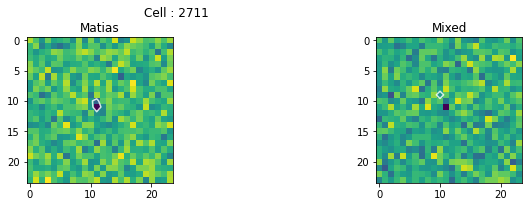

--- Ploting Done ---
matias : [-1.99999999 15.47142628 13.60571265  0.61542196  0.35273633 65.95718164]
mixed : [ 1.31072905 15.37839386 13.65654951  0.71105258  0.36206464 35.79671955]


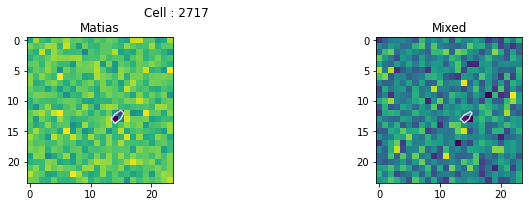

--- Ploting Done ---
matias : [1.34146730e+00 1.67058499e+01 1.22882175e+01 4.29652533e-01
 1.00257524e+00 4.07985536e-17]
mixed : [-1.19934423e-11  1.60000000e+01  1.10000000e+01  1.01618620e-01
  1.00190496e-01  2.79065217e+01]


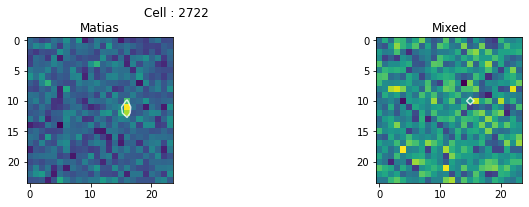

--- Ploting Done ---
matias : [-1.12944948 11.18878388 11.85568971  0.49701502  0.57767722 55.18069397]
mixed : [ 1.18242404 11.2149495  11.89548662  0.41422566  0.39531669 40.82538154]


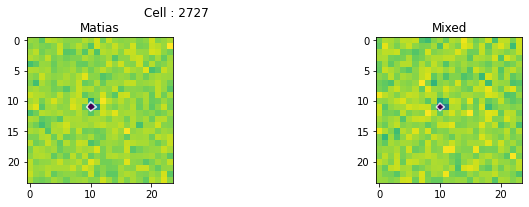

--- Ploting Done ---
matias : [ 1.08021513 10.78120686 11.95796378  0.71938343  0.8472548  31.65399844]
mixed : [ 1.12759938 10.80168993 12.14847277  0.48754679  0.59854347 75.30038435]


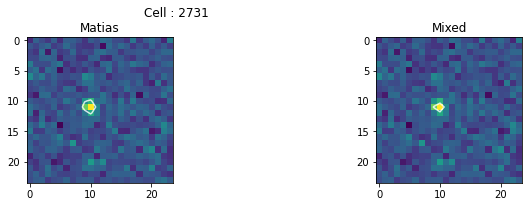

--- Ploting Done ---
matias : [-2.         12.36957    14.57264549  0.47128881  0.49755022 75.06740121]
mixed : [ 2.         12.40878142 14.62621262  0.47042233  0.43815599 35.3571671 ]


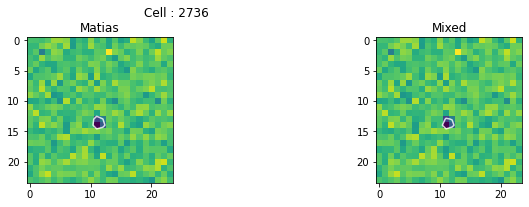

--- Ploting Done ---
matias : [-2.53349216e-11  1.40000000e+01  1.10000000e+01  1.03692305e-01
  1.01280841e-01  2.79745007e+01]
mixed : [1.41698755e+00 1.47648634e+01 1.20514704e+01 2.84690257e-01
 4.17273836e-01 3.31260030e-16]


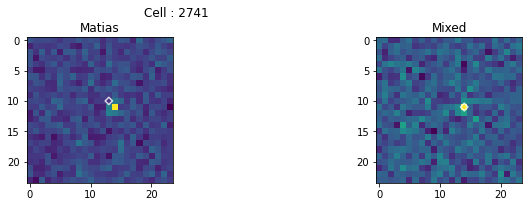

--- Ploting Done ---
matias : [ 1.18422833 14.76114326 12.78406631  0.77879532  0.53305934 40.12904768]
mixed : [ 2.         14.75149111 12.44536449  0.30418265  0.54449974 37.36431831]


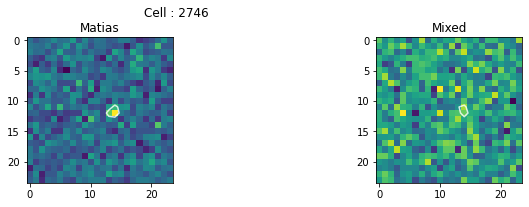

--- Ploting Done ---
matias : [5.27760774e-01 1.00101435e+00 1.89972347e+01 1.00312729e-01
 1.17418624e+00 3.29258730e-04]
mixed : [5.67691639e-02 2.59920528e-09 9.13956158e-11 1.96360929e+01
 2.17353832e+01 6.95777409e-21]


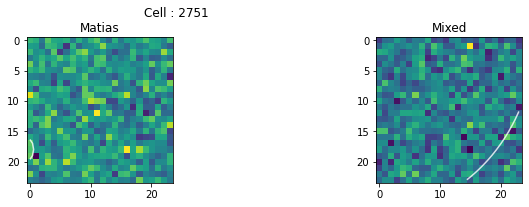

--- Ploting Done ---
matias : [-2.         11.57438191 10.22252144  0.39552679  0.56250197  4.96908856]
mixed : [-5.07551889e-11  1.10000000e+01  9.00000000e+00  5.02585645e-01
  1.03144719e-01  8.93849189e+00]


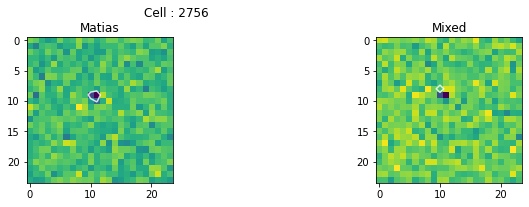

--- Ploting Done ---
matias : [ 1.15834937 14.12314162 13.96748385  0.86260471  1.26668831 50.57079862]
mixed : [ 1.42327688 14.48459385 14.17721608  0.50602658  1.01416008 20.58839225]


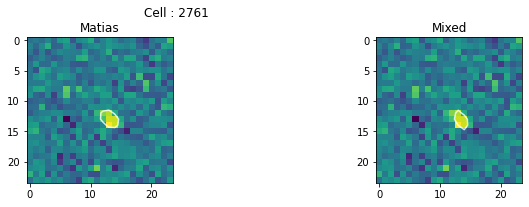

--- Ploting Done ---
matias : [ 1.85618803 17.10029983  7.45980473  0.15568414  1.23961086 52.90654035]
mixed : [ 1.5686318  13.54023193 12.24346975  0.23882265  1.31564074 45.62475563]


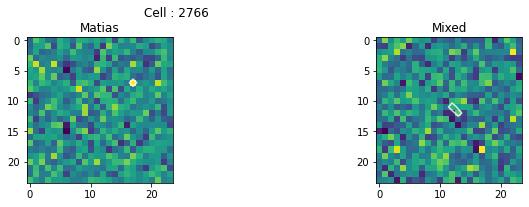

--- Ploting Done ---
matias : [-1.06824927 13.86542761 10.16545697  0.5870494   0.72557525 90.27359785]
mixed : [ 1.07990469 13.85224641 10.13198067  0.4654021   0.5548003  88.06364976]


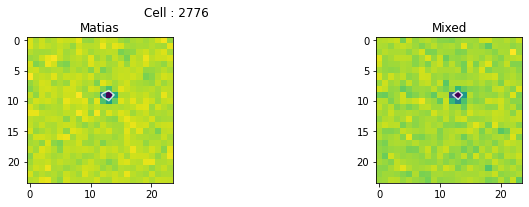

--- Ploting Done ---
matias : [-1.99999945 18.96497777 12.41143229  0.86435667  0.22829575 12.39522564]
mixed : [ 0.16625393 20.39246344 11.44671272  1.83344151  9.23704924 44.41357015]


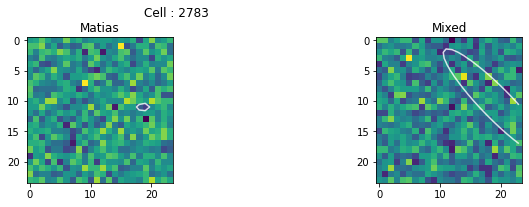

--- Ploting Done ---
matias : [-0.25315533  9.08653212 19.45417226  0.21517045 24.         12.30263525]
mixed : [1.58580534 8.35842537 9.99989452 0.37353148 0.22168211 1.74186685]


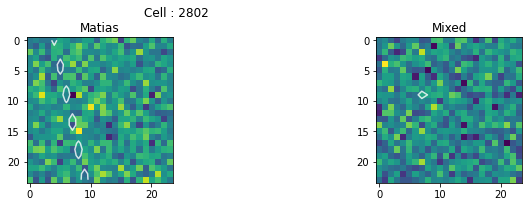

--- Ploting Done ---
matias : [ 1.08611842  9.96553497 20.72808141  4.8736659   0.15502571  9.09991425]
mixed : [ 1.99521507 11.14195502 13.3626013   0.25878359  0.78954373 69.15858836]


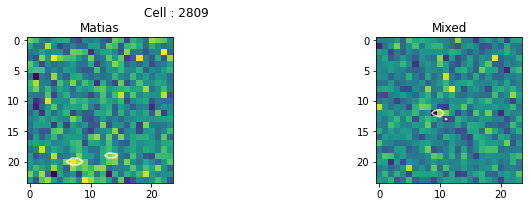

--- Ploting Done ---
matias : [1.18077019e+00 1.42401962e+01 1.48242233e+01 4.95971930e-01
 5.29819772e-01 6.75927521e-08]
mixed : [ 1.99999885 14.05360437 14.69034299  0.24540613  0.45059824 52.24439991]


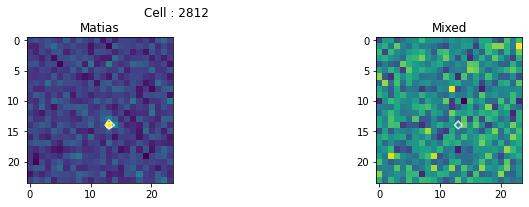

--- Ploting Done ---
matias : [-2.         10.72941988 13.49490233  0.48679178  0.41875107 80.00886838]
mixed : [5.86689907e-11 1.00014705e+01 1.19961896e+01 3.22525702e-01
 1.33329015e-01 3.00340474e+01]


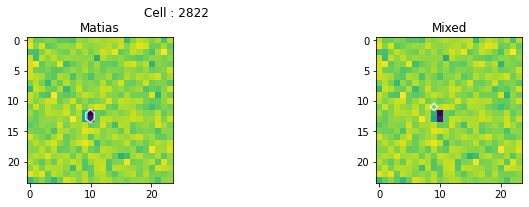

--- Ploting Done ---
matias : [ 0.99918686 12.75753467 11.04296674  0.76685358  1.05061954 33.65481117]
mixed : [ 1.11122953 12.7497916  11.11177342  0.54577263  0.78774741 13.15867419]


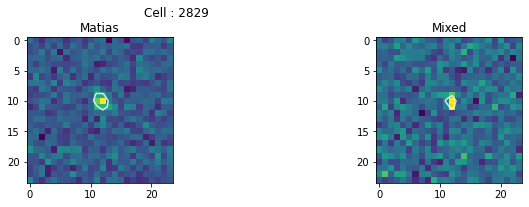

--- Ploting Done ---
matias : [-3.76060468e-01  1.01474952e+01  8.99999993e+00  2.09313219e-01
  1.29453368e-01  2.22708472e-07]
mixed : [-5.73125598e-10  1.10000000e+01  9.00000000e+00  4.67708990e-01
  1.39573091e-01  2.87937890e+01]


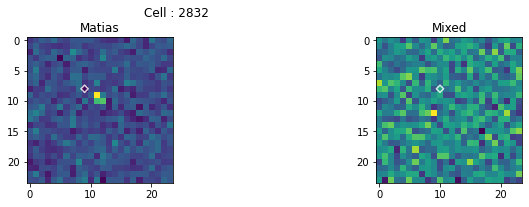

--- Ploting Done ---
matias : [ 1.22073413 13.36784003 12.30518922  0.70528975  0.78748856 72.15364946]
mixed : [-1.32320970e-10  1.20000000e+01  1.10000000e+01  2.54605031e-01
  1.00370477e-01  4.64202495e+00]


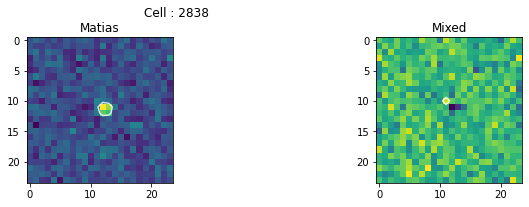

--- Ploting Done ---
matias : [ 1.07156947 13.81987116 11.07738159  0.8050793   0.69517073 39.01182952]
mixed : [ 1.08122355 13.79594553 11.04805507  0.54019986  0.48329035 37.61329361]


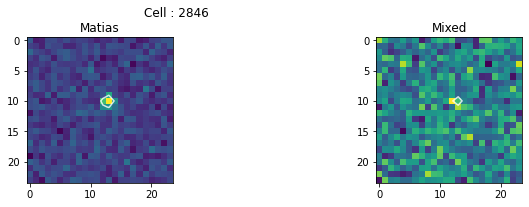

--- Ploting Done ---
matias : [-2.18604470e-01  1.29927841e+01  8.43276810e+00  1.08094540e-01
  1.91231795e+00  5.07714959e-03]
mixed : [ 2.         14.37916826 10.49752584  0.46283707  0.53862722 19.12968307]


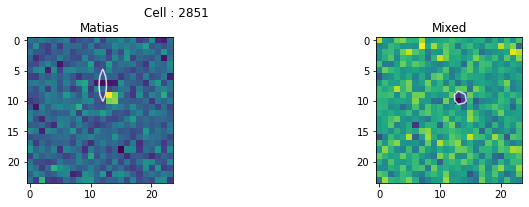

--- Ploting Done ---
matias : [ 2.         14.69202606 12.57240985  0.39347628  0.758396   83.26029731]
mixed : [ 1.99999988 14.65589259 12.63565302  0.34360737  0.4256213  43.03289232]


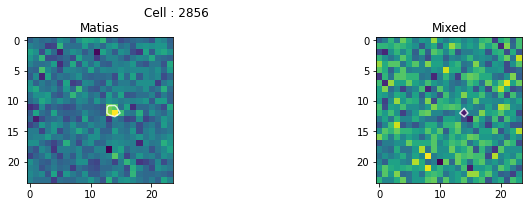

--- Ploting Done ---
matias : [-2.         13.67241458 11.48465489  0.40334246  0.52323441 24.14532518]
mixed : [ 2.         13.78671822 11.55492407  0.32566595  0.41965423 29.08745771]


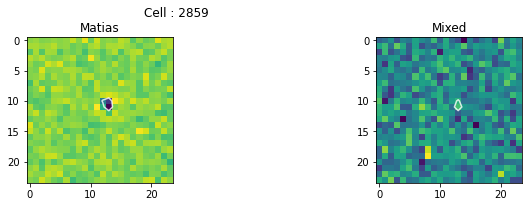

--- Ploting Done ---
matias : [ 1.56218726 13.69216805 11.02742871  0.32731209  0.56990625  0.88561074]
mixed : [ 1.53338578 13.99814103 11.28312979  0.17088021  0.42213006 24.47642879]


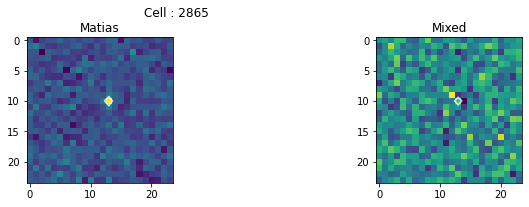

--- Ploting Done ---
matias : [-2.         14.1586818  11.56079539  0.54332214  0.37598105  6.79926393]
mixed : [ 1.85488074 14.00048238 11.61841982  0.19064666  0.3448892   3.63250933]


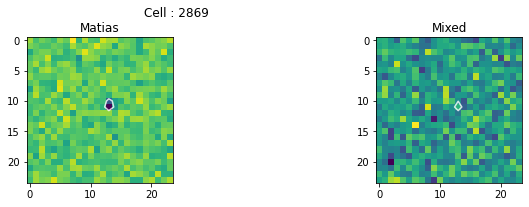

--- Ploting Done ---
matias : [ 1.94426713 11.52546982 10.39299665  0.40661347  0.61938832 73.59387756]
mixed : [ 1.97534434 11.5155207  10.32000969  0.33653233  0.53109504 67.95817288]


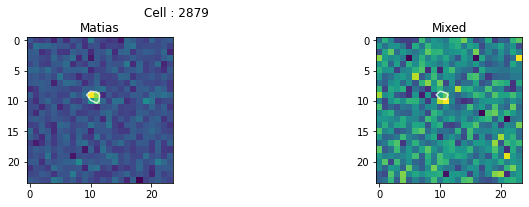

--- Ploting Done ---
matias : [-0.14365665 10.          9.          0.10002346  0.10002883  8.67896466]
mixed : [ 1.06302982 10.95704872 10.14141544  0.40087303  0.54740537 45.18697123]


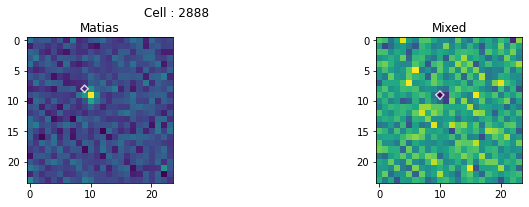

--- Ploting Done ---
matias : [-1.99999999 11.4898619  10.99663374  0.32781396  0.54053886 51.13432029]
mixed : [  2.          11.50305432  11.04847044   0.24178028   0.54485283
 119.16905905]


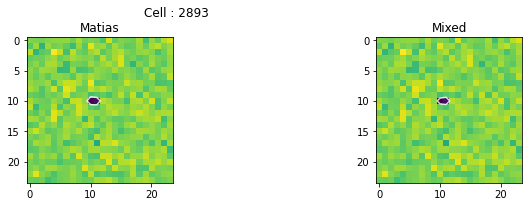

--- Ploting Done ---
matias : [1.02384602e+00 1.49309531e+01 1.08733688e+01 6.09074372e-01
 5.72400193e-01 1.86823853e-14]
mixed : [ 1.00000299 15.00032427 11.00008776  0.10029156  0.45396674 29.15200534]


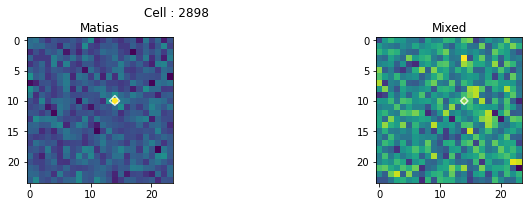

--- Ploting Done ---
matias : [ 1.20049749 14.67926023 11.43003468  0.46526575  1.71646631 50.13308623]
mixed : [ 1.12917317 14.9639256  11.49612229  0.43290821  1.4587051  44.0719812 ]


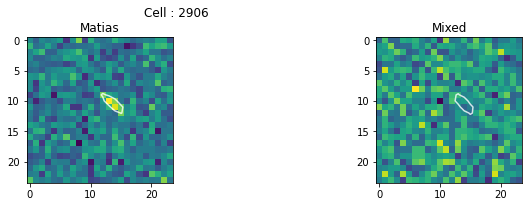

--- Ploting Done ---
matias : [ 0.18815914 13.99974161 12.00036628  0.26504981  0.12308083 17.95555846]
mixed : [ 2.         15.26446619 13.2664515   0.44908521  0.31560804 33.22384533]


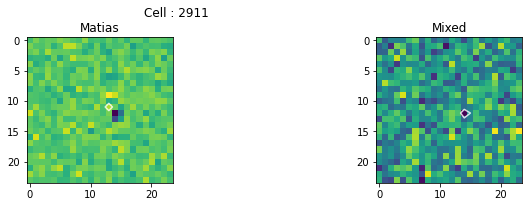

--- Ploting Done ---
matias : [-1.05309349 21.22376338  9.60807374  1.464181    0.26001378 56.62579174]
mixed : [1.98482470e-10 1.80000595e+01 1.60000000e+01 1.24424621e-01
 4.43427154e-01 8.02389481e-07]


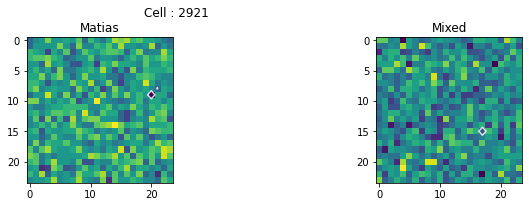

--- Ploting Done ---
matias : [-2.00000000e+00  1.53707979e+01  1.31368331e+01  3.24385180e-01
  5.82345178e-01  1.62848098e-24]
mixed : [1.14010277e+00 1.51364237e+01 1.31604275e+01 3.78914772e-01
 4.40967626e-01 1.94171230e-18]


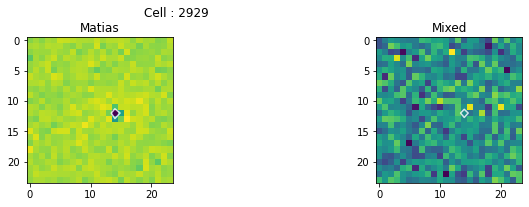

--- Ploting Done ---
matias : [-1.99999999 11.47580584 12.25096352  0.53859223  0.43860801 66.77166621]
mixed : [ 2.         11.42942796 12.22743133  0.53619214  0.31441949 31.74583607]


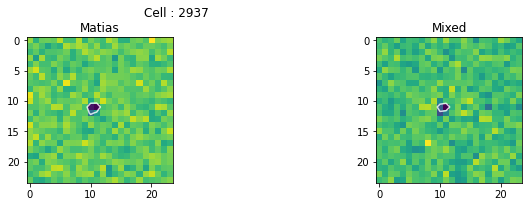

--- Ploting Done ---
matias : [-2.         11.45848222 10.79279303  0.42084223  0.48946293 16.49936735]
mixed : [7.04823664e-09 1.00008160e+01 1.00000000e+01 1.58376478e-01
 4.45609207e-01 3.91027482e-05]


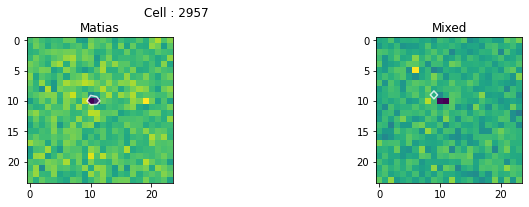

--- Ploting Done ---
matias : [-2.         11.48088953 11.54090265  0.4748689   0.57328989 39.65711689]
mixed : [ 1.90877157 11.50359384 11.5807602   0.41984987  0.57182106 49.00609651]


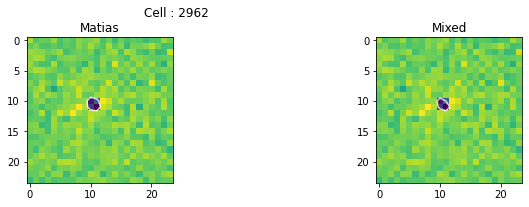

--- Ploting Done ---
matias : [-1.99999813 10.67001683 14.45574633  0.39290081  0.74192234 95.15375523]
mixed : [-1.08262407e-11  1.00000000e+01  1.30000000e+01  4.54128264e-01
  1.02021427e-01  9.07988856e+00]


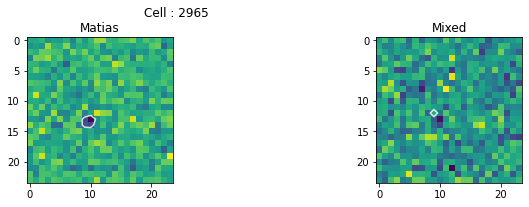

--- Ploting Done ---
matias : [-2.00000000e+00  1.13960653e+01  1.14901136e+01  7.14672190e-01
  4.76619084e-01  3.84985601e-27]
mixed : [ 1.99999046 11.32220073 11.29486536  0.62790484  0.27989345 22.17261575]


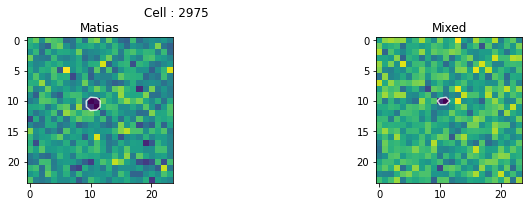

--- Ploting Done ---
matias : [-1.99998228 10.85193125 14.46054069  0.3479237   0.49096992 31.65035768]
mixed : [ 1.99999998 11.07024749 14.54069391  0.41080462  0.39099425 18.58755132]


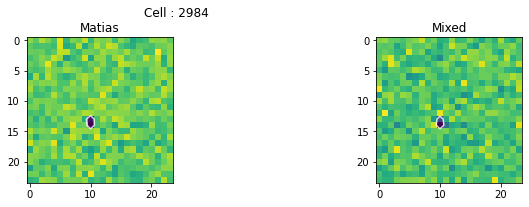

--- Ploting Done ---
matias : [-0.78342436 11.07807728  9.75425544  0.66505635  1.45137206 34.00352248]
mixed : [ 0.50984275 10.58416332  9.55367135  0.41278869  3.6219459  44.12076011]


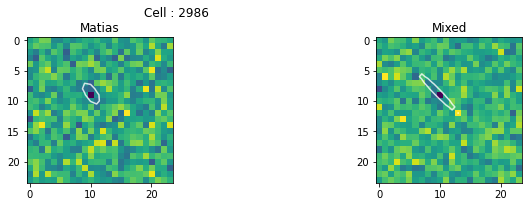

--- Ploting Done ---
matias : [-1.99999991e+00  1.54022604e+01  1.07215877e+01  3.63407282e-01
  6.46898654e-01  7.02786571e-20]
mixed : [ 1.3532441  15.25615174 10.67113702  0.53923361  0.43126533 60.6426053 ]


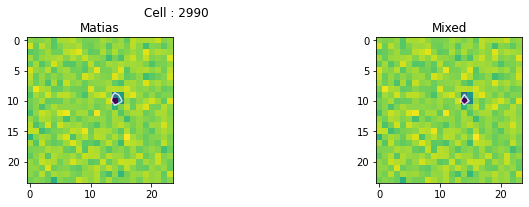

--- Ploting Done ---
matias : [ 0.11196077 13.99999863  8.99999819  0.10018037  0.2854553  15.89933025]
mixed : [ 1.49706385 15.16279304 10.20191264  0.58077137  0.28627901 47.44120823]


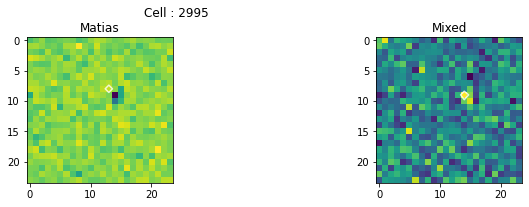

--- Ploting Done ---
matias : [ 1.3148144  15.03039474 14.59436593  0.96691281  0.70934743 14.51171824]
mixed : [ 1.46086556 14.96612387 14.56276135  0.66178758  0.52515296  4.5331848 ]


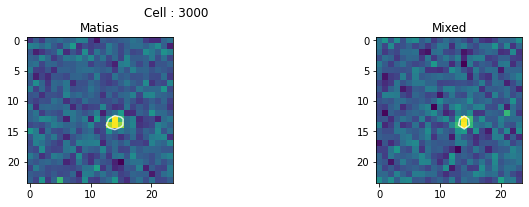

--- Ploting Done ---
matias : [-0.22065395  8.00462102  1.24286445 19.40697965  0.50125999  9.25436179]
mixed : [ 1.57914598 11.42251579  1.41517774  0.16939569  0.65105815 40.53953723]


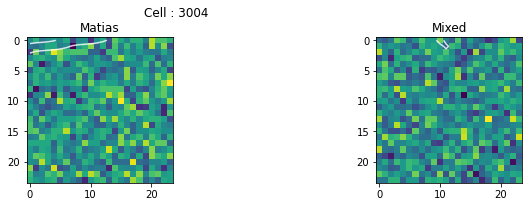

--- Ploting Done ---
matias : [1.99645589e+00 1.46173957e+01 1.28590902e+01 3.28897726e-01
 6.63627806e-01 1.14149091e-46]
mixed : [ 0.04611463  5.77998352  6.59745624 12.28089528 24.         24.47680342]


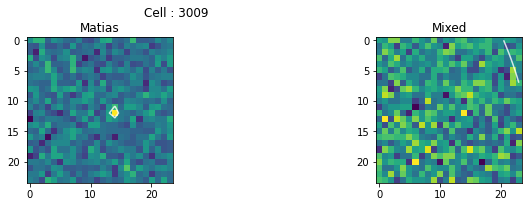

--- Ploting Done ---
matias : [ 0.2456228  14.00012682 10.51788184  0.10000162  0.38841792  1.658333  ]
mixed : [ 1.60371727 15.18942152 12.84237389  0.14894634  0.91068569 14.82280098]


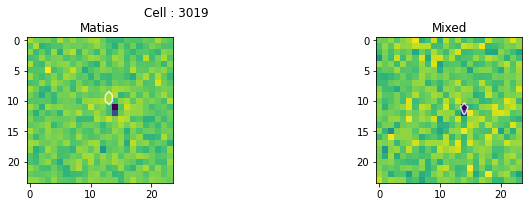

--- Ploting Done ---
matias : [-1.68362711 13.56420128 10.14984873  0.60751457  0.44001564 87.76022759]
mixed : [ 2.         13.62978742 10.23307709  0.35487154  0.55909178 53.82067702]


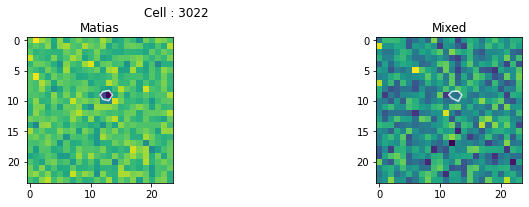

--- Ploting Done ---
matias : [-1.99999976 12.33912298 11.94981426  0.29023174  0.55905876  1.39049505]
mixed : [ 1.00820093 11.95527362 12.00733632  0.1955841   0.46011713 76.50861405]


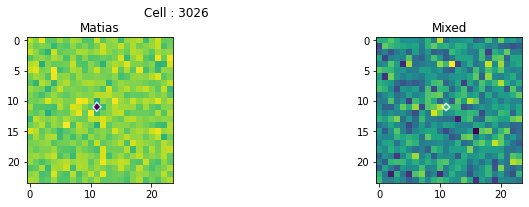

--- Ploting Done ---
matias : [1.56858936e+00 1.33612602e+01 1.27606124e+01 4.18384538e-01
 6.47668974e-01 2.18718581e-24]
mixed : [ 1.99998764 13.24189233 12.76643849  0.28548559  0.39045572 46.19177648]


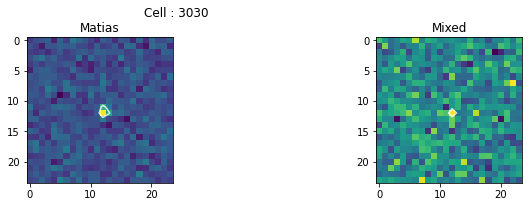

--- Ploting Done ---
matias : [ 1.52257803 13.05604673 13.26114086  0.25498306  0.81768309 69.74112139]
mixed : [ 1.99994407 12.51149296 12.79759004  0.24781043  0.45364045 62.19580729]


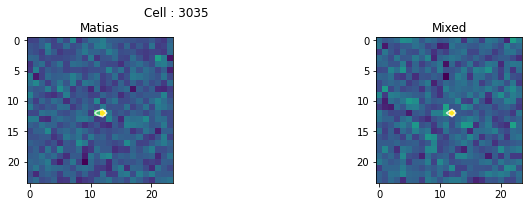

--- Ploting Done ---
matias : [-2.         12.38687778 13.71008777  0.40894769  0.43525311 23.77262604]
mixed : [ 1.99999998 12.28542303 13.79738038  0.28849221  0.40627321 55.44633449]


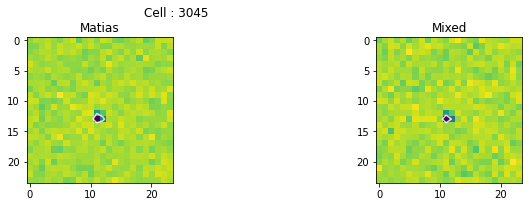

--- Ploting Done ---
matias : [-2.         10.42540851 13.82712418  0.54295719  0.35853363 80.33953576]
mixed : [ 1.86924563 10.3698685  13.98127703  0.32659116  0.44483356 17.02508081]


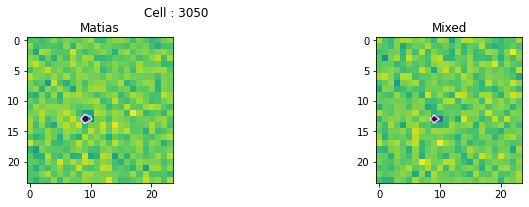

--- Ploting Done ---
matias : [-2.         14.63501686 11.64202302  0.39175079  0.43407984 43.2497659 ]
mixed : [ 2.         14.61974175 11.70723462  0.34500384  0.51842901  7.94701745]


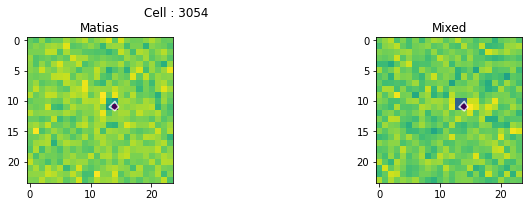

--- Ploting Done ---
matias : [ 1.48390082 14.40160122 11.17677858  0.84435651  0.46076111 42.6685384 ]
mixed : [-3.34850225e-05  1.30006360e+01  1.00007816e+01  1.43195047e-01
  1.94801923e-01  9.43473671e-07]


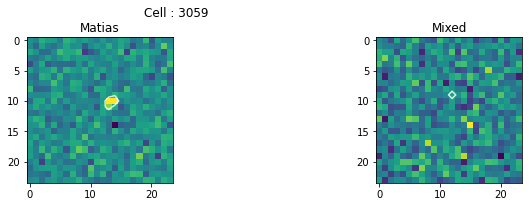

--- Ploting Done ---
matias : [-0.24937766 13.61446117  9.53714026  0.86048655  5.69772287 10.85692458]
mixed : [ 0.75598276 12.59690295 16.67908373  0.39689346  1.73908763  2.76667313]


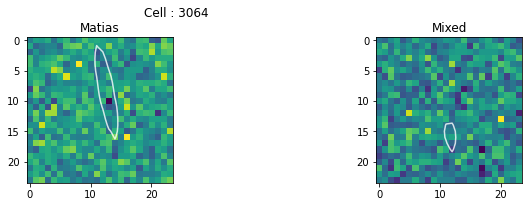

--- Ploting Done ---
matias : [-2.00000000e+00  1.30587430e+01  1.05904895e+01  5.85883521e-01
  3.57198542e-01  2.05999935e-11]
mixed : [ 1.64004893 13.25868455 10.81662023  0.29280882  0.52327417  6.91318059]


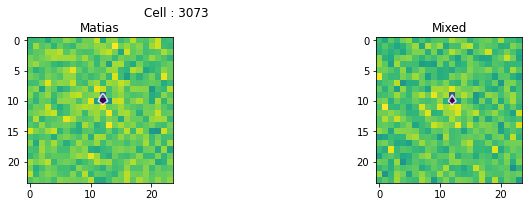

--- Ploting Done ---
matias : [ 1.15434932 12.71792823 10.94841573  0.62869612  0.5449836  19.18908561]
mixed : [ 1.99999998 12.57440896 10.99389099  0.35701277  0.42579714 16.40284457]


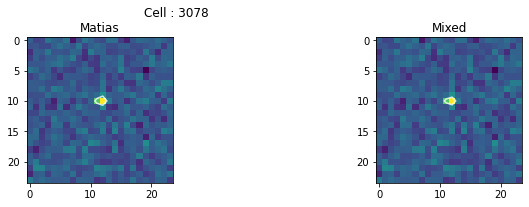

--- Ploting Done ---
matias : [1.04242804e+00 1.38841325e+01 1.27412450e+01 6.36402963e-01
 7.73574862e-01 7.05543076e-10]
mixed : [ 1.51047661 14.01222224 12.62718553  0.41135487  0.43156271 80.12916951]


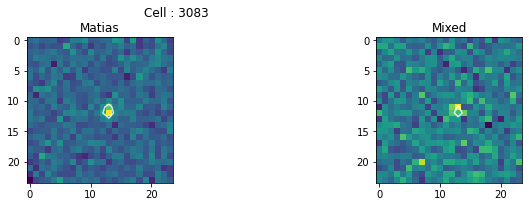

--- Ploting Done ---
matias : [ 1.67925049 13.57115907 11.93200508  0.42503032  0.69119331 10.01204589]
mixed : [ 1.99984022 13.57957081 11.93792078  0.34145537  0.44148211 22.43233231]


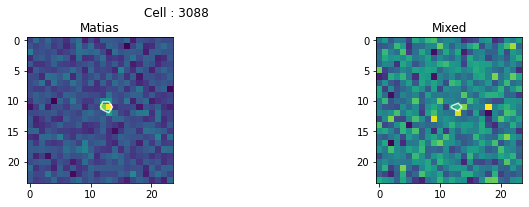

--- Ploting Done ---
matias : [-2.         12.72788519 10.50941848  0.42942636  0.47941998 14.05265053]
mixed : [ 2.         12.84772412 10.48813425  0.3692969   0.45637022 25.50013205]


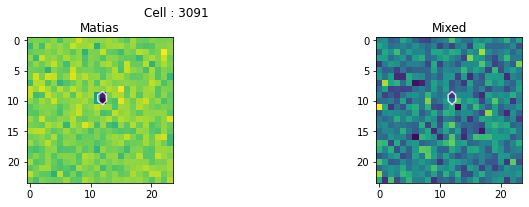

--- Ploting Done ---
matias : [-1.99999987 13.36970515 12.98333686  0.31519477  0.52888615  0.77366352]
mixed : [1.31565702e+00 1.32325991e+01 1.30377206e+01 3.16934787e-01
 3.76391427e-01 2.57032283e-09]


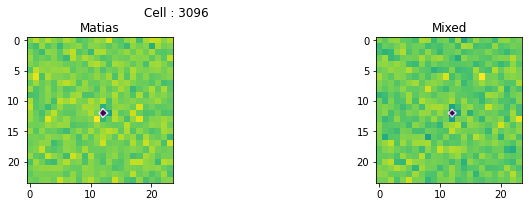

--- Ploting Done ---
matias : [-0.90381291 18.25854051 23.99997375  0.12475826 13.43855752 26.60273814]
mixed : [-9.32112275e-13  1.20000000e+01  1.20000000e+01  1.46738118e-01
  1.01742885e-01  6.78531983e+00]


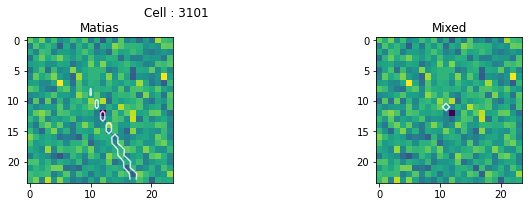

--- Ploting Done ---
matias : [-1.0917997  15.17003843 14.28554993  0.82147097  0.75729532 48.86168506]
mixed : [-1.45124071e-11  1.40000000e+01  1.30000000e+01  2.13311687e-01
  1.02968448e-01  1.00000000e-10]


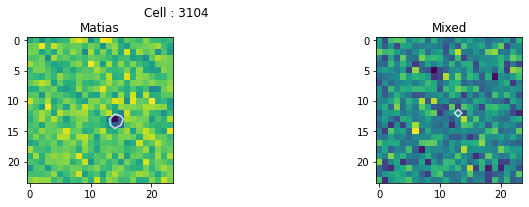

--- Ploting Done ---
matias : [-0.99198239 10.53470004 14.35295914  0.70179033  1.40061163 40.29780418]
mixed : [ 1.22341241 10.2930683  14.27394314  0.37526904  0.73796376 26.34150579]


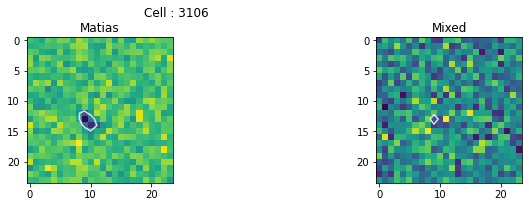

--- Ploting Done ---
matias : [ 1.12963316 14.06086193 12.33225661  0.6173197   0.7876182  41.30732623]
mixed : [ 1.19419238 14.07414635 12.33486394  0.44866235  0.61817113 36.79699062]


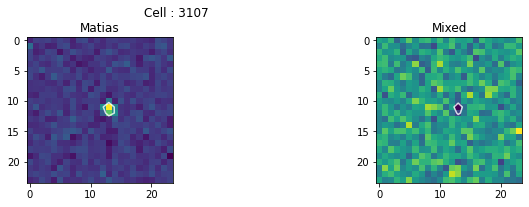

--- Ploting Done ---
matias : [ 1.40143321 10.58230716 10.52557647  0.67490389  0.88948407 57.78646713]
mixed : [ 1.5456315  10.59558223 10.51817868  0.43579189  0.71758017 56.85400072]


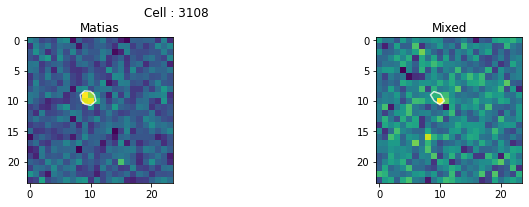

--- Ploting Done ---
matias : [-0.08046794 11.85998007  5.16148335 24.          0.91616663 27.2407067 ]
mixed : [  1.752605    11.52920162  10.3203636    0.25541232   0.64222025
 107.84771283]


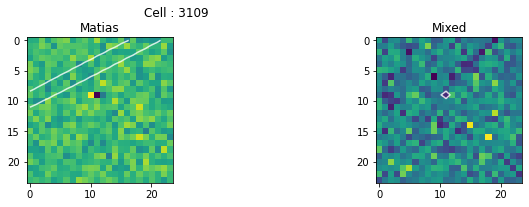

--- Ploting Done ---
matias : [-1.22382252 11.72337641 14.24962186  0.58621189  0.61905248 32.18197787]
mixed : [ 1.91559515 11.60868208 14.31048493  0.43307219  0.44616296 77.27113616]


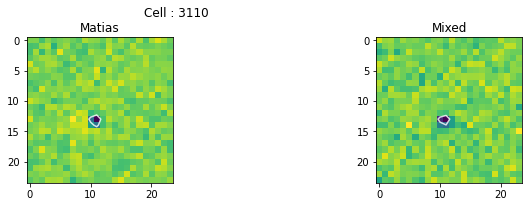

--- Ploting Done ---
matias : [-1.99996114 15.20245078 13.65053727  0.33604073  0.54331423 48.27302384]
mixed : [ 1.99994774 15.25073042 13.76121446  0.29387705  0.40694515 46.61807698]


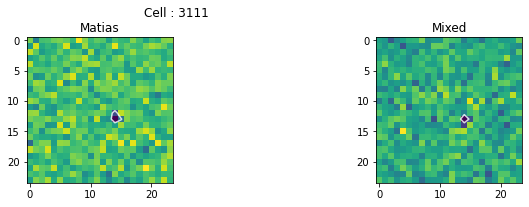

--- Ploting Done ---
matias : [1.23784007e-01 1.40000000e+01 1.20000000e+01 1.06729297e-01
 1.57251241e-01 4.15231520e-06]
mixed : [1.21258691e+00 1.49916973e+01 1.33051651e+01 4.18153129e-01
 4.91722729e-01 6.97650333e-15]


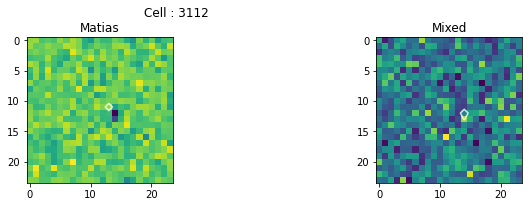

--- Ploting Done ---
matias : [6.40349788e-16 1.30000000e+01 1.10000000e+01 4.66171382e-01
 1.04311332e-01 2.99424604e+01]
mixed : [1.83611354e+00 1.39424327e+01 1.23353219e+01 4.36235874e-01
 3.06470006e-01 1.17913745e-85]


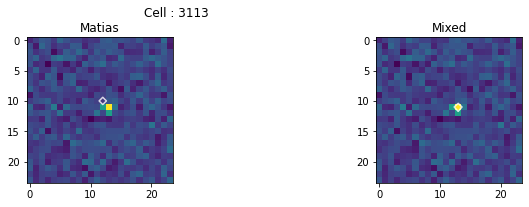

--- Ploting Done ---
matias : [-1.0836848  12.04050714 15.73378004  0.96938347  0.54005224 25.04318216]
mixed : [ 1.99997566 12.33336397 15.59375236  0.60971396  0.347313   10.22397776]


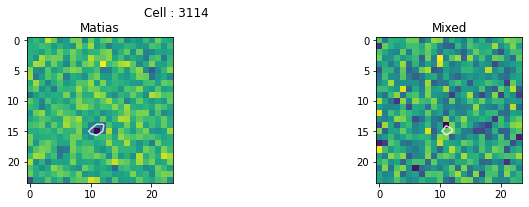

--- Ploting Done ---
matias : [-1.58050168 12.43654361 10.57213835  0.64392147  0.58260766 43.53130839]
mixed : [ 2.         12.3383164  10.57340944  0.53204721  0.41176037  7.74829937]


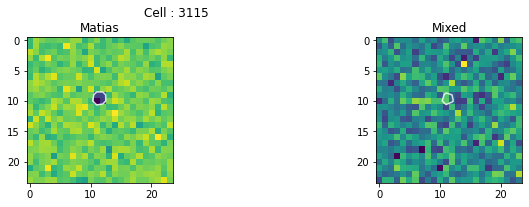

--- Ploting Done ---
matias : [1.00905502e+000 1.35224785e+001 1.53161333e+001 1.13038780e+000
 8.08133761e-001 3.91179835e-105]
mixed : [ 1.60936782 13.68635104 15.5951104   0.40792263  0.52462483 42.17495608]


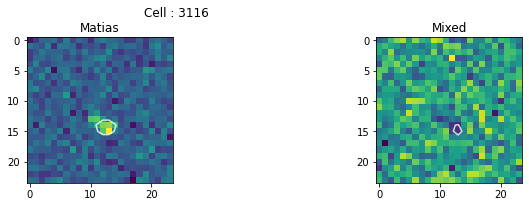

--- Ploting Done ---
matias : [-1.09479852 12.04864767 14.31047776  0.23007033  1.2046992  22.26984849]
mixed : [ 1.35633972 12.22726914 14.23438528  0.23814989  0.57956459 18.49363465]


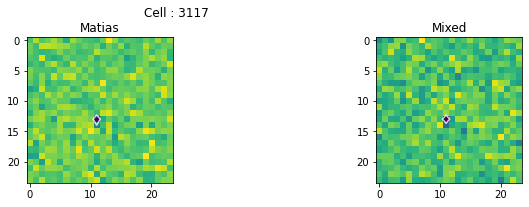

--- Ploting Done ---
matias : [ 1.20646401 14.19200044 10.32810369  0.90157574  0.68167908 25.00359746]
mixed : [ 1.5102815  14.3108038  10.35663693  0.82487391  0.53525103 44.56109161]


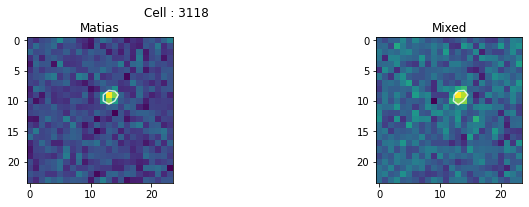

--- Ploting Done ---
matias : [ 0.37663066 10.10560835  9.92714657  4.264238    0.31141808 12.81131579]
mixed : [ 1.4448966  13.50850163 10.44728993  0.61183201  0.80607985 88.52460631]


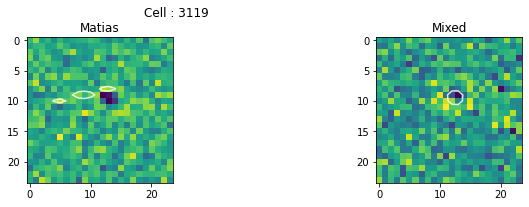

--- Ploting Done ---
matias : [2.08231390e-01 9.00000000e+00 9.99928851e+00 1.09897630e-01
 1.58798519e-01 1.00000038e-10]
mixed : [ 1.59342557 10.43388617 10.9041132   0.76670577  0.37239122 60.43973624]


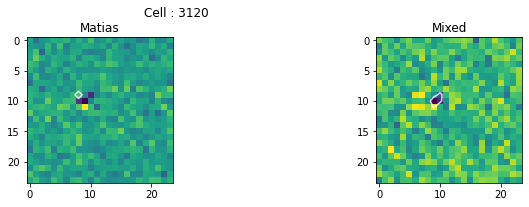

--- Ploting Done ---
matias : [-8.30201535e-12  1.30000000e+01  1.30000000e+01  1.01148247e-01
  1.00080848e-01  2.82368407e+01]
mixed : [1.15599047e+00 1.42050523e+01 1.40971613e+01 4.23769283e-01
 4.10205159e-01 4.43155431e-15]


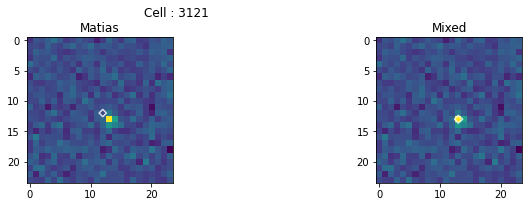

--- Ploting Done ---
matias : [-1.99999984 14.8666351  14.49921819  0.32359793  0.46206579 33.80884135]
mixed : [ 1.99999999 14.85631299 14.48608874  0.26752559  0.46672987 25.55214228]


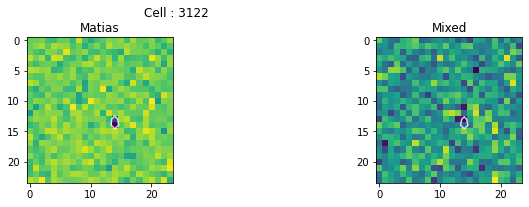

--- Ploting Done ---
matias : [-1.99999999 15.28174238 14.6115532   0.40348642  0.46327117 38.3376243 ]
mixed : [ 2.         15.24821497 14.5863313   0.38242724  0.45297122 17.13706476]


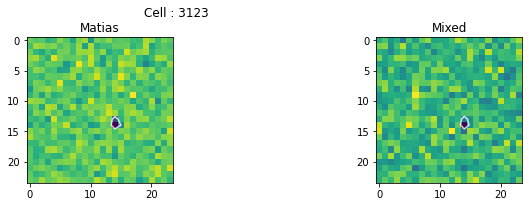

--- Ploting Done ---
matias : [-0.32514949 13.15106383 14.95682309  0.68148404  3.64426013 34.42554623]
mixed : [ 0.09913659 11.00000034 11.99999973  0.31751644  0.10528076 18.44299013]


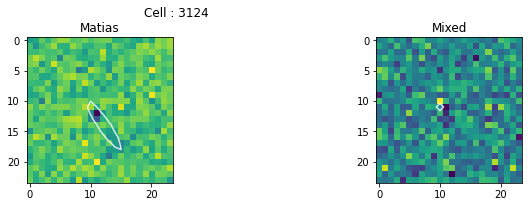

--- Ploting Done ---
matias : [ 2.         15.3125441  13.51344547  0.67384499  0.39701636 15.00404034]
mixed : [-4.02310435e-14  1.40000003e+01  1.20000014e+01  2.29118544e-01
  1.04195068e-01  1.22894475e+01]


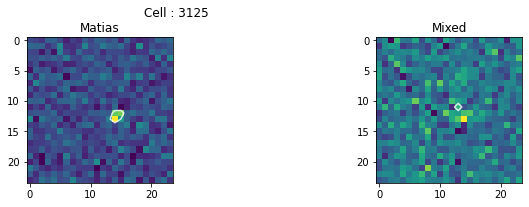

--- Ploting Done ---
matias : [1.24945082e+00 1.23054348e+01 1.19131667e+01 4.82965947e-01
 5.83751281e-01 2.22656887e-09]
mixed : [ 1.11298871 12.14808892 11.8784775   0.41471115  0.46399171 37.80078313]


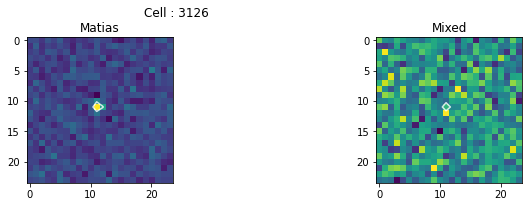

--- Ploting Done ---
matias : [ 1.19268674 13.82700164 12.07189784  0.88234455  0.90804815 37.48919838]
mixed : [1.16531969e+00 1.39293073e+01 1.18353354e+01 8.81830627e-01
 6.83783888e-01 7.75401335e-46]


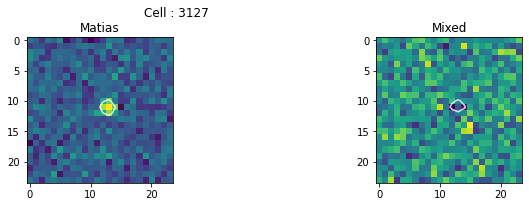

--- Ploting Done ---
matias : [ 1.38772551 14.39656762 13.91437571  0.64889709  0.51025908 76.4617683 ]
mixed : [ 1.32234036 14.34198469 13.95027346  0.47600279  0.43883451 42.38441168]


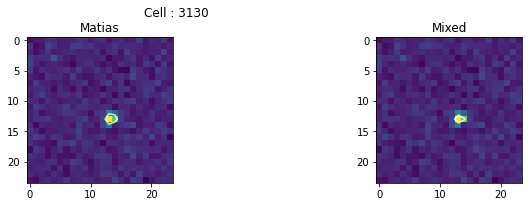

--- Ploting Done ---
matias : [2.71098328e-10 1.00000000e+01 9.00000000e+00 1.04001729e-01
 4.78870113e-01 1.00000000e-10]
mixed : [ 1.73268252 11.54552658 10.09182391  0.39372092  0.60362891 47.85365535]


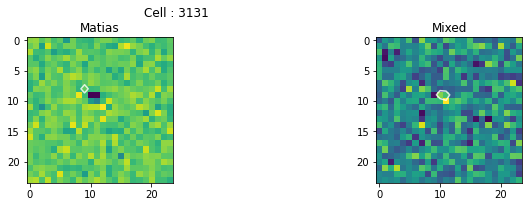

--- Ploting Done ---


In [25]:
"""
    Variable
    
    You will find here all variables used in this notebook cell. They should always refere to your 'params.py' file
    except if you want to manually change some variable only for this run (i.e. debugging). You may have to add those
    variable into the function you want to adapt as only the minimal amount of var are currently given to functions as inputs.
"""

output_directory = params.output_directory

"""
    Input
"""
# path = 'E:\Exp_17_for benchmark\RF_m1'


fitted_file = os.path.normpath(os.path.join(output_directory,'sta_data_3D_fitted.pkl'))

"""
    Processing
"""

sta_data = load_obj(fitted_file)

for cell_id in sta_data.keys():
    fig = plt.figure(figsize=(12,3))
    plt.subplots_adjust()
    fig.suptitle(f'Cell : {cell_id}')
    gs = GridSpec(1, 4, figure=fig)
    
#     png_image = np.array(Image.open(os.path.normpath(os.path.join(path,r'exp17_m1_clus{}_RF_STA_check.png'.format(cell_id)))))[74:472,132:530].transpose(1,0,2)
    matias  = sta_data[cell_id]["center_analyse"]  
#     gabriel = sta_data[cell_id]["surround_analyse"]
    mixed   = sta_data[cell_id]["analyse_sta"]
    
    try:
#         ax1 = fig.add_subplot(gs[0,0])
#         ax1.imshow(png_image)
#         ax1.set_title('Matlab')
        
        ax2 = fig.add_subplot(gs[0,1])
        ax2 = plot_sta(ax2, matias['Spatial'],matias['EllipseCoor'])       
        ax2.set_title('Matias')

#         ax3 = fig.add_subplot(gs[0,2])
#         ax3 = plot_sta(ax3, matias['Spatial'],gabriel['EllipseCoor'])    
#         ax3.set_title('Gabriel')
        
        ax4 = fig.add_subplot(gs[0,3])
        ax4 = plot_sta(ax4, mixed['Spatial'],mixed['EllipseCoor'])    
        ax4.set_title('Mixed')
        
        
    except:
        print(f'No print for cell {cell_id}')
        pass
    m=matias['EllipseCoor']
#     g=gabriel['EllipseCoor']
    mixed = mixed['EllipseCoor']
    print(f'matias : {m}')
#     print(f'gabriel : {g}')
    print(f'mixed : {mixed}')
    plt.show(block=False)

    print('--- Ploting Done ---')

matias : [-1.10858885 27.95582116 33.54954519  0.53655118  1.05286929 14.83589782]
gabriel : [ 1.40164211 27.93688274 33.50907674  0.41727983  0.60653984  4.27394521]
mixed : [ 1.40162724 27.93679616 33.50910031  0.60655493  0.41727536 94.29444344]


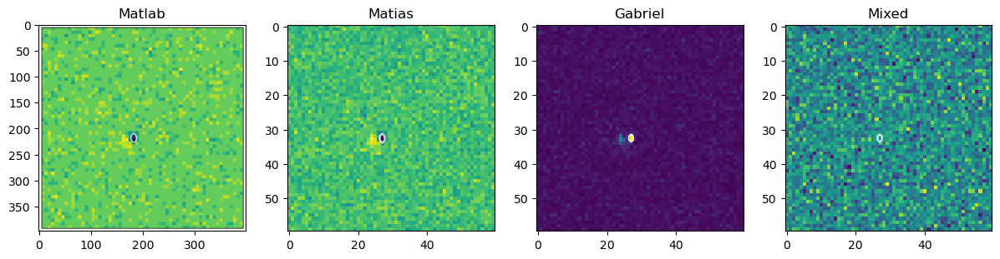

In [77]:
cell_id = 30

png_image = np.asarray(Image.open(os.path.normpath(os.path.join(path,r'exp17_m1_clus{}_RF_STA_check.png'.format(cell_id)))))[74:472,132:530].transpose(1,0,2)
matias  = sta_data[cell_id]["center_analyse"]  
gabriel = sta_data[cell_id]["surround_analyse"]
mixed   = sta_data[cell_id]["analyse_sta"]

fig = plt.figure(constrained_layout=True, figsize=(12,3))
gs = GridSpec(1, 4, figure=fig, wspace = 0)

ax1 = fig.add_subplot(gs[0,0])
ax1.imshow(png_image)
ax1.set_title('Matlab')

ax2 = fig.add_subplot(gs[0,1])
ax2 = plot_sta(ax2, matias['Spatial'],matias['EllipseCoor'])       
ax2.set_title('Matias')

ax3 = fig.add_subplot(gs[0,2])
ax3 = plot_sta(ax3, gabriel['Spatial'],gabriel['EllipseCoor'])    
ax3.set_title('Gabriel')

ax4 = fig.add_subplot(gs[0,3])
ax4 = plot_sta(ax4, mixed['Spatial'],mixed['EllipseCoor'])    
ax4.set_title('Mixed')

m=matias['EllipseCoor']
g=gabriel['EllipseCoor']
mixed = mixed['EllipseCoor']

print(f'matias : {m}')
print(f'gabriel : {g}')
print(f'mixed : {mixed}')

plt.show(block=False)

### Cell 8 : Compare fit - Temporal STA

matias : [2.38059677e-01 3.00000000e+00 1.00000000e-10 4.38578878e+00
 1.10921864e-01 1.00000000e-10]
mixed : [3.30937181e-02 1.86020589e+01 1.34396805e+01 1.74157576e+01
 1.12487121e+01 6.21150606e+01]


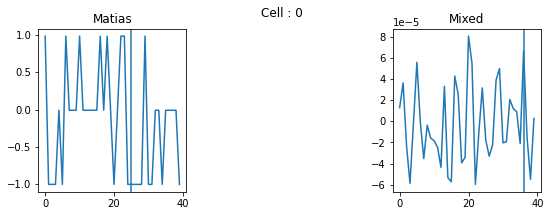

matias : [-1.96324479e+00  1.99960823e+00  8.29637641e-01  2.48211156e-01
  1.46668297e-01  9.75645834e-11]
mixed : [ 1.00041568 20.99993915  4.00651679  0.21728145  0.22091073 47.95042326]


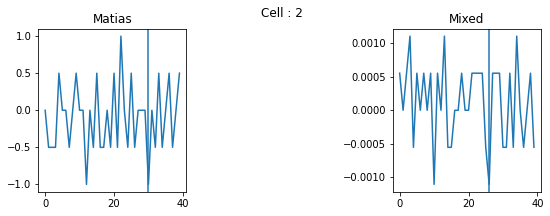

matias : [ 0.90397439 21.25642045 15.70232638  1.62183185  0.82107629 33.32556319]
mixed : [  0.97745286  21.04588237  15.90646138   0.59524122   0.80303645
 116.99671558]


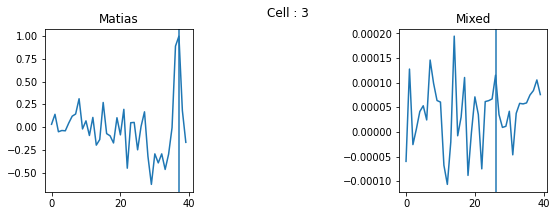

matias : [0, 0, 0, 0.001, 0.001, 0]
mixed : [0, 0, 0, 0.001, 0.001, 0]


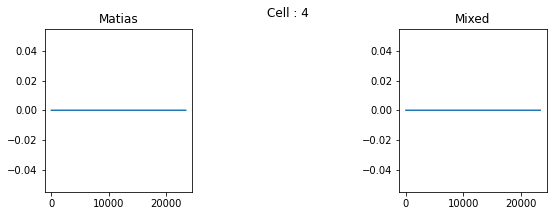

matias : [ -1.08219911  18.62989893  11.69359417   1.14929911   1.2812844
 122.56158101]
mixed : [ 1.1798499  18.79535277 11.62862609  1.08745853  0.90465428  7.3657859 ]


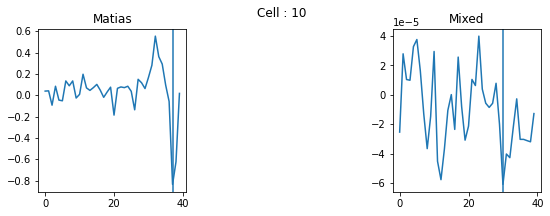

matias : [ 0.32530606 27.00979183  7.65859149  0.11077281  2.20284001  0.19722158]
mixed : [ 1.61617251 19.61687036 19.00178158  0.23205829  0.39239523 86.60249741]


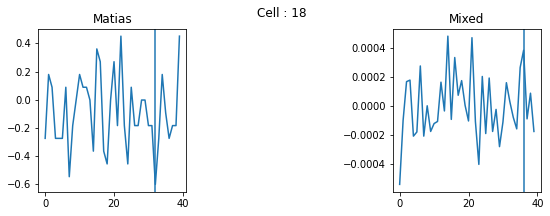

matias : [-0.73946969 14.42786334 15.5532359   2.84778867  0.81173052  9.63186633]
mixed : [ 1.00000137 17.00030256 25.99995404  0.16317331  0.32674686 38.01263659]


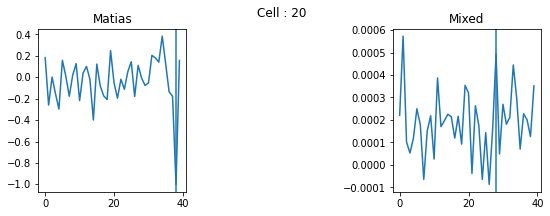

matias : [ 1.04123446 15.33142727 13.45979389  1.19519746  1.51647394 53.99609261]
mixed : [ 1.10216622 15.34358924 13.40908314  0.8845624   1.06103872 49.36691337]


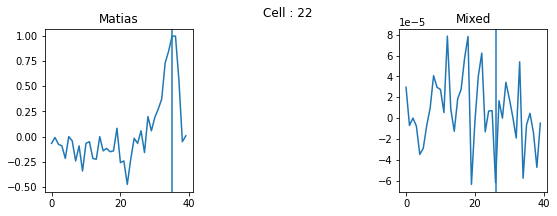

matias : [1.02097598e+00 1.24665838e+01 1.05532556e+01 1.92070686e+00
 1.46441028e+00 2.78787643e-63]
mixed : [9.27503499e-01 1.25384569e+01 1.05480381e+01 1.43100672e+00
 1.21057827e+00 1.63383128e-67]


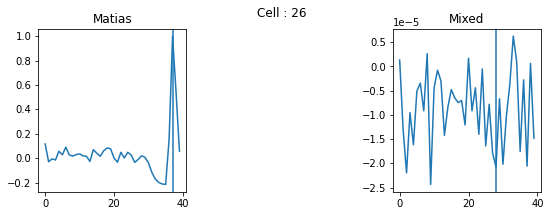

matias : [0, 0, 0, 0.001, 0.001, 0]
mixed : [0, 0, 0, 0.001, 0.001, 0]


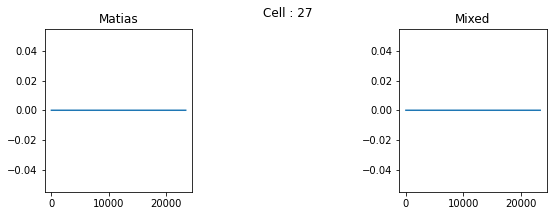

matias : [ 1.00497414 14.88653312 11.6839725   1.31047278  1.83076473 63.966232  ]
mixed : [ 1.10951944 14.93689575 11.28941673  0.67013934  1.0786721  68.44117395]


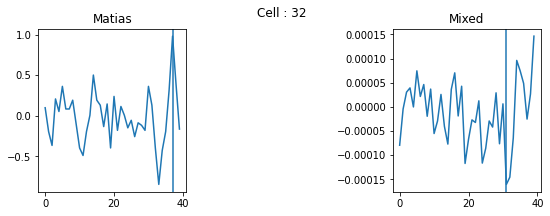

matias : [-1.12164072 21.30339565 13.20577163  1.01067918  0.773219   26.86941262]
mixed : [ 1.27890179 21.28441452 13.27698103  0.72835237  0.55933341 26.04339429]


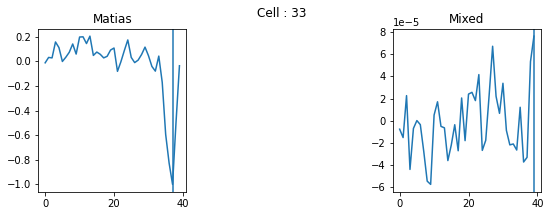

matias : [-0.94905703 20.40763055 12.06531807  1.02855676  1.70469127 46.89219129]
mixed : [ 0.99039473 20.2348287  12.15030719  0.45311879  1.19207202 56.79162841]


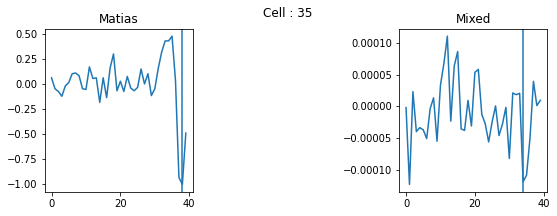

matias : [ 0.660883   19.43225421 11.38551088  1.9875691   2.62621322 14.02950279]
mixed : [ 1.02200869 19.60117138 12.15064253  0.56158247  2.40297535 10.03061319]


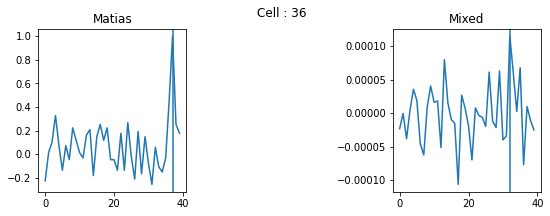

matias : [ 0.35727854 13.49336204 11.47711468  1.99929758  3.03268192  9.15803858]
mixed : [5.59134326e-02 4.70671808e-03 2.81421130e+01 3.00000000e+01
 1.18633222e+01 3.86553892e+01]


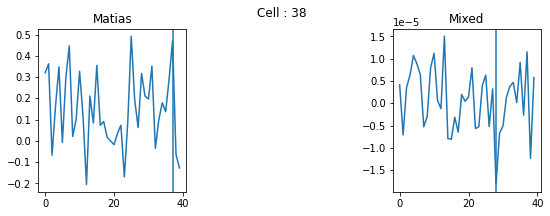

matias : [ 0.40428245 21.1240671  14.64847066  1.9521042   4.38052097 18.13976024]
mixed : [ 0.26630609 20.39438845 14.10234962  1.34484229  4.60793686 26.33132935]


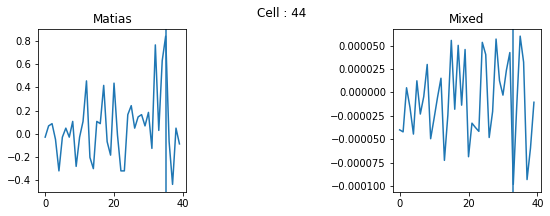

matias : [ -1.12837074  13.74973185   9.39607946   0.82592599   1.21745364
 102.55361728]
mixed : [ 1.20868694 13.69980741  9.37006502  0.92518427  0.59200318 19.0976723 ]


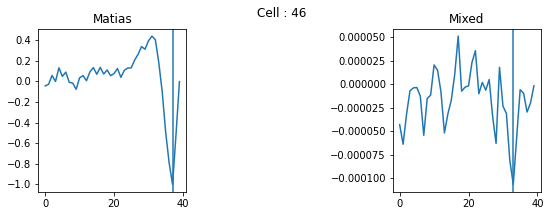

matias : [ 1.01758361 14.47354185 10.2260551   1.16915028  1.20873395 22.50038158]
mixed : [  0.88059263  14.12915415  10.30839336   0.74969063   1.27529075
 158.67395433]


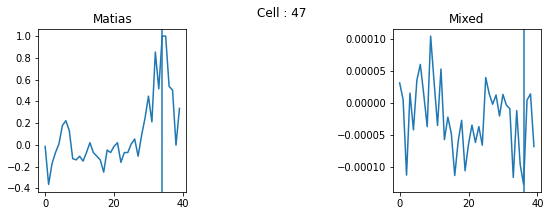

matias : [8.23890306e-01 1.20018614e+01 5.56131035e+00 2.09650587e+00
 1.65262692e+00 3.32438976e-38]
mixed : [7.91230853e-001 1.11523845e+001 4.85352151e+000 1.24231028e+000
 9.21747555e-001 1.50221958e-183]


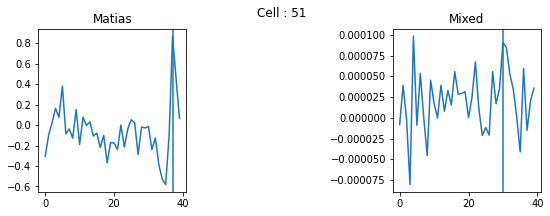

matias : [0, 0, 0, 0.001, 0.001, 0]
mixed : [0, 0, 0, 0.001, 0.001, 0]


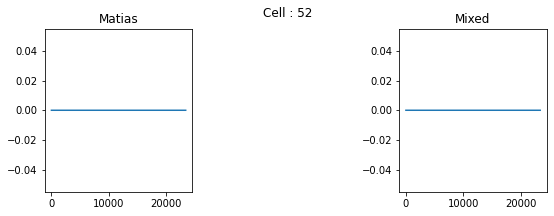

matias : [-6.53103517e-01  1.33490815e+01  5.00230408e+00  3.87982549e-01
  1.08318186e-01  1.22392457e-08]
mixed : [ 0.76018201 12.59458421 16.84887813  1.68958486  0.94415035 15.22419023]


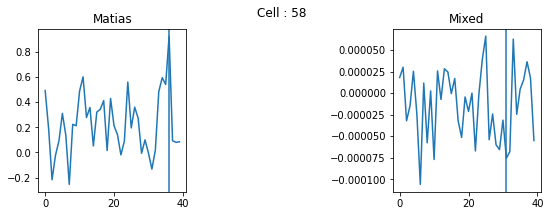

matias : [9.33900968e-01 1.24194624e+01 1.64582337e+01 1.52329078e+00
 1.82221564e+00 2.33578350e-13]
mixed : [ 0.92802951 12.37662731 16.30073404  1.46599254  1.25428229 78.80502083]


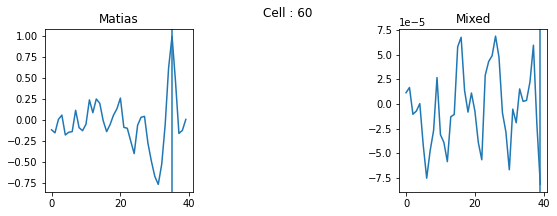

matias : [-1.04312615 15.12845112 11.3155575   1.02819759  1.48372927 88.50636334]
mixed : [ 1.12564687 15.12805909 11.25114378  1.2389963   0.72370224  0.33598897]


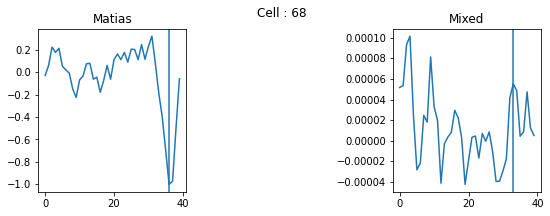

matias : [ 1.08953288 11.68406574 11.84138348  1.08091811  1.50290272 30.76927923]
mixed : [ 1.35759314 11.48951371 11.5701952   0.76820818  0.67357701 51.20130965]


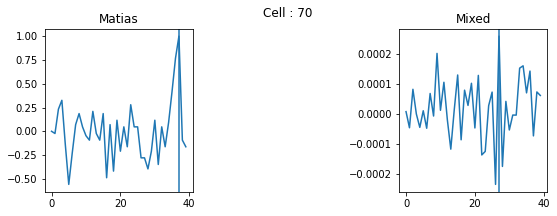

matias : [ 0.45086022 15.97956972  9.50028454  3.69099969  2.46002483 48.86412072]
mixed : [3.50133521e-01 1.53830496e+01 9.02410450e+00 2.77546348e+00
 2.30987423e+00 3.24545712e-43]


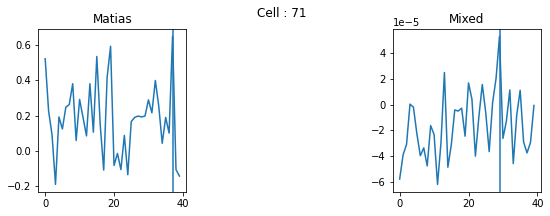

matias : [-1.01782342e+00  1.83782967e+01  1.16571848e+01  1.16615206e+00
  9.59019425e-01  1.37244698e-51]
mixed : [ 1.04312091 18.32248499 11.77130368  0.85739033  0.78865652 17.32642558]


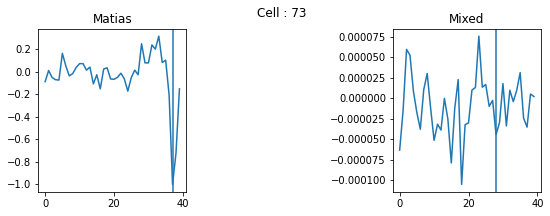

matias : [-1.02237209 18.475642   11.46206631  1.30156613  1.1167964   4.93126405]
mixed : [1.29710696e+00 1.86696114e+01 1.15460843e+01 1.18947975e+00
 8.20242251e-01 1.38476513e-53]


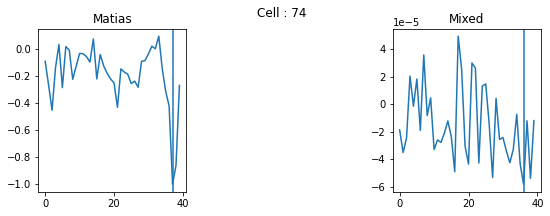

matias : [ 0.87482845 19.47708385  8.79201338  1.2900958   1.83539001 79.2881418 ]
mixed : [ 1.55727218 21.64123757 21.99776459  0.24971635  0.38105975 90.10595279]


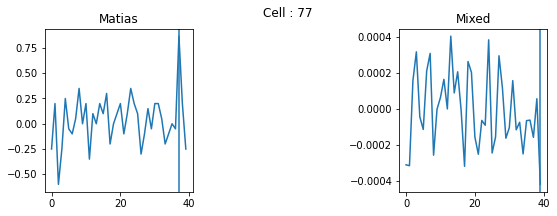

matias : [ 1.0448734  19.20832577  8.82004596  1.69013388  1.06009451  2.98723065]
mixed : [1.14778303e+00 1.93489103e+01 8.80682411e+00 9.92561319e-01
 9.14786193e-01 5.41455693e-26]


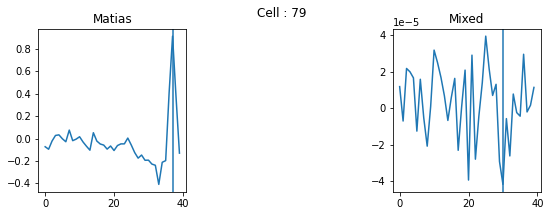

matias : [9.60326913e-01 4.74679766e-06 4.01076420e+00 1.00000000e-01
 1.15264729e+01 3.84946418e+01]
mixed : [4.47737645e-01 1.40938000e+01 1.10203341e+01 2.07073791e+00
 9.52343761e-01 2.52287614e-88]


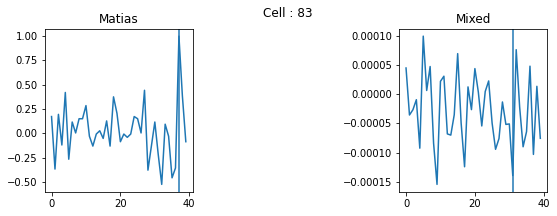

matias : [ 1.01063816 17.46521493  8.31777452  1.19046294  1.67323646 95.2804668 ]
mixed : [ 0.98039796 17.22146351  8.37475312  0.86199654  1.27621156 87.02560025]


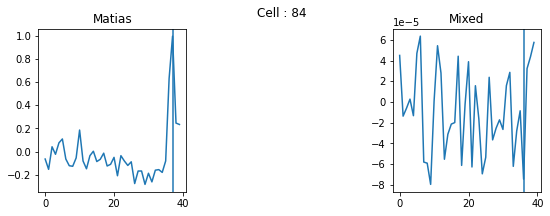

matias : [-1.02966563 21.65187129 11.93255298  1.11473455  1.35069267 93.4808432 ]
mixed : [ 1.16401293 21.60903542 11.78532679  0.83778268  1.00269196 90.21298237]


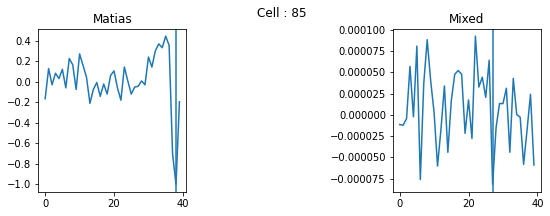

matias : [-0.8576686  21.18002167 11.87389016  0.87126995  1.50519111 33.07634001]
mixed : [ 1.99999972 22.14392209 12.5488283   0.12872458  1.51617577 32.33511445]


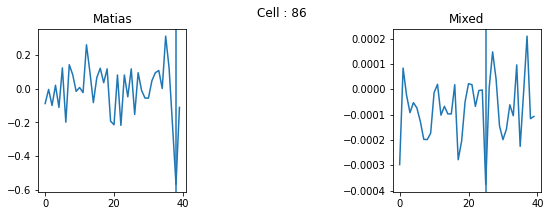

matias : [ 0.86590722 16.74804111  9.24780005  1.79020408  2.6122193  45.32766584]
mixed : [6.29212722e-01 1.70789410e+01 9.29033199e+00 1.86717862e+00
 1.79330948e+00 1.90933573e-71]


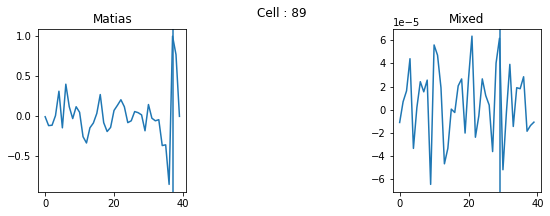

matias : [ 0.90514092 16.76335053 15.17911761  2.09385784  1.61934774 75.83385548]
mixed : [9.22421270e-01 1.68044070e+01 1.56485048e+01 1.22896348e+00
 1.72476497e+00 2.79787463e-77]


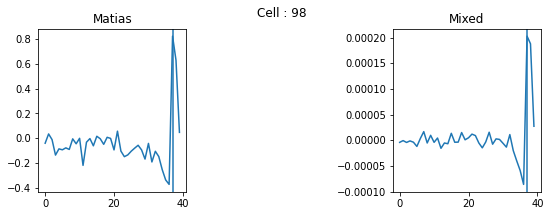

matias : [ 1.07262339 17.13812689 15.8016521   1.89895632  1.27214465 21.42150941]
mixed : [ 0.96542831 17.09508806 15.85116809  1.36788224  1.01170141 30.45681122]


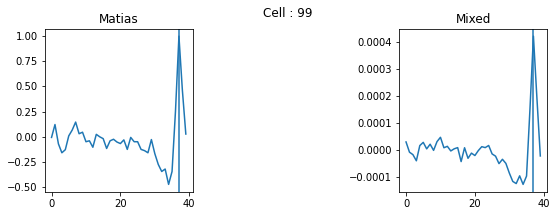

matias : [-1.02287872e+00  1.29755847e+01  1.35164700e+01  1.88297497e+00
  1.83320642e+00  7.26705710e-47]
mixed : [ 0.98795103 13.05250413 13.50925106  1.303836    1.49801247 27.90371216]


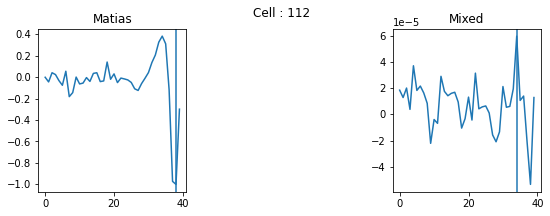

matias : [ 0.95776873 12.54077232 12.15537755  0.97637674  1.6069538  82.44842119]
mixed : [ 1.01767396 12.6627569  12.06576572  0.69198592  0.90875394 87.45349334]


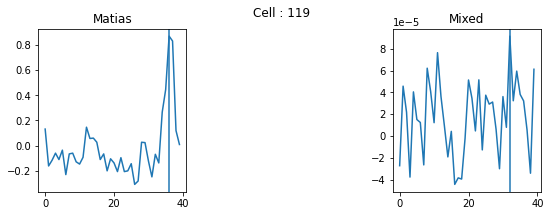

matias : [ 1.0162978  16.24862957 13.75177597  1.82045587  1.73591786 45.90774304]
mixed : [ 1.05025027 16.45420933 13.70458452  1.33224832  1.27799086  8.53844108]


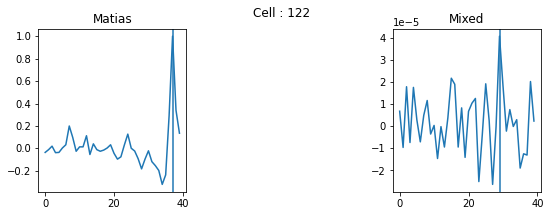

matias : [ 0.19363274  7.91138457 11.7858689   2.31340404  9.58133117 81.88688388]
mixed : [1.99966472 1.99388187 0.66210231 0.22369142 0.28719401 3.1725669 ]


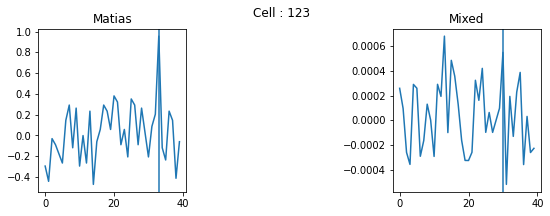

matias : [-0.76699053 18.12950779 13.68282567  2.49792804  1.88135053 27.37745993]
mixed : [ 0.53348614 19.27686239 15.06102323  1.48084789  3.13759309 42.63633619]


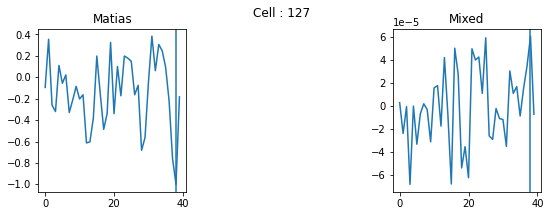

matias : [ 0.8194202  19.03753409  9.52043337  2.35540798  1.64771501 41.43760262]
mixed : [  0.88116035  18.78765738   9.46216175   1.16580689   1.27200122
 106.93504421]


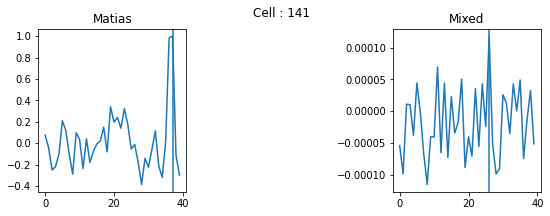

matias : [1.00718535e+00 2.19521830e+01 1.04109638e+01 2.31031453e+00
 1.42135461e+00 5.14023813e-86]
mixed : [9.01352587e-01 2.16813533e+01 1.01453061e+01 2.04445382e+00
 9.57466715e-01 6.00490700e-60]


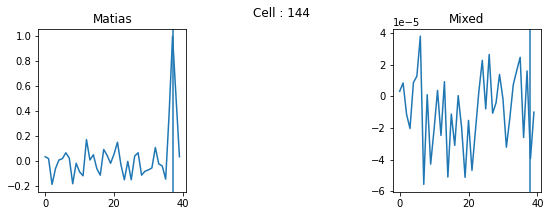

matias : [-0.55229519 26.         27.          0.10043341  0.13505305 29.43781855]
mixed : [5.01482600e-02 2.16055901e+01 1.38324840e+01 3.00000000e+01
 1.38125530e+01 5.43966662e-26]


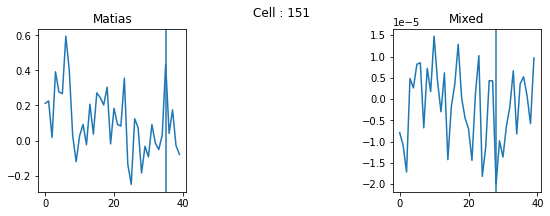

matias : [-1.02044667e+00  1.72044120e+01  1.78558490e+01  1.22950379e+00
  9.53354016e-01  2.74088691e-47]
mixed : [1.23854769e+00 1.70174782e+01 1.75085638e+01 7.56590671e-01
 7.08084802e-01 5.37671835e-49]


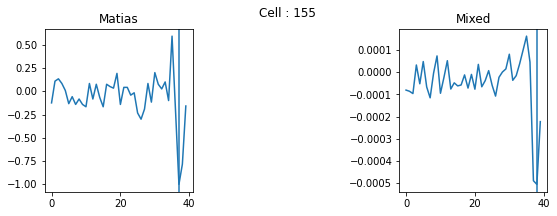

matias : [-7.12982638e-01  1.95963140e+01  1.72267370e+01  3.33888941e+00
  2.04831186e+00  4.17012046e-44]
mixed : [6.34252478e-001 1.99002439e+001 1.70818250e+001 2.27874641e+000
 1.34839005e+000 6.93246977e-199]


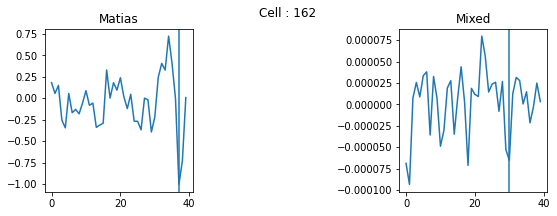

matias : [-0.97281131 11.01206967 14.57044719  0.66474346  1.41854253 50.70163438]
mixed : [ 1.01018742 11.1744187  14.55719474  0.62871028  0.9903672  42.33544484]


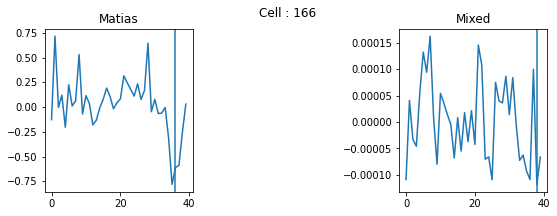

matias : [ 0.35154702 22.91472927 18.95178541  0.1000303   0.28199825  4.42407239]
mixed : [ 0.06225669 27.39431529  7.48320637 30.          8.89796316 45.63750469]


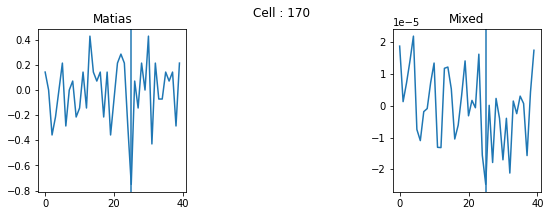

matias : [-1.08373824  7.10118683 22.11824407  0.10024626  1.62052386 27.76268958]
mixed : [ 0.06447393 30.         12.44334212 23.19047077 12.52275106  4.22292315]


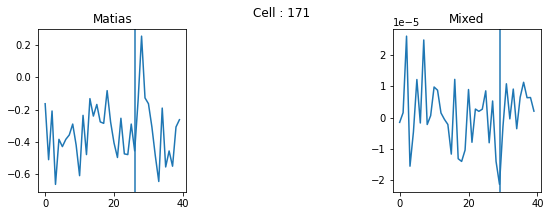

matias : [ 0.92653154 16.3836811  12.0129437   1.49092833  2.48807365 69.94088273]
mixed : [ 0.89327957 16.45996411 12.19447124  1.05519059  1.53151257 44.7843598 ]


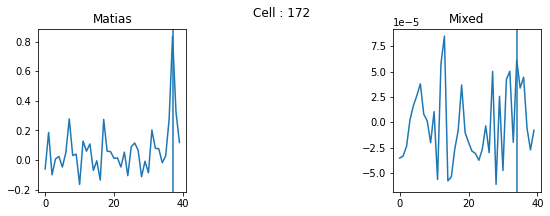

matias : [ 0.81014479 13.94062989  9.09281392  2.08834322  1.39793952 18.44067496]
mixed : [ 0.98765296 13.78044295  9.23997051  1.09620281  1.31896207 92.46471311]


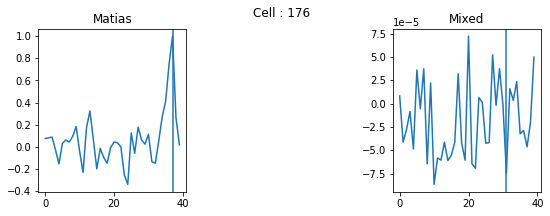

matias : [ 0.57719615 13.16330007 13.69785424  2.29299733  0.5598816  84.46661814]
mixed : [ 2.         21.35177242 10.83075653  0.2511909   0.90739854 33.84156815]


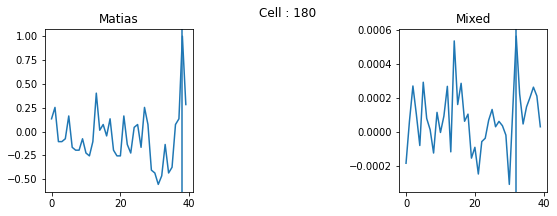

matias : [0, 0, 0, 0.001, 0.001, 0]
mixed : [0, 0, 0, 0.001, 0.001, 0]


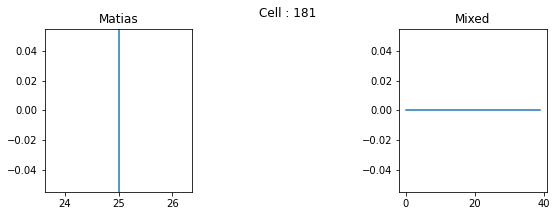

matias : [-6.48115247e-01  1.93737538e+01  1.57228446e+01  2.96575048e+00
  2.56794274e+00  6.34902262e-87]
mixed : [ 0.37205501 19.51890149 15.1907529   1.45441631  3.84225839 35.84488002]


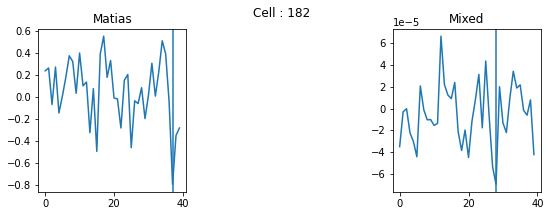

matias : [ 1.18516074  8.61439802  2.9466574   0.1         2.59225425 52.42861347]
mixed : [ 0.04685098 14.20182167 21.96595781 11.74060968 30.         31.0096958 ]


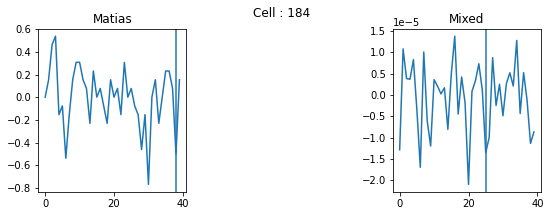

matias : [ 0.88127362 12.60417365  9.1218571   1.4872143   1.30980525 50.45711093]
mixed : [ 0.95950656 12.58517424  9.13338353  1.0220344   0.85357453 29.8537629 ]


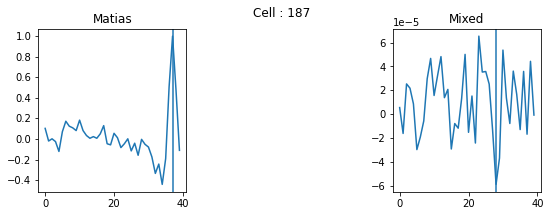

matias : [-1.10727704 18.88683322 10.00035361  0.84309051  1.35358176 84.63475119]
mixed : [ 1.0469401  18.91227289 10.13863423  0.70725764  1.07092451 85.44202971]


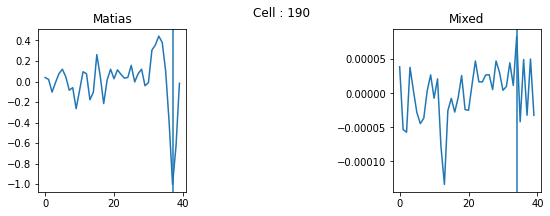

matias : [-1.9999487   6.33918702 12.58688182  0.50220225  0.36206999 20.74044638]
mixed : [ 0.13400743 21.69216235 12.96309601  2.66626531  5.31086754 38.43955014]


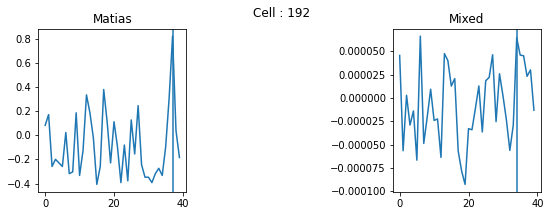

matias : [-1.00183977 22.02031425 11.93451782  1.33393     1.03758148 43.25194284]
mixed : [  1.11689746  22.12975871  12.301665     0.81155742   1.03481522
 116.19467836]


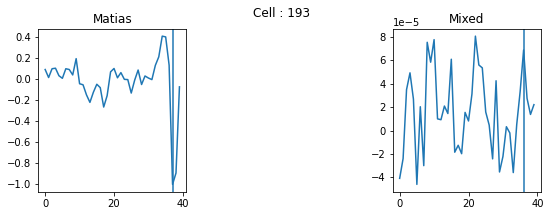

matias : [-9.32359951e-01  1.76942377e+01  1.00726194e+01  1.80908720e+00
  1.47831525e+00  2.59312200e-68]
mixed : [1.05621841e+00 1.76327263e+01 1.00484789e+01 1.55249968e+00
 1.18520909e+00 9.34136941e-58]


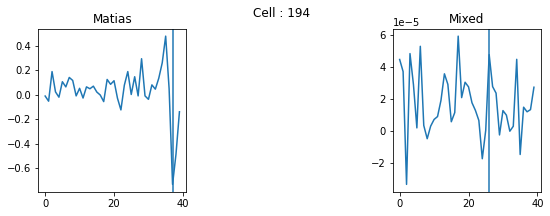

matias : [-0.73640268 23.93516461  9.84045609  1.03889783  1.10782063 32.38671446]
mixed : [6.61106997e-02 3.12517793e-11 2.99899315e+01 3.00000000e+01
 9.23383582e+00 5.33554120e+01]


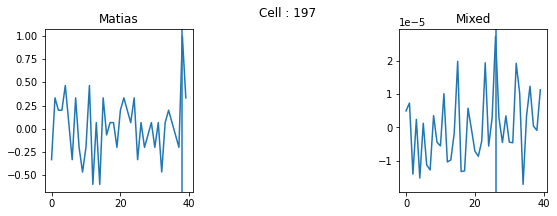

matias : [-1.18571999  7.88938312  8.50171146  0.22615021  2.33142198 46.19888764]
mixed : [1.19272513e-09 2.00000000e+01 2.80000000e+01 3.59873904e-01
 1.53675462e-01 8.83219871e+00]


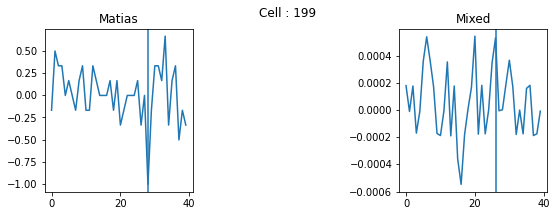

matias : [ 0.76749498 14.35164766 10.5952114   1.75953601  1.92287264 30.65907386]
mixed : [ 0.87954467 13.87431828 10.82755229  1.41878185  0.72516865 20.45187738]


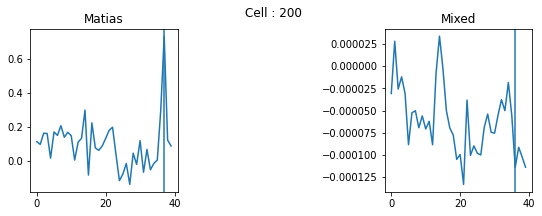

matias : [-0.93232288 16.06540899 16.80207536  1.2511524   0.93521807 16.78716702]
mixed : [ 1.02523729 15.91144636 16.83816335  0.90367931  0.58009148 10.66828973]


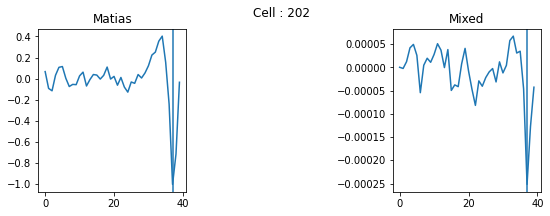

matias : [0, 0, 0, 0.001, 0.001, 0]
mixed : [0, 0, 0, 0.001, 0.001, 0]


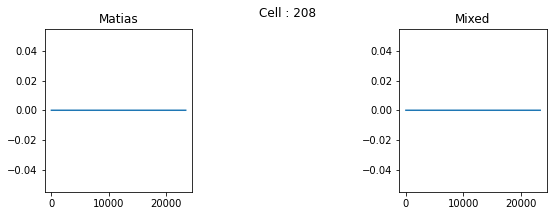

matias : [ 0.93155581 16.93281189 15.59414892  1.75112282  1.47179967 67.47457945]
mixed : [  0.93912112  16.84082469  15.86268146   0.94532164   1.20882001
 149.83633378]


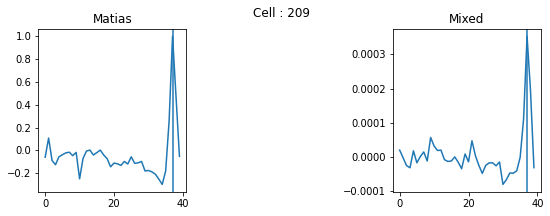

matias : [ 0.86687345 14.49907388 15.27193519  1.90028085  1.72023917 48.26361314]
mixed : [ 0.9023798  14.21514976 15.3333391   1.28739194  1.48744079  2.23708377]


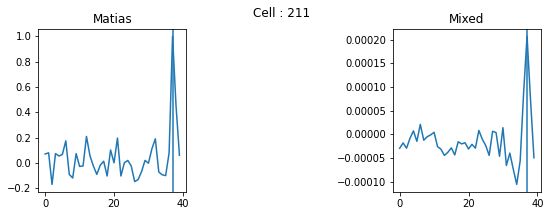

matias : [-1.11343354  9.47810447 15.29120546  1.08925379  1.48343026 44.12101131]
mixed : [ 0.94946272  9.57120131 15.21022741  0.90454961  1.04596276 89.00036289]


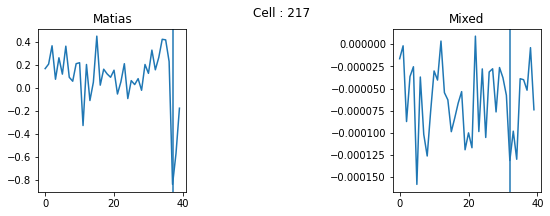

matias : [7.42138935e-01 2.20233079e+01 1.58353274e+01 2.40193906e+00
 1.46547896e+00 3.80401771e-76]
mixed : [ 1.2519966  21.59353221 15.55224319  1.02586938  0.53823016 32.37382855]


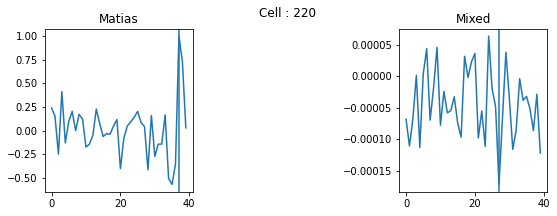

matias : [-0.3497714  17.97282926 28.66408909  5.08295962  0.22328307  2.62543575]
mixed : [6.32143973e-02 9.10776796e+00 2.32938456e-12 1.40129090e+01
 2.73062473e+01 4.32359244e+01]


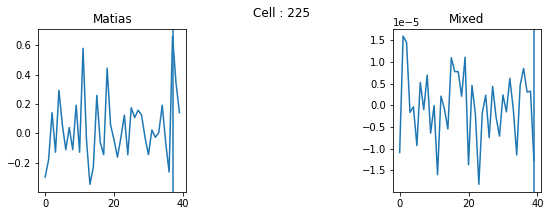

matias : [-1.99999095  1.61699857  1.91069236  1.36984256  0.23196601 33.93709019]
mixed : [ 2.         12.41469576  9.55169855  0.13767872  1.36723787 20.48512459]


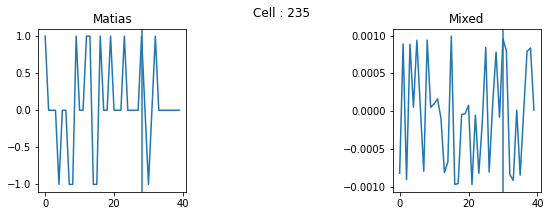

matias : [-1.15886026e+00  1.72386710e+01  1.62043202e+01  1.56866875e+00
  1.16410317e+00  1.15559467e-49]
mixed : [ 1.17848247 17.07256462 16.26719146  0.93731916  1.28563567 97.97076485]


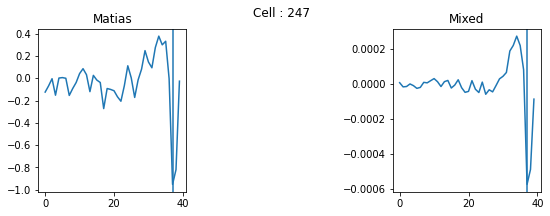

matias : [ 0.64488443 13.95669158 13.76774462  1.56955652  2.39991033 91.87808154]
mixed : [1.06916404e-09 5.00000000e+00 2.80000000e+01 1.03646031e-01
 3.98696964e-01 1.00000000e-10]


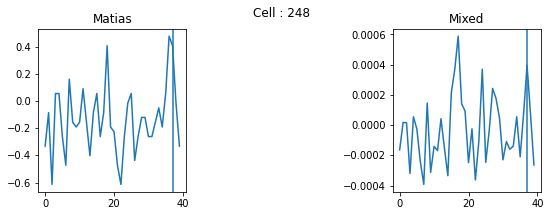

matias : [ 0.97254584 17.81562812 12.81690821  0.10355076  1.70846834 47.31068266]
mixed : [ 0.23445256 15.81523916 17.7605547   0.49569704  4.90599523 22.77546675]


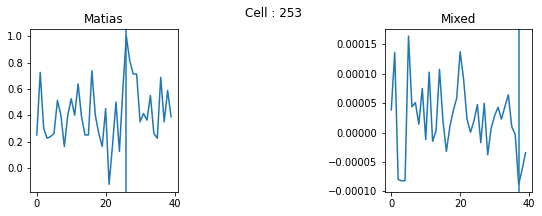

matias : [-6.65997252e-01  4.90843356e-06  5.45802490e+00  2.79562939e+01
  2.75190092e-01  5.13257639e-38]
mixed : [ 1.49338173 28.93684567  0.71207013  0.22965144  0.33701199  0.53468017]


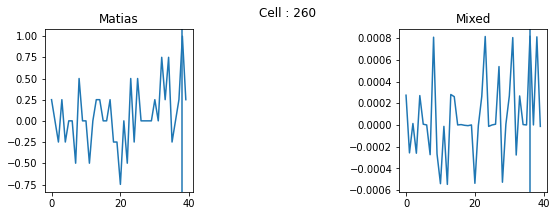

matias : [ 1.99352135 19.70098     6.27585651  0.20704361  2.87301199 41.50399956]
mixed : [-4.46043520e-13  1.40000000e+01  7.00000000e+00  3.50063338e-01
  1.10981564e-01  9.35905381e+00]


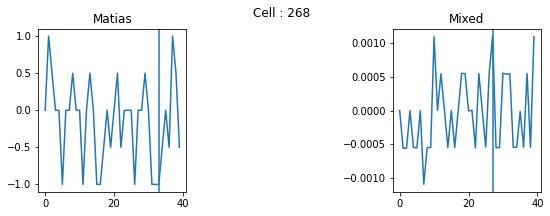

matias : [ 0.79001813 13.95488156  9.94342455  1.72007287  2.45083326 50.92590475]
mixed : [ 0.96434616 13.7039908  10.18171494  0.92116831  1.29766701  9.73806105]


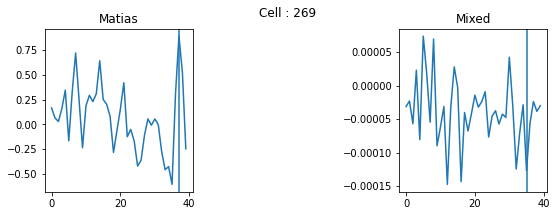

matias : [ 0.92174467 14.2874414   9.02374443  1.76051645  1.4765068  21.89685442]
mixed : [ 0.98195137 13.74483759  9.34806926  1.25740342  0.97068259 42.56800475]


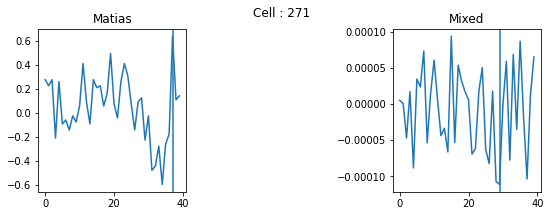

matias : [-1.16389720e+000  2.14435143e+001  1.10984167e+001  1.27237955e+000
  9.80833723e-001  4.46054844e-114]
mixed : [ 1.03071838 21.53815989 11.09411048  0.75079801  1.24523429 75.84860972]


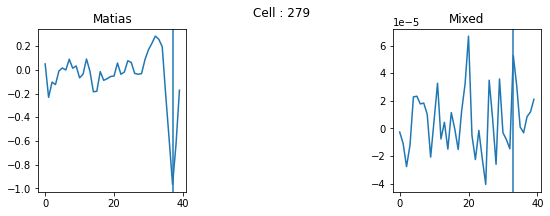

matias : [ 0.57891829 16.8168015  12.7927242   1.59982008  4.49732563 55.970058  ]
mixed : [6.30271525e-02 1.65941124e+01 1.20121718e+01 6.14553073e+00
 1.62484761e+01 6.40776840e+01]


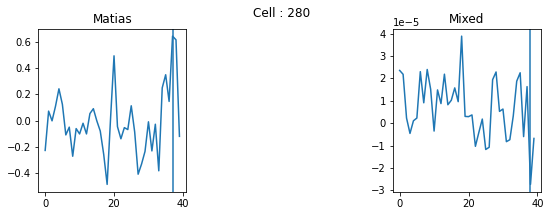

matias : [ 1.03325467  2.17661434  3.60271284  1.37449433  0.52957014 28.61006221]
mixed : [ 1.20691853  2.66477948  3.19490999  0.78219887  0.41299799 57.8561255 ]


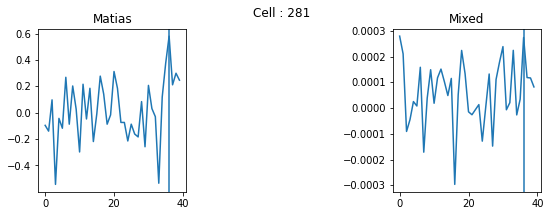

matias : [ 1.16408313 15.66807181 13.47123999  0.99733194  1.56286203  8.04232209]
mixed : [ 1.11018438 15.77463667 13.67882455  0.81602446  1.39059581  2.89183163]


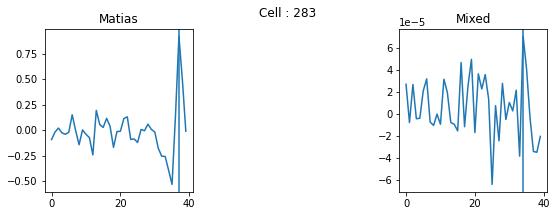

matias : [4.54693335e-10 1.30000000e+01 1.50000000e+01 1.20138705e-01
 1.63974461e-01 2.86624117e+01]
mixed : [ 1.00004286  9.99784657  6.00009436  0.23108758  0.22226056 39.46184082]


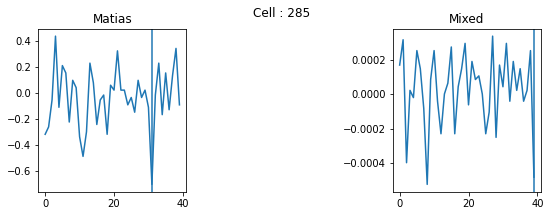

matias : [-1.01031277 17.08215729 17.7668533   1.3237928   0.72760352 39.41342674]
mixed : [ 1.11169763 17.14359282 17.79010604  0.96316804  0.74271449 51.47843851]


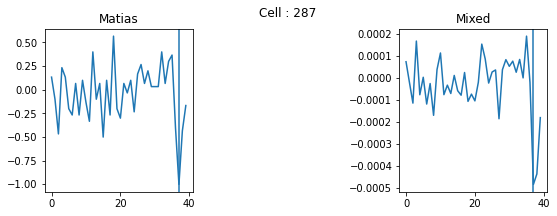

matias : [ 1.009278   12.47919873 15.03541897  0.78453537  1.86471663 16.84957572]
mixed : [ 1.06629553 12.69875946 15.09574751  0.77678437  1.1022327  19.97202288]


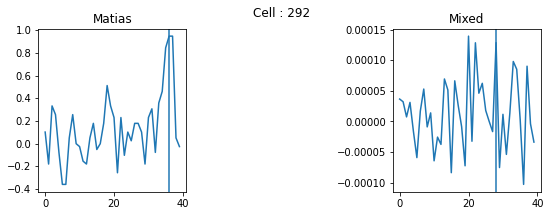

matias : [ 0.93244757  9.93836295  6.11584291  1.00422227  1.51840311 31.94818318]
mixed : [ 1.2549915   6.85520381  8.70992602  0.91160744  0.51910271 38.97409574]


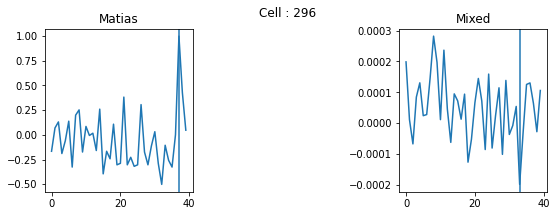

matias : [ 0.9782981  16.69193663  8.72305524  1.95467839  1.36478464 11.81956872]
mixed : [ 0.87058227 17.09558945  8.72838947  1.62782956  1.04668788  4.65502332]


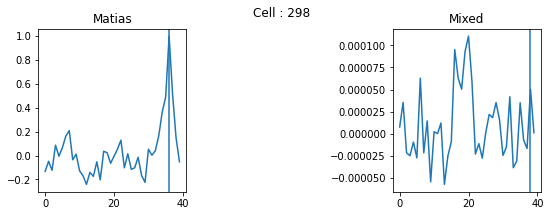

matias : [ 0.96136285 12.65363624  9.26308197  1.32495598  1.52492845 66.17459456]
mixed : [9.35659491e-01 1.28364543e+01 9.14688703e+00 9.34396271e-01
 1.05879061e+00 5.87710442e-17]


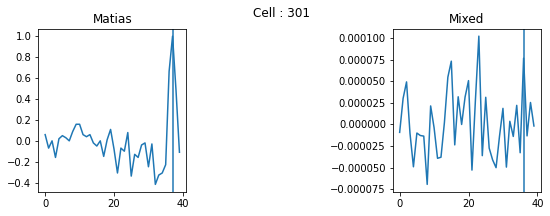

matias : [-5.50101051e-01  2.05277888e+01  1.03145265e+01  1.82888393e+00
  1.18860780e+00  1.48209543e-29]
mixed : [2.32306894e-001 2.06676471e+001 1.00503372e+001 2.27224591e+000
 1.39558186e+000 3.35000556e-141]


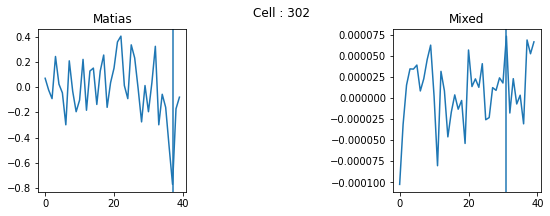

matias : [ 1.0147318  19.36172986  9.68390533  2.38037067  0.29985276 19.52226194]
mixed : [  1.99999989  18.72385968   9.73918199   0.31908971   0.45854014
 124.95975142]


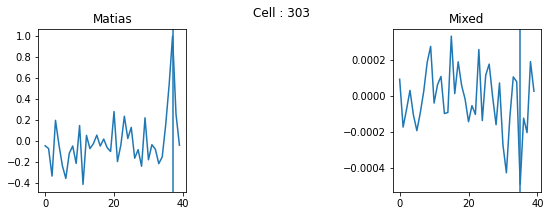

matias : [ 0.91146496 13.28291571  9.4515298   1.62604429  2.03686916 75.41878826]
mixed : [  0.83137246  13.06429745   9.4757794    1.25599761   1.17914854
 180.        ]


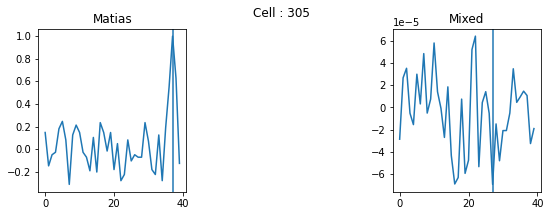

matias : [ 0.79113354 12.32886332  9.17552299  1.54087062  1.59852928 52.7102838 ]
mixed : [ 0.91250923 12.14704509  9.09968181  1.02752211  0.82232474 34.7811598 ]


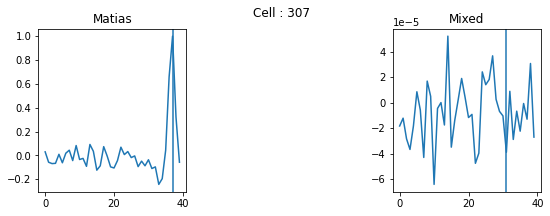

matias : [7.69862904e-01 1.96789728e+01 1.00728403e+01 1.84781561e+00
 1.54599421e+00 1.04771667e-76]
mixed : [ 1.08513548 19.5085821  10.04630435  0.71209914  1.05873357 87.2776005 ]


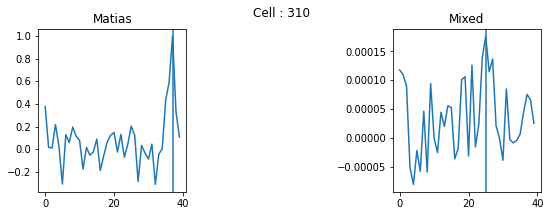

matias : [-0.90917258 15.5205788  10.4523465   1.65400633  0.98096298  8.71445668]
mixed : [ 1.09487258 15.52204046 10.28464032  1.10414512  0.39459983 18.46087651]


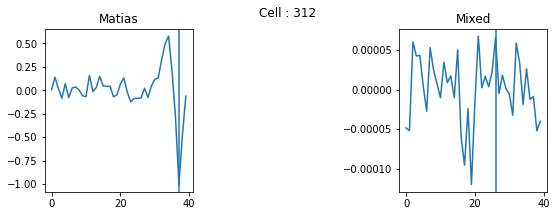

matias : [ 0.91796633 19.77374033 10.8503352   1.35684793  1.98791147 10.48881936]
mixed : [ 1.08694113 19.89250029 10.99914131  0.83563525  1.36215386 17.45820152]


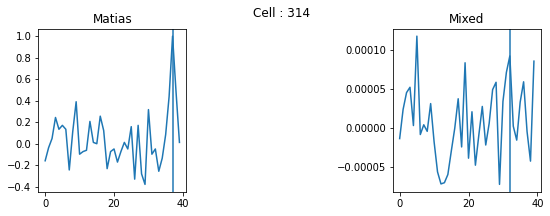

matias : [3.65260999e-01 1.10000000e+01 1.00000000e+01 1.13021685e-01
 1.06663811e-01 1.00000000e-10]
mixed : [ 1.82795285 28.42939295 19.57061263  0.8494165   0.10001014 37.06916549]


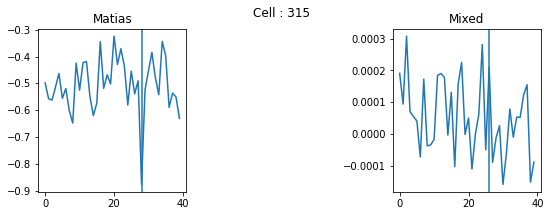

matias : [-0.98744716 18.59190926 13.87864369  1.08667141  1.69183033 68.03020816]
mixed : [ 0.75953432 18.93022487 13.98944681  0.8883085   1.57556035 70.21394395]


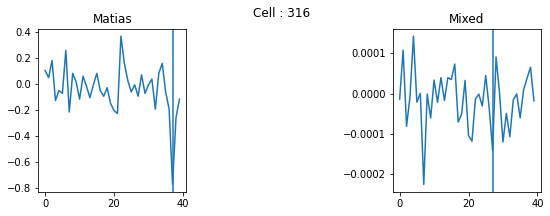

matias : [-1.02737164e+00  1.14344247e+01  1.26651509e+01  1.60492897e+00
  1.25959047e+00  7.59176710e-60]
mixed : [ 1.04826123 11.36214006 12.69759877  0.93566988  1.21171872 57.77278869]


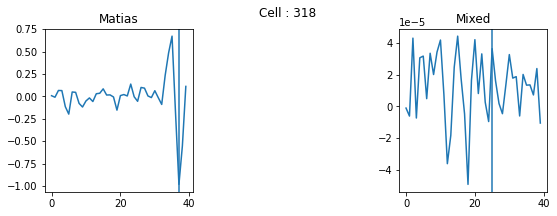

matias : [-1.06646877 27.30137007 12.42891518  0.1482971   4.1738738  37.57239233]
mixed : [ 0.04037265  3.85690248 10.49530713 17.50141443 30.          8.32054949]


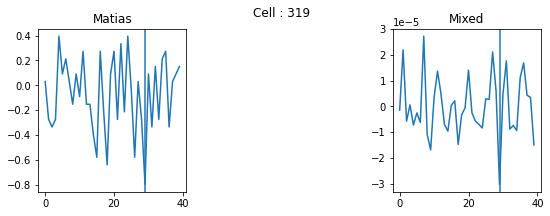

matias : [ 0.7249318  18.39770994 17.21362385  2.40538673  1.11619906  3.56286323]
mixed : [7.36504553e-01 1.84937073e+01 1.71882918e+01 1.96479490e+00
 7.16688493e-01 2.65329616e-30]


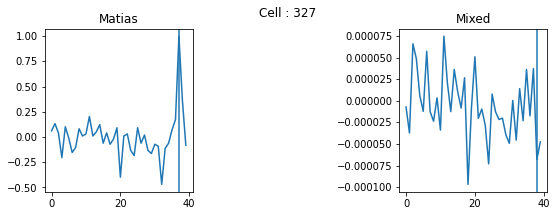

matias : [ 0.54247616 14.17782774  9.79366461  1.26728112  2.56793786 36.70763583]
mixed : [ 0.9964382  29.50766054  1.99712867  0.1        29.95085691 13.9897446 ]


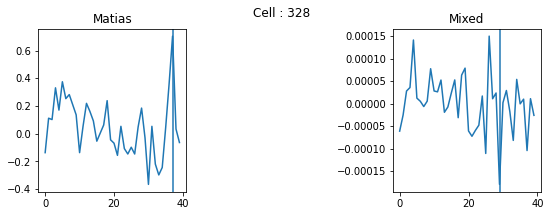

matias : [-1.11472744e+00  1.25971209e+01  1.02545735e+01  8.54359802e-01
  9.88938521e-01  2.29032041e-11]
mixed : [ 0.95801093 12.91826464 10.15069704  1.11907389  1.02482924 67.04421592]


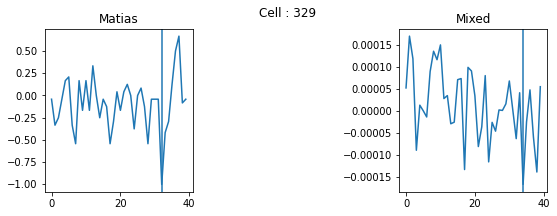

matias : [ 1.99992317 21.49793641 26.57335023  0.29931637  0.82064659 11.38535874]
mixed : [ 1.49294203 15.63623457 16.27196071  0.1001351   0.9323924  27.97888792]


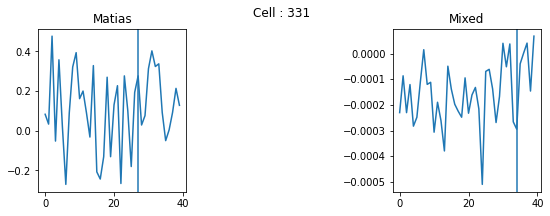

matias : [-1.99998382 23.54367272 19.26773527  0.33339263  0.57106601 42.88808636]
mixed : [3.98186141e-02 1.46937013e+01 1.71251892e+01 3.00000000e+01
 1.99197245e+01 5.95781946e-22]


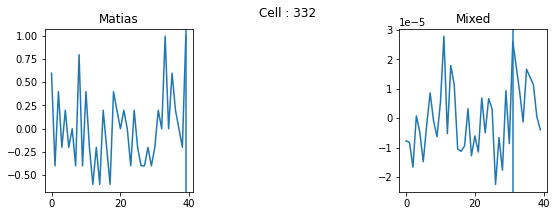

matias : [ 0.97344492 16.81393013 10.50981956  0.51895805  1.64369795 66.40861453]
mixed : [ 1.25828748 16.63845826 10.41128933  0.39418505  1.33236197 60.95439343]


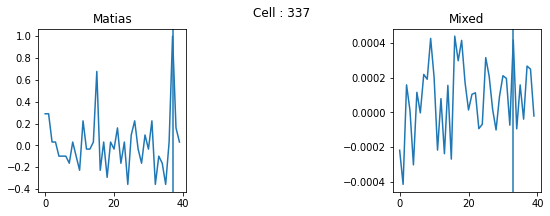

matias : [6.24963541e-01 1.60073404e+01 1.10831698e+01 3.09526891e+00
 2.81069878e+00 4.16246646e-38]
mixed : [ 0.67615984  1.75982988  2.31469052  0.1        16.69966752 50.2635873 ]


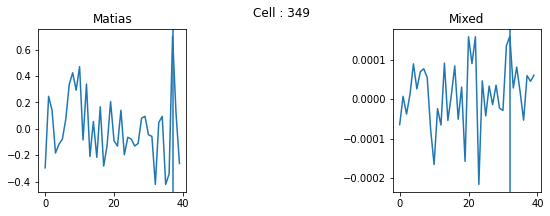

matias : [7.23126723e-01 2.20082296e+01 9.50661290e+00 2.49145815e+00
 1.62299486e+00 5.65420777e-70]
mixed : [ 0.86728803 22.50290711  9.67768436  0.76704624  1.80854834 44.47554576]


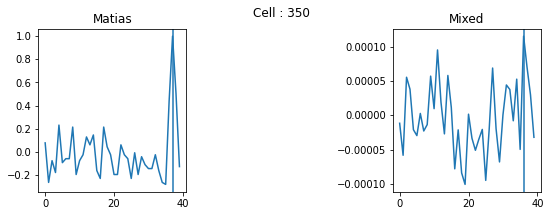

matias : [ 0.67718093 23.05058407  9.0472466   3.21098989  1.48341027 23.28511375]
mixed : [ 1.17146843 23.745497    8.80164609  0.3971169   1.34377776 20.78530597]


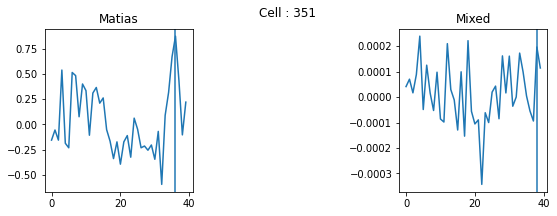

matias : [ 0.33945437 12.9079192  29.9999986   0.1        21.63479251  6.55498675]
mixed : [-1.48094023e-09  5.00000000e+00  1.40000000e+01  4.65195878e-01
  1.78866066e-01  2.99618963e+01]


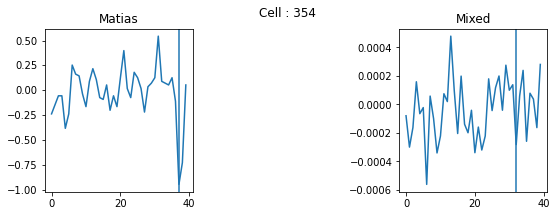

matias : [-1.94560421  3.54577527 29.60056429  0.71714901  0.26506009 20.44191278]
mixed : [4.44772112e-02 9.65428033e+00 4.19027645e+00 1.71841284e+01
 3.00000000e+01 5.23522547e+01]


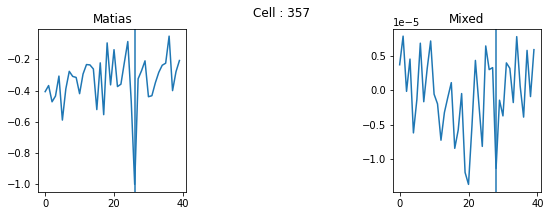

matias : [ 0.69618642 20.25488521 16.37796846  1.67440394  2.31621163  1.15359476]
mixed : [ 0.97274821 20.40601228 16.66799988  1.49426133  0.60972877 25.44456378]


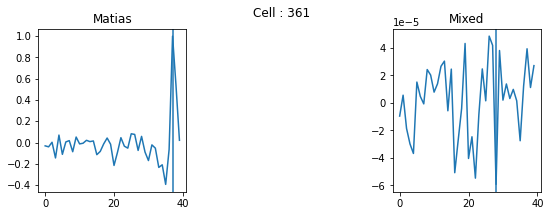

matias : [1.97850318 1.12106955 0.76712727 0.17310729 0.25186624 1.18594472]
mixed : [ 1.89530302 11.97215882  0.64162296  0.19933324  0.31581382 12.15788689]


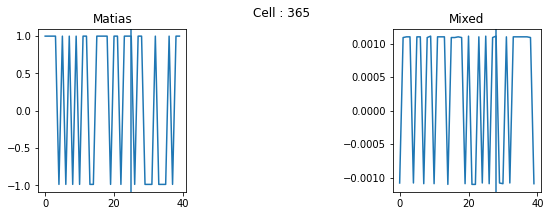

matias : [-1.15181409 16.09233926 15.86620338  1.38781867  1.2213919   0.5202684 ]
mixed : [ 1.15371021 16.01819846 15.99653594  1.06215392  1.00736278  4.8990581 ]


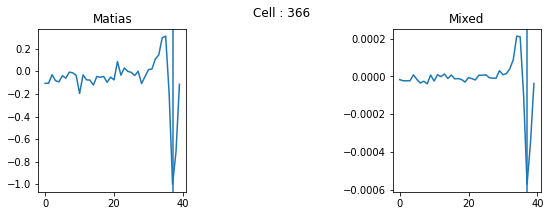

matias : [ 1.43786357 19.81756829  7.88026227  0.1         2.3864143  34.39257047]
mixed : [ 0.39823342 11.08888021 15.00752175  1.32454928  2.09447546 57.39960308]


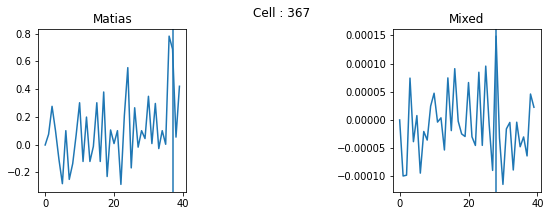

matias : [ 1.05773947 16.73800073 12.98594269  1.85636496  1.55854538 31.33785503]
mixed : [1.01358614e+00 1.66826627e+01 1.28851058e+01 9.64825598e-01
 1.40476943e+00 2.17474976e-56]


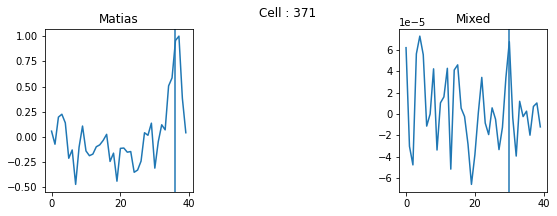

matias : [-1.11798686 19.44254592 15.32607518  1.09404028  0.65300062 69.19142661]
mixed : [ 1.36207497 19.43790801 15.60283821  0.85991275  0.5767341  14.43560918]


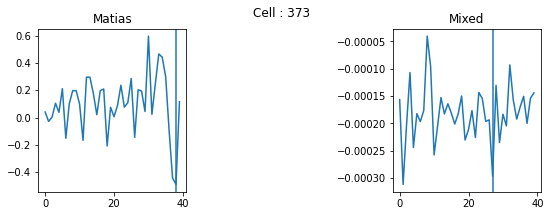

matias : [1.53351383e+00 1.94879804e+01 9.32263583e+00 1.22306254e+00
 2.88009763e-01 2.00497500e-08]
mixed : [ 0.96758333  6.11502589  6.74330987  0.1         5.07980082 29.92934704]


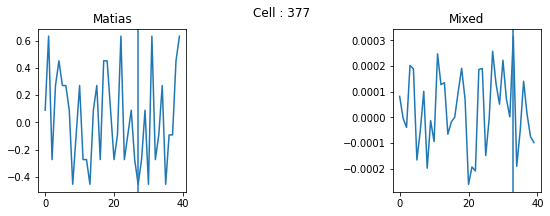

matias : [-0.99138238 13.15817037 10.9913601   1.14810143  0.93373655 70.47654996]
mixed : [ 1.09925999 13.15569939 10.93106441  0.77018728  0.82230834  8.16335643]


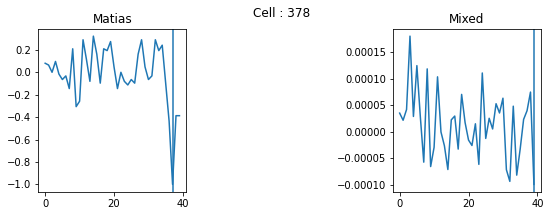

matias : [ 0.91725711  5.84486814  7.6038096   1.74925762  1.45544057 29.77873907]
mixed : [1.15258883e+00 5.70918256e+00 7.63224857e+00 1.00845776e+00
 1.26793224e+00 1.35397104e-10]


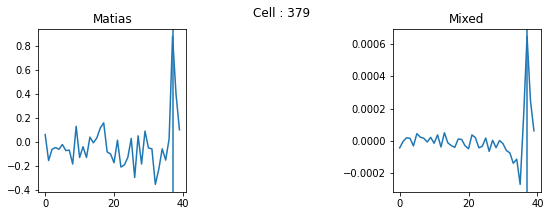

matias : [-1.7964031   1.58547661 22.17817308  0.10032895  0.86462582 25.46423973]
mixed : [ 0.75423295 13.06112872 11.14629468  0.91749362  1.43926878 16.56508761]


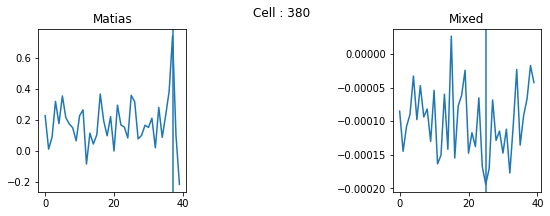

matias : [0, 0, 0, 0.001, 0.001, 0]
mixed : [0, 0, 0, 0.001, 0.001, 0]


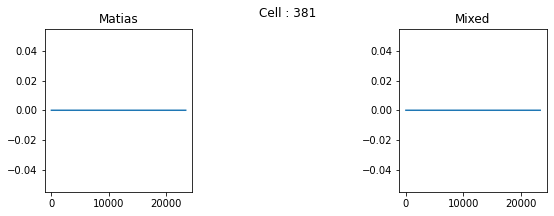

matias : [ 1.8393569  27.72791622  3.46023267  0.1         1.86225867 36.86298531]
mixed : [ 1.58421067 22.60708261 19.21638368  0.11571724  0.91369922 26.82619766]


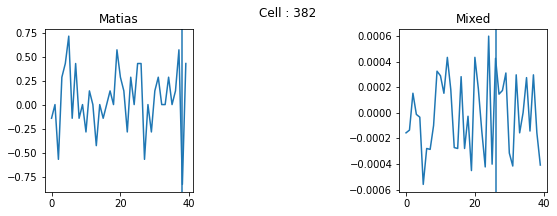

matias : [ 0.8953153  15.54291228 10.22541938  1.66855467  2.16891791 61.29197912]
mixed : [8.37261239e-01 1.48518048e+01 1.00015749e+01 1.77497440e+00
 7.29341233e-01 3.05560373e-78]


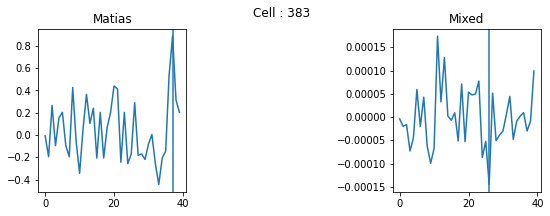

matias : [ 0.99720195 15.94160081  9.79613917  1.16362037  1.44792353 44.26628373]
mixed : [8.46692437e-01 1.58608636e+01 9.77948787e+00 1.26599943e+00
 9.00229845e-01 5.10057887e-64]


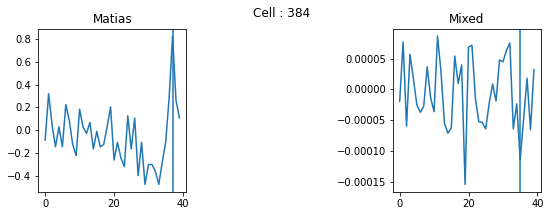

matias : [-1.03564391e+00  1.70372059e+01  1.06758889e+01  7.71401741e-01
  1.42700973e+00  3.46906527e-31]
mixed : [ 1.13804926 17.21180922 10.57518302  0.74669304  1.00658184 36.19140079]


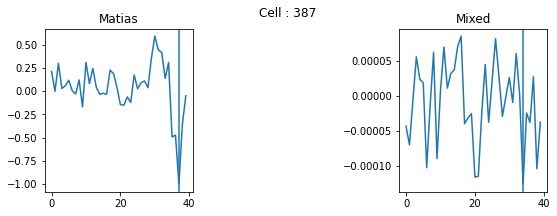

matias : [ 1.04571138 15.28041429 10.64862271  2.42049605  1.58003735  8.35884205]
mixed : [ 0.98354734 15.18686769 10.59215252  2.19332025  1.13100958  5.00845439]


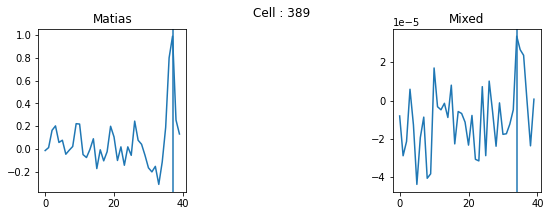

matias : [0, 0, 0, 0.001, 0.001, 0]
mixed : [0, 0, 0, 0.001, 0.001, 0]


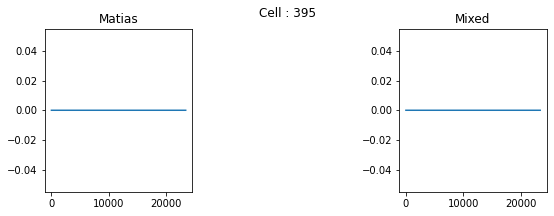

matias : [1.18640463e+00 2.14739504e+01 1.15911501e+01 1.76935806e+00
 1.29047709e+00 6.06657462e-25]
mixed : [1.06718062e+00 2.14436151e+01 1.15369600e+01 1.66666219e+00
 1.19116596e+00 2.27388970e-97]


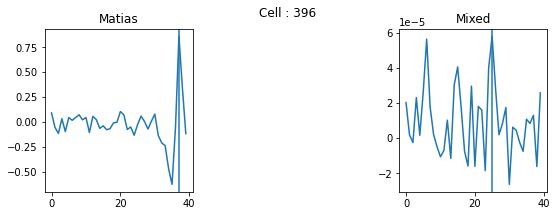

matias : [-0.64132751 22.67731241 11.38378118  2.95493908  0.60885532 40.84834615]
mixed : [5.19325912e-02 1.67563114e+01 1.66079700e+01 1.00457147e+01
 1.24166523e+01 1.73636954e-28]


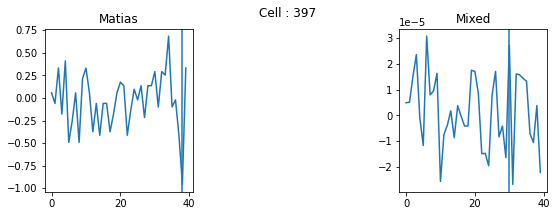

matias : [-1.34116321 23.51772358 11.86984027  0.24542394  4.40476106  2.39427946]
mixed : [2.74441652e-02 8.89360212e+00 1.36524016e+01 9.97575273e+00
 2.04008036e+01 6.27083788e+01]


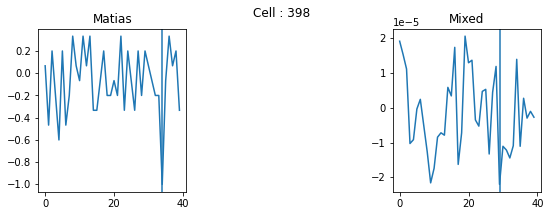

matias : [-0.79573993 20.0095878  11.91921999  1.60274586  1.39946829  4.62537957]
mixed : [ 0.79899286 21.24653682 12.48065863  0.54735748  1.80204385 51.19912569]


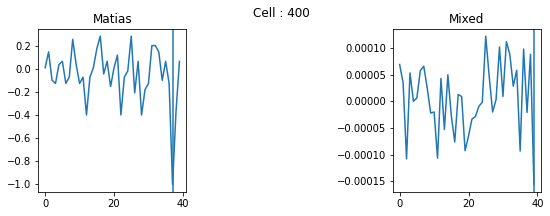

matias : [-0.9789371  18.93601216 13.53399651  1.34612186  1.68334379 94.83498135]
mixed : [ 0.90868282 19.08248397 13.43010885  0.97737162  1.05683949 53.41936494]


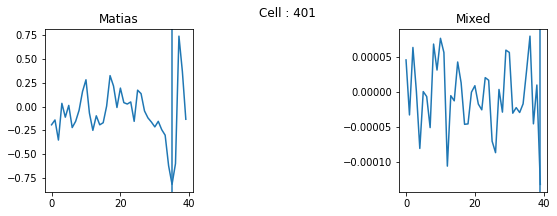

matias : [ 0.86565911 14.08120393 17.43900697  1.66499841  1.2171845   7.74589191]
mixed : [ 0.71379931 13.04907597 16.94974462  0.69746348  1.76553615  9.49866794]


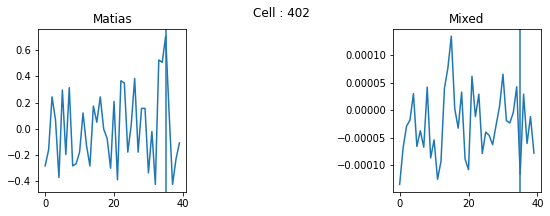

matias : [1.98213352 6.25438646 0.92678457 0.2318372  0.10013373 9.89068204]
mixed : [ 0.04170535  6.58522861 11.12961804 15.16815379 30.         31.66363802]


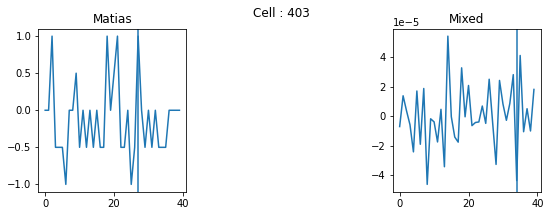

matias : [ 0.95751616 14.2740866  15.16289298  1.56184063  1.97683106 14.0048593 ]
mixed : [ 0.92699462 14.17975503 15.49556379  1.08488181  1.4426027  13.34985083]


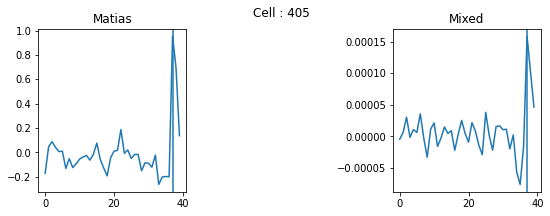

matias : [9.40548403e-01 1.42890635e+01 1.50666097e+01 1.64200638e+00
 1.90640903e+00 9.95348535e-39]
mixed : [8.39601013e-01 1.42410103e+01 1.50913069e+01 1.25281671e+00
 1.63246025e+00 3.34568192e-37]


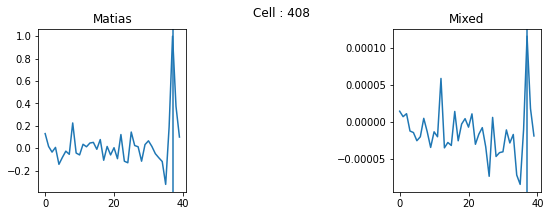

matias : [ -1.07365831  12.25478752  10.05129365   0.8834536    1.53911498
 106.43098295]
mixed : [ 0.96708417 12.18575396  9.81275028  1.32454404  0.88194731 54.94181034]


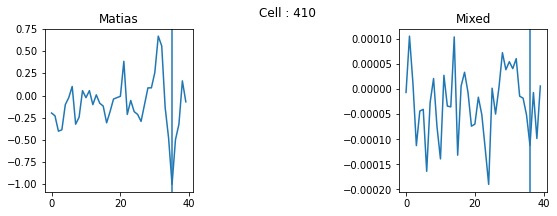

matias : [ 1.15731247 11.35663858 12.03416126  0.8111857   1.4654934  13.9551976 ]
mixed : [ 1.57567055 11.36062369 11.89295222  0.39710187  0.57942961  8.91442014]


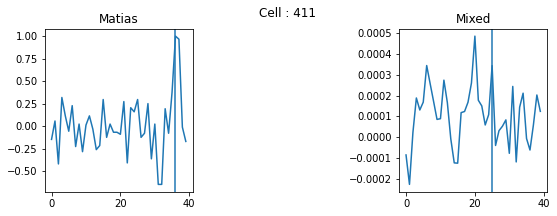

matias : [-1.99990279 18.98378333  8.6879363   0.12856376  1.61698193 32.50264202]
mixed : [4.69361115e-02 1.46276702e+01 3.00000000e+01 1.18555556e+01
 2.73036481e+01 1.13223901e-28]


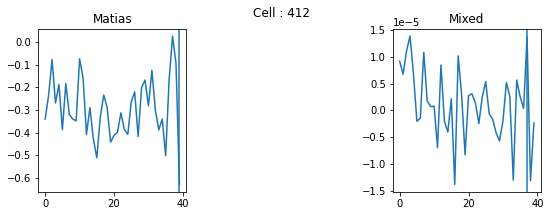

matias : [ 0.4860279  26.00077228 13.77687461  0.10204388  1.53333135  0.71391553]
mixed : [ 1.00000199  2.00046638 11.0002071   0.20671169  0.24563685 42.76976523]


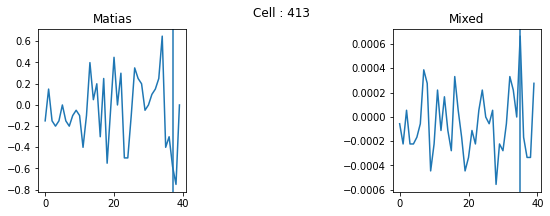

matias : [-0.93961334 13.04494657 16.12834674  1.10518508  0.87412563 25.40164461]
mixed : [ 0.80811406 28.3030404  30.          0.1        10.69687052 21.781322  ]


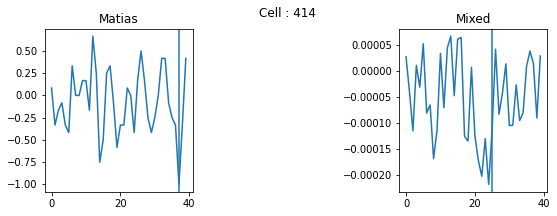

matias : [ 0.99388956  5.60431973  7.76035421  1.56833505  1.3318227  61.65840556]
mixed : [1.13186830e+00 5.59714551e+00 7.72580557e+00 9.94189238e-01
 1.17215997e+00 6.15892845e-16]


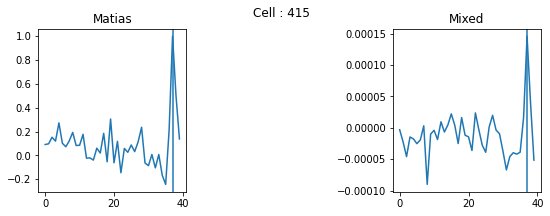

matias : [8.90383901e-01 1.32339595e+01 1.17182884e+01 1.48998624e+00
 1.52526386e+00 4.28103451e-59]
mixed : [ 1.08550783 13.28135749 11.80509489  0.90788842  0.86299787 28.61170052]


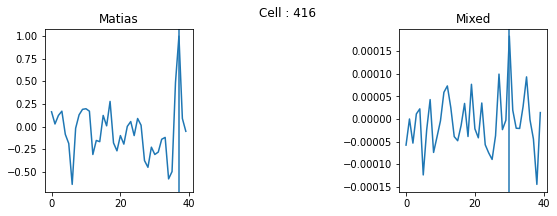

matias : [ 0.85180767 19.42965448  8.06600498  2.53219292  0.92157735 19.4337621 ]
mixed : [ 0.94603977 19.70665983  7.91287183  2.11815117  0.77131723 23.08065309]


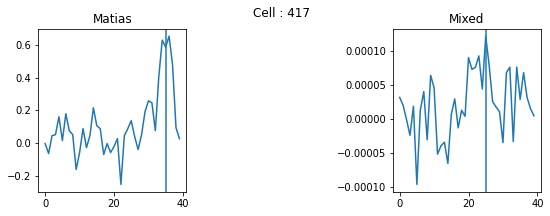

matias : [ 0.52610015 30.         23.87619451  3.58834496  0.63369301 25.29029476]
mixed : [-1.30673311e-15  1.60000000e+01  4.00000000e+00  2.02170719e-01
  2.02354138e-01  1.05482591e+01]


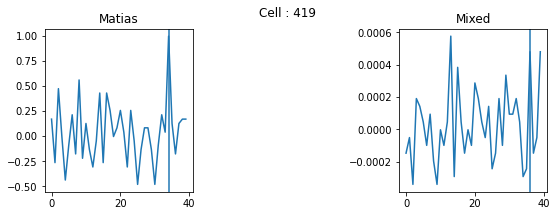

matias : [-1.11290763 17.03537573 10.16379798  0.67910194  1.1482013  29.91192163]
mixed : [ 1.07785595 17.02016683 10.54914008  0.57911823  1.30993177 18.61728044]


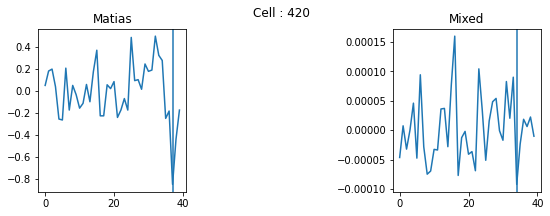

matias : [ 0.65823107 12.60070042 26.76335632  4.00419383  0.2991695   9.59383764]
mixed : [-1.42254795e-10  1.20000000e+01  1.80000000e+01  3.93978818e-01
  1.66408750e-01  3.02070099e+01]


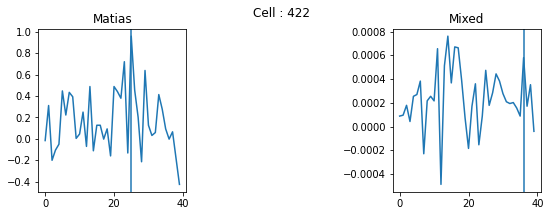

matias : [-0.99343255 20.128659   10.26928988  0.66743019  0.89629476 66.7276499 ]
mixed : [ 2.         20.38672482 10.32906944  0.63454238  0.33838515 43.50504913]


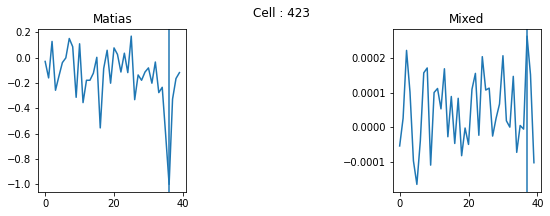

matias : [-0.33242289 14.79035833 26.1029472   0.43196469  8.55672836 10.57966193]
mixed : [ 0.91359475 10.86273957 16.84742902  0.1         5.37461978 50.1741825 ]


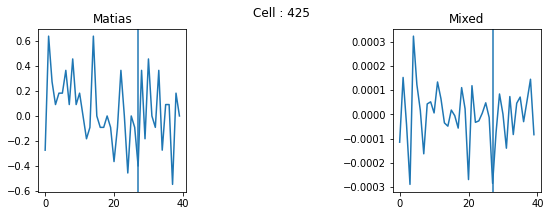

matias : [ 1.17970298 22.95447985 15.28464568  0.8104565   0.43074263 31.19126513]
mixed : [ 0.95273525  6.44504418  7.15422741  0.1         3.96094751 51.34476676]


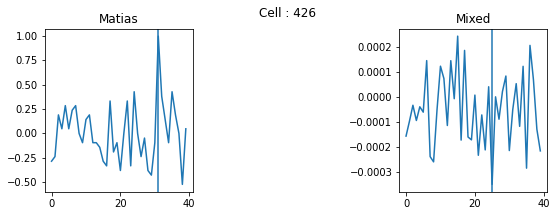

matias : [ 0.60532573 12.07243032  9.52614723  1.58888371  1.99925328 15.69785893]
mixed : [ 2.         12.56234764  8.59420294  0.42560822  0.50606552 48.13338104]


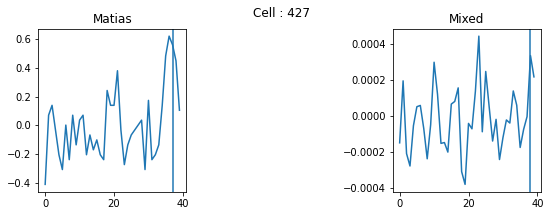

matias : [ 0.69567284 18.50272573  9.30096001  2.0402282   0.87123995  8.21398779]
mixed : [4.62296457e-02 1.93310932e+01 1.43484867e+01 1.06556693e+01
 2.62450557e+01 8.59167479e-30]


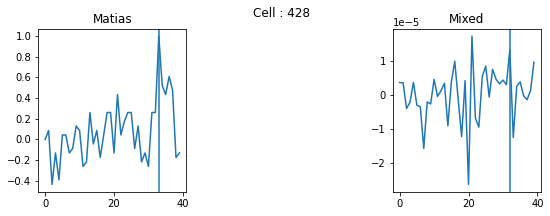

matias : [1.9931979  4.25906747 0.79968713 2.09444638 0.10003363 0.25843124]
mixed : [-1.84110244e-08  1.50000000e+01  2.90000000e+01  1.27160061e-01
  5.23634659e-01  1.03927088e-06]


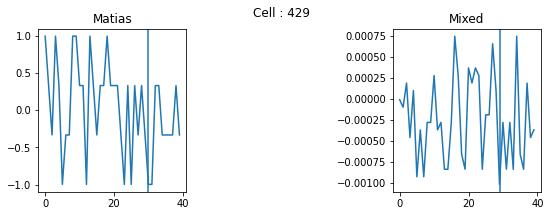

matias : [ 0.98269139 10.4089184   3.80257208  1.82275801  1.53069412 43.83867481]
mixed : [ 1.05460005 10.43870524  4.02126529  1.24826596  1.09359625 33.84948418]


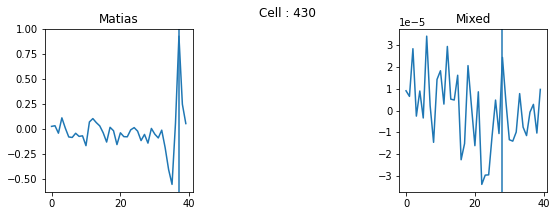

matias : [-1.08542455 20.86640487 12.96675887  0.859158    0.88762535 82.48261578]
mixed : [ 1.00328502 20.95267481 12.9737542   0.69534486  0.65377203 39.27447656]


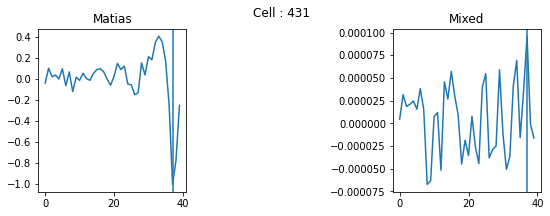

matias : [1.18040721e+00 2.35367848e+00 2.62792508e+01 3.34712518e-01
 5.58628197e-01 3.29953952e-05]
mixed : [5.37509442e-02 2.74738663e+01 2.99999941e+01 3.00000000e+01
 3.00000000e+01 1.79632328e+02]


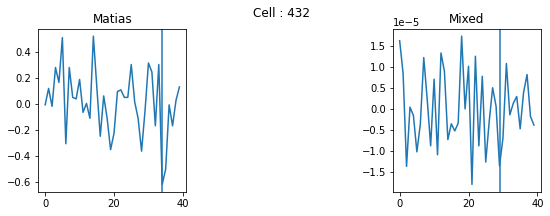

matias : [0, 0, 0, 0.001, 0.001, 0]
mixed : [0, 0, 0, 0.001, 0.001, 0]


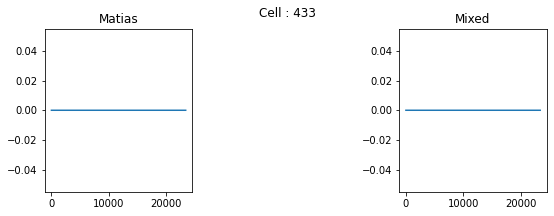

In [30]:
"""
    Variable
    
    You will find here all variables used in this notebook cell. They should always refere to your 'params.py' file
    except if you want to manually change some variable only for this run (i.e. debugging). You may have to add those
    variable into the function you want to adapt as only the minimal amount of var are currently given to functions as inputs.
"""

output_directory = params.output_directory

"""
    Input
"""

# path = 'E:\Exp_17_for benchmark\RF_m1'
fitted_file = os.path.normpath(os.path.join(output_directory,'sta_data_3D_fitted.pkl'))

"""
    Processing
"""

sta_data = load_obj(fitted_file)

for cell_id in sta_data.keys():
    
    fig = plt.figure(figsize=(9,3))
    plt.subplots_adjust()
    fig.suptitle(f'Cell : {cell_id}')
    gs = GridSpec(1, 3, figure=fig)
    
    matias  = sta_data[cell_id]["center_analyse"]  
#     gabriel = sta_data[cell_id]["surround_analyse"]
    mixed   = sta_data[cell_id]["analyse_sta"]
    
    try:        
        ax1 = fig.add_subplot(gs[0,0])
        ax1.plot(matias['Temporal'])
        ax1.axvline(matias['Cell_delay'])
        ax1.set_title('Matias')

#         ax2 = fig.add_subplot(gs[0,1])
#         ax2.plot(gabriel['Temporal'])  
#         ax2.axvline(gabriel['Cell_delay'])
#         ax2.set_title('Gabriel')
        
        ax3 = fig.add_subplot(gs[0,2])
        ax3.plot(mixed['Temporal'])
        ax3.axvline(mixed['Cell_delay'])
        ax3.set_title('Mixed')
        
        
    except:
        print(f'Print failed for cell {cell_id}')
        pass
    
    m=matias['EllipseCoor']
#     g=gabriel['EllipseCoor']
    mixed = mixed['EllipseCoor']
    
    print(f'matias : {m}')
#     print(f'gabriel : {g}')
    print(f'mixed : {mixed}')
    plt.show(block=False)
